In [1]:
import pybedtools as pbt
import pysam
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as ss
from sklearn.linear_model import LinearRegression
import csv
from keras.models import load_model
from pkg_resources import resource_filename
from spliceai.utils import one_hot_encode
from maxentpy import maxent
from collections import Counter

Using TensorFlow backend.


In [2]:
import altair as alt
alt.data_transformers.enable('json')

DataTransformerRegistry.enable('json')

In [3]:
import os.path as op

In [4]:
import seaborn as sns

In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
import splanl.junction_scorer as jn
import splanl.merge_bcs as mbcs
import splanl.coords as cds
import splanl.plots as sp
import splanl.score_motifs as sm
import splanl.inspect_variants as iv
import splanl.post_processing as pp
import splanl.custom_splai_scores as css
import splanl.create_vcf as vcf

In [7]:
chr11 = '/nfs/kitzman3/lab_common/refs/human/ucsc_hg19/bychrom/chr11.fa'
chr11_seq = pp.get_refseq( chr11 )[ 0 ]

In [8]:
fa_file = '/nfs/kitzman2/jacob/proj/jensplice/20220415_wt1_mpsa_trial3/jkp1053_1054_1055.fa'
refseq = pp.get_refseq( fa_file )[ 0 ]

In [9]:
isos_in = '/nfs/kitzman2/smithcat/proj/wt1_2022/ex9_data/'

In [10]:
isos_df = pd.read_table( isos_in + 'wt1_ex9_isoforms_2022-0502.txt' )

In [11]:
isos_df = isos_df.set_index( 'isonum' )

In [12]:
bdout = isos_in

In [13]:
satbls = ! ls /nfs/turbo/umms-kitzmanj/oldvol2/jacob/proj/jensplice/20220426_wt1_subasm_filter_stringent/sapipe/sa/*.haps.all.txt

In [14]:
satbl_fn = { sa.split( '/')[ -1 ].split( '.' )[ 0 ]: pd.read_table( sa ).set_index( 'readgroupid' ) for sa in satbls }

In [15]:
for lib in satbl_fn.keys():
    
    satbl_fn[ lib ] = satbl_fn[ lib ][ [ col for col in satbl_fn[ lib ] if not col.startswith( 'nbp_' ) ] ].copy()

In [16]:
byvartbl_long = pd.read_table( bdout + 'wt1_ex9_by_var_effects_snvs-2022-0503.txt' )

/home/smithcat/miniconda3/envs/splai3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3170: DtypeWarning: Columns (46) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [17]:
byvartbl_long[ 'sample' ].unique()

array(['BB_test_Cos1053_JKLab0340_MM1B', 'BB_test_Cos1053_JKLab0340_MM2B',
       'BB_test_Cos1053_oligodT_MM1B', 'BB_test_Cos1053_oligodT_MM2B',
       'BB_RT_1_340_243_Cos1053', 'BB_RT_1_340_243_Hek1053',
       'BB_RT_1_340_335_Cos1053', 'BB_RT_1_340_335_Hek1053',
       'BB_RT_1b_340_243_Hek1053', 'BB_RT_1b_340_335_Hek1053',
       'BB_RT_1b_ODT_243_Hek1053', 'BB_RT_1b_ODT_335_Hek1053',
       'BB_RT_1_ODT_243_Cos1053', 'BB_RT_1_ODT_243_Hek1053',
       'BB_RT_1_ODT_335_Cos1053', 'BB_RT_1_ODT_335_Hek1053',
       'BB_RT_2_340_243_Cos1054', 'BB_RT_2_340_243_Hek1054',
       'BB_RT_2_340_335_Cos1054', 'BB_RT_2_340_335_Hek1054',
       'BB_RT_2_ODT_243_Cos1054', 'BB_RT_2_ODT_243_Hek1054',
       'BB_RT_2_ODT_335_Cos1054', 'BB_RT_2_ODT_335_Hek1054',
       'BB_RT_3_340_243_Cos1055', 'BB_RT_3_340_243_Hek1055',
       'BB_RT_3_340_335_Cos1055', 'BB_RT_3_340_335_Hek1055',
       'BB_RT_3_ODT_243_Cos1055', 'BB_RT_3_ODT_243_Hek1055',
       'BB_RT_3_ODT_335_cos1055', 'BB_RT_3_ODT_335_Hek105

BB_test_Cos1053_JKLab0340_MM1B


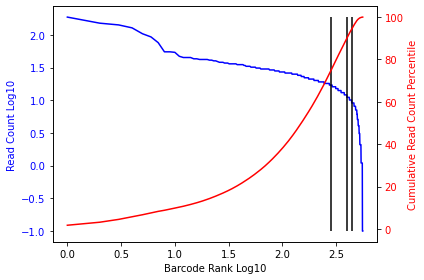

The read count cut off at the 75 th percentile is 17
The read count cut off at the 90 th percentile is 12
The read count cut off at the 95 th percentile is 9
BB_test_Cos1053_JKLab0340_MM2B


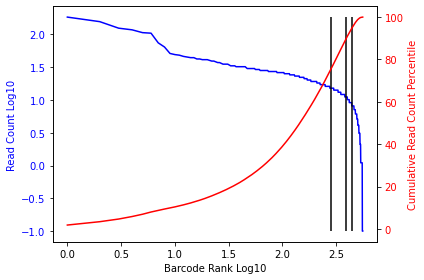

The read count cut off at the 75 th percentile is 15
The read count cut off at the 90 th percentile is 11
The read count cut off at the 95 th percentile is 8
BB_test_Cos1053_oligodT_MM1B


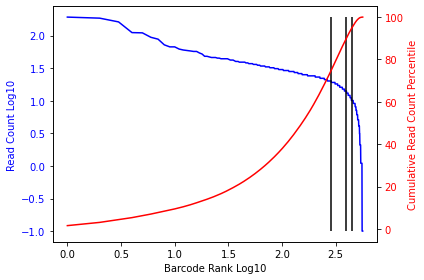

The read count cut off at the 75 th percentile is 19
The read count cut off at the 90 th percentile is 14
The read count cut off at the 95 th percentile is 10
BB_test_Cos1053_oligodT_MM2B


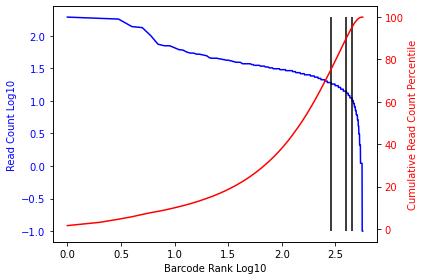

The read count cut off at the 75 th percentile is 19
The read count cut off at the 90 th percentile is 14
The read count cut off at the 95 th percentile is 11
BB_RT_1_340_243_Cos1053


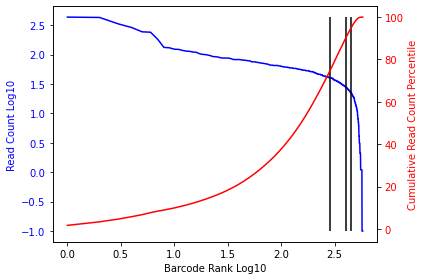

The read count cut off at the 75 th percentile is 40
The read count cut off at the 90 th percentile is 28
The read count cut off at the 95 th percentile is 22
BB_RT_1_340_243_Hek1053


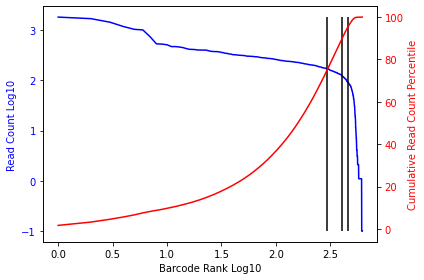

The read count cut off at the 75 th percentile is 168
The read count cut off at the 90 th percentile is 122
The read count cut off at the 95 th percentile is 91
BB_RT_1_340_335_Cos1053


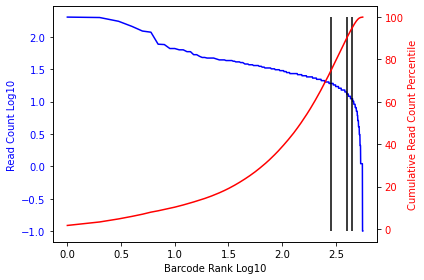

The read count cut off at the 75 th percentile is 19
The read count cut off at the 90 th percentile is 13
The read count cut off at the 95 th percentile is 11
BB_RT_1_340_335_Hek1053


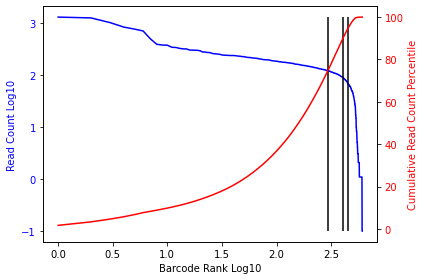

The read count cut off at the 75 th percentile is 122
The read count cut off at the 90 th percentile is 89
The read count cut off at the 95 th percentile is 68
BB_RT_1b_340_243_Hek1053


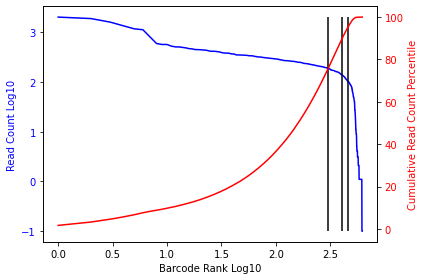

The read count cut off at the 75 th percentile is 191
The read count cut off at the 90 th percentile is 138
The read count cut off at the 95 th percentile is 104
BB_RT_1b_340_335_Hek1053


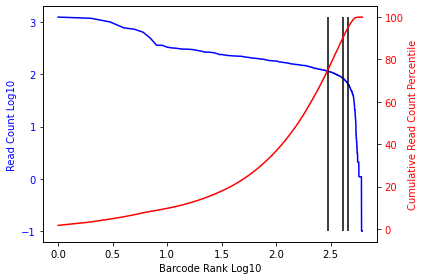

The read count cut off at the 75 th percentile is 115
The read count cut off at the 90 th percentile is 85
The read count cut off at the 95 th percentile is 66
BB_RT_1b_ODT_243_Hek1053


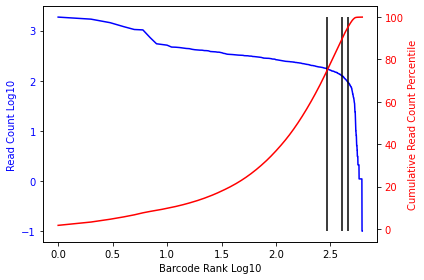

The read count cut off at the 75 th percentile is 173
The read count cut off at the 90 th percentile is 124
The read count cut off at the 95 th percentile is 94
BB_RT_1b_ODT_335_Hek1053


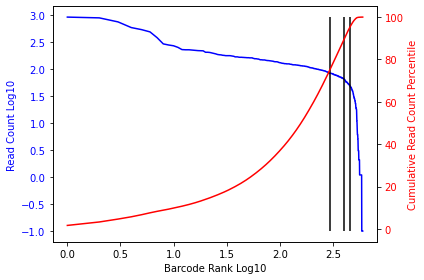

The read count cut off at the 75 th percentile is 85
The read count cut off at the 90 th percentile is 65
The read count cut off at the 95 th percentile is 51
BB_RT_1_ODT_243_Cos1053


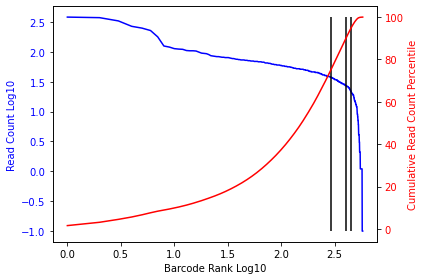

The read count cut off at the 75 th percentile is 37
The read count cut off at the 90 th percentile is 27
The read count cut off at the 95 th percentile is 21
BB_RT_1_ODT_243_Hek1053


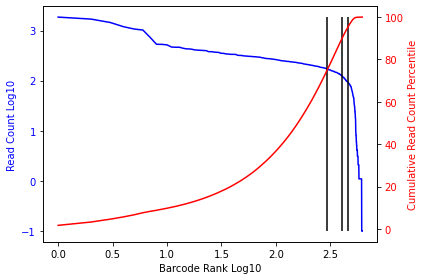

The read count cut off at the 75 th percentile is 170
The read count cut off at the 90 th percentile is 124
The read count cut off at the 95 th percentile is 94
BB_RT_1_ODT_335_Cos1053


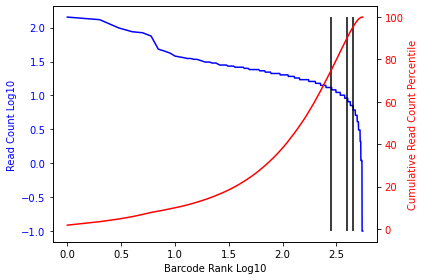

The read count cut off at the 75 th percentile is 13
The read count cut off at the 90 th percentile is 9
The read count cut off at the 95 th percentile is 7
BB_RT_1_ODT_335_Hek1053


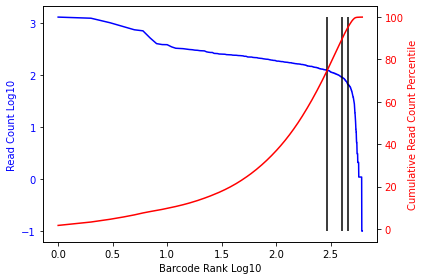

The read count cut off at the 75 th percentile is 125
The read count cut off at the 90 th percentile is 90
The read count cut off at the 95 th percentile is 67
BB_RT_2_340_243_Cos1054


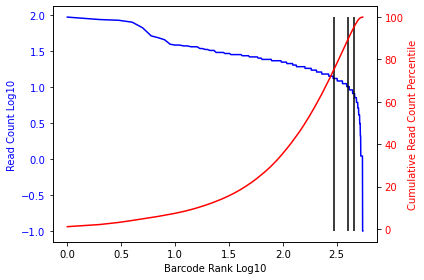

The read count cut off at the 75 th percentile is 13
The read count cut off at the 90 th percentile is 10
The read count cut off at the 95 th percentile is 8
BB_RT_2_340_243_Hek1054


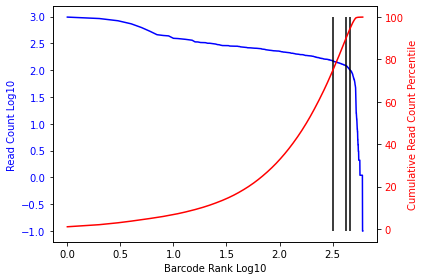

The read count cut off at the 75 th percentile is 148
The read count cut off at the 90 th percentile is 120
The read count cut off at the 95 th percentile is 98
BB_RT_2_340_335_Cos1054


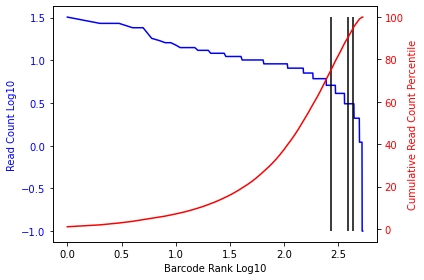

The read count cut off at the 75 th percentile is 5
The read count cut off at the 90 th percentile is 3
The read count cut off at the 95 th percentile is 3
BB_RT_2_340_335_Hek1054


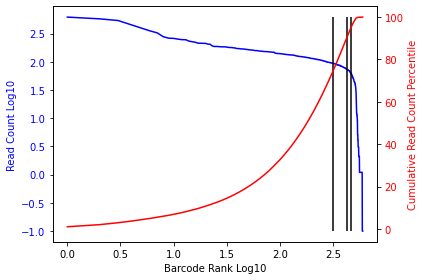

The read count cut off at the 75 th percentile is 94
The read count cut off at the 90 th percentile is 74
The read count cut off at the 95 th percentile is 63
BB_RT_2_ODT_243_Cos1054


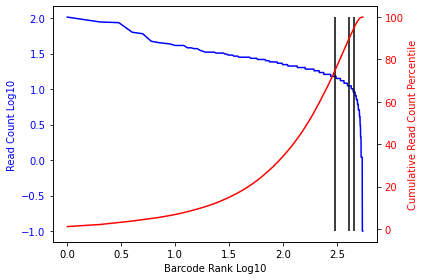

The read count cut off at the 75 th percentile is 15
The read count cut off at the 90 th percentile is 11
The read count cut off at the 95 th percentile is 9
BB_RT_2_ODT_243_Hek1054


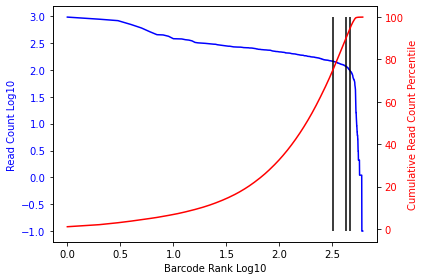

The read count cut off at the 75 th percentile is 145
The read count cut off at the 90 th percentile is 116
The read count cut off at the 95 th percentile is 95
BB_RT_2_ODT_335_Cos1054


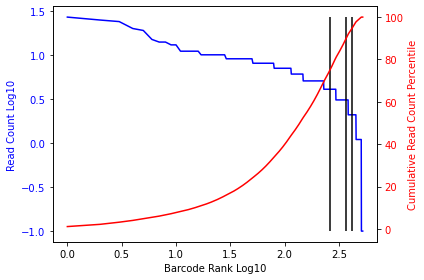

The read count cut off at the 75 th percentile is 4
The read count cut off at the 90 th percentile is 3
The read count cut off at the 95 th percentile is 2
BB_RT_2_ODT_335_Hek1054


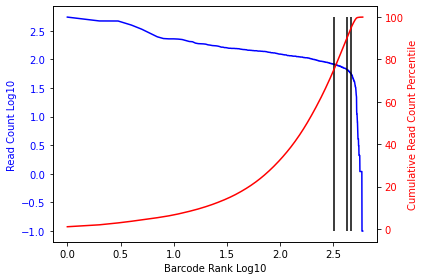

The read count cut off at the 75 th percentile is 83
The read count cut off at the 90 th percentile is 67
The read count cut off at the 95 th percentile is 57
BB_RT_3_340_243_Cos1055


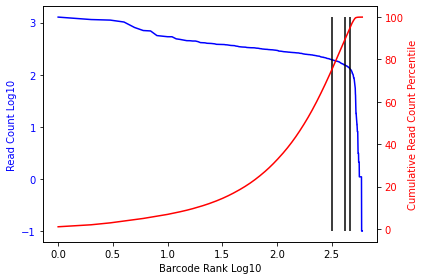

The read count cut off at the 75 th percentile is 194
The read count cut off at the 90 th percentile is 152
The read count cut off at the 95 th percentile is 130
BB_RT_3_340_243_Hek1055


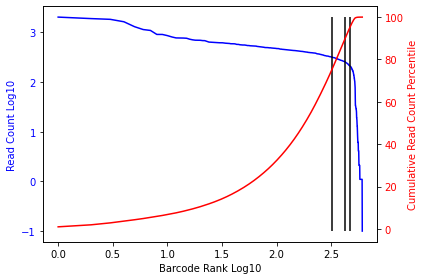

The read count cut off at the 75 th percentile is 317
The read count cut off at the 90 th percentile is 252
The read count cut off at the 95 th percentile is 210
BB_RT_3_340_335_Cos1055


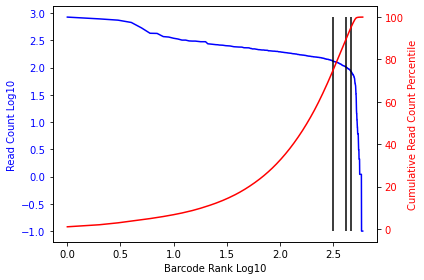

The read count cut off at the 75 th percentile is 130
The read count cut off at the 90 th percentile is 101
The read count cut off at the 95 th percentile is 85
BB_RT_3_340_335_Hek1055


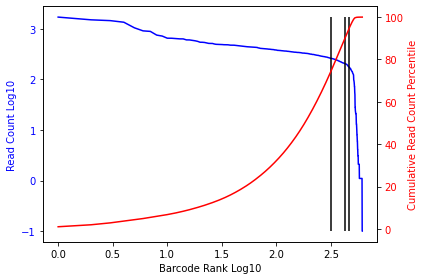

The read count cut off at the 75 th percentile is 260
The read count cut off at the 90 th percentile is 206
The read count cut off at the 95 th percentile is 173
BB_RT_3_ODT_243_Cos1055


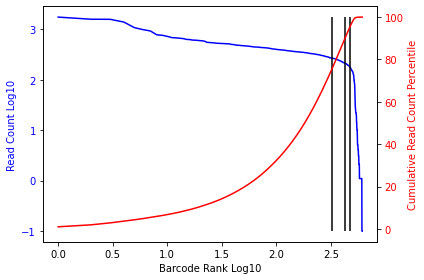

The read count cut off at the 75 th percentile is 268
The read count cut off at the 90 th percentile is 212
The read count cut off at the 95 th percentile is 183
BB_RT_3_ODT_243_Hek1055


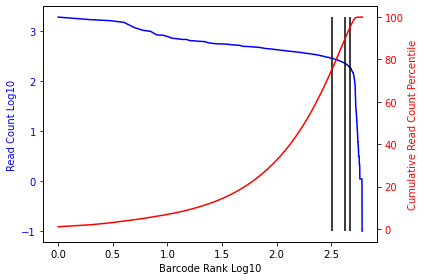

The read count cut off at the 75 th percentile is 283
The read count cut off at the 90 th percentile is 222
The read count cut off at the 95 th percentile is 185
BB_RT_3_ODT_335_cos1055


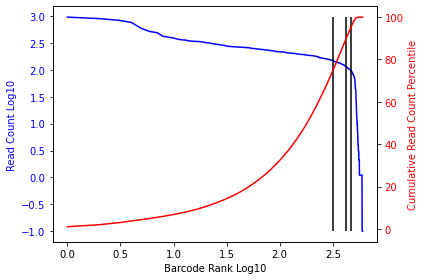

The read count cut off at the 75 th percentile is 149
The read count cut off at the 90 th percentile is 114
The read count cut off at the 95 th percentile is 98
BB_RT_3_ODT_335_Hek1055


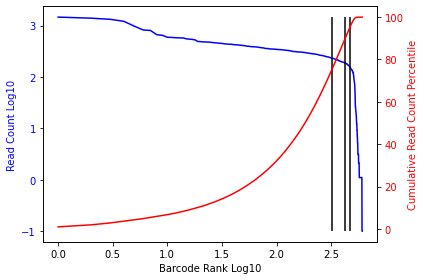

The read count cut off at the 75 th percentile is 230
The read count cut off at the 90 th percentile is 186
The read count cut off at the 95 th percentile is 156


In [18]:
bc_cutoffs_d = { 'sample': [],
                 '75_x': [],
                 '90_x': [],
                 '95_x': [],
                 '75_y': [],
                 '90_y': [],
                 '95_y': [], }

for samp in byvartbl_long[ 'sample' ].unique():
    
    print(samp)
    
    bc_cutoffs_d[ 'sample' ].append( samp )
    
    x_cuts,y_cuts = sp.waterfall_plot( byvartbl_long.loc[ byvartbl_long[ 'sample' ] == samp ],
                                       'n_bc_passfilt',
                                       [ 75, 90, 95 ] )
    
    for cut in x_cuts:

        bc_cutoffs_d[ str( cut ) + '_x' ].append( 10**( x_cuts[ cut ] ) )
        bc_cutoffs_d[ str( cut ) + '_y' ].append( y_cuts[ cut ] )

In [19]:
bc_cutoffs = pd.DataFrame( bc_cutoffs_d )

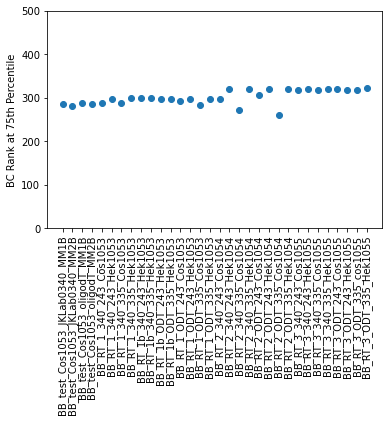

In [20]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '75_x' ] )

plt.xticks( rotation = 90 )

plt.ylabel( 'BC Rank at 75th Percentile' )

plt.ylim( 0, 500 )

plt.show()

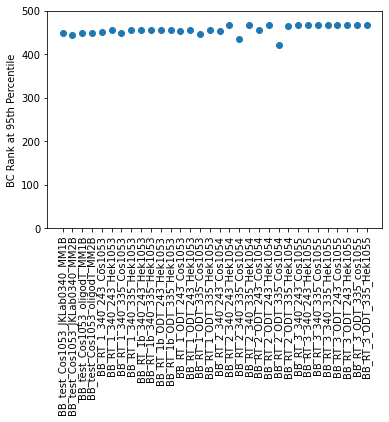

In [21]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '95_x' ] )

plt.xticks( rotation = 90 )

plt.ylabel( 'BC Rank at 95th Percentile' )

plt.ylim( 0, 500 )

plt.show()

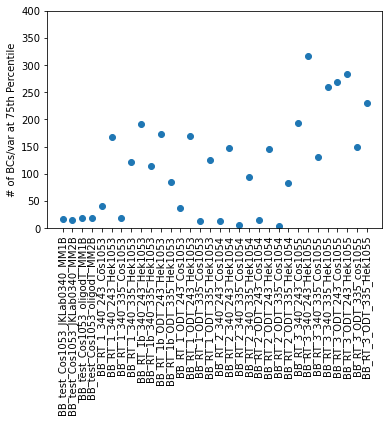

In [22]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '75_y' ] )

plt.xticks( rotation = 90 )

plt.ylabel( '# of BCs/var at 75th Percentile')

plt.ylim( ( 0, 400 ) )

plt.show()

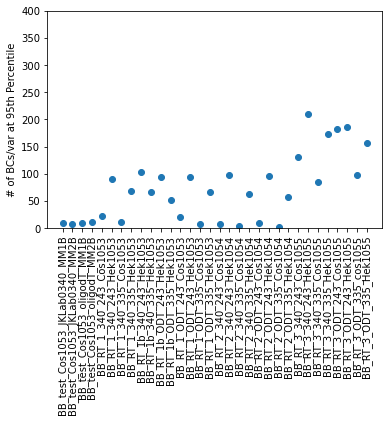

In [23]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '95_y' ] )

plt.xticks( rotation = 90 )

plt.ylabel( '# of BCs/var at 95th Percentile')

plt.ylim( ( 0, 400 ) )

plt.show()

In [24]:
byvartbl_sat = pp.saturate_variants( byvartbl_long,
                                     chr11_seq,
                                     'hg19_pos',
                                      'exon_num',
                                      rev_strand = True )[ 9 ]

In [25]:
#plots get messed up without the vector position included
byvartbl_sat[ 'pos' ] = byvartbl_sat.hg19_pos - 32412079 - 2*( byvartbl_sat.hg19_pos - byvartbl_sat.hg19_pos.min() )

In [26]:
byvartbl_sat[ 'hgvs_pos' ] = cds.pos_to_hgvspos( byvartbl_sat.pos,
                                                 ( 1058, 1554 ),
                                                [ (1267, 1359) ],
                                                [ ( 1355, 1447 ), ]
                                                )

In [27]:
github_colors = '3182bd6baed69ecae1c6dbefe6550dfd8d3cfdae6bfdd0a231a35474c476a1d99bc7e9c0756bb19e9ac8bcbddcdadaeb636363969696bdbdbdd9d9d9'

In [28]:
light_colors = [ '#' + github_colors[i:i+6] for i in range( 0, len( github_colors ), 6 ) ]

BB_test_Cos1053_JKLab0340_MM1B


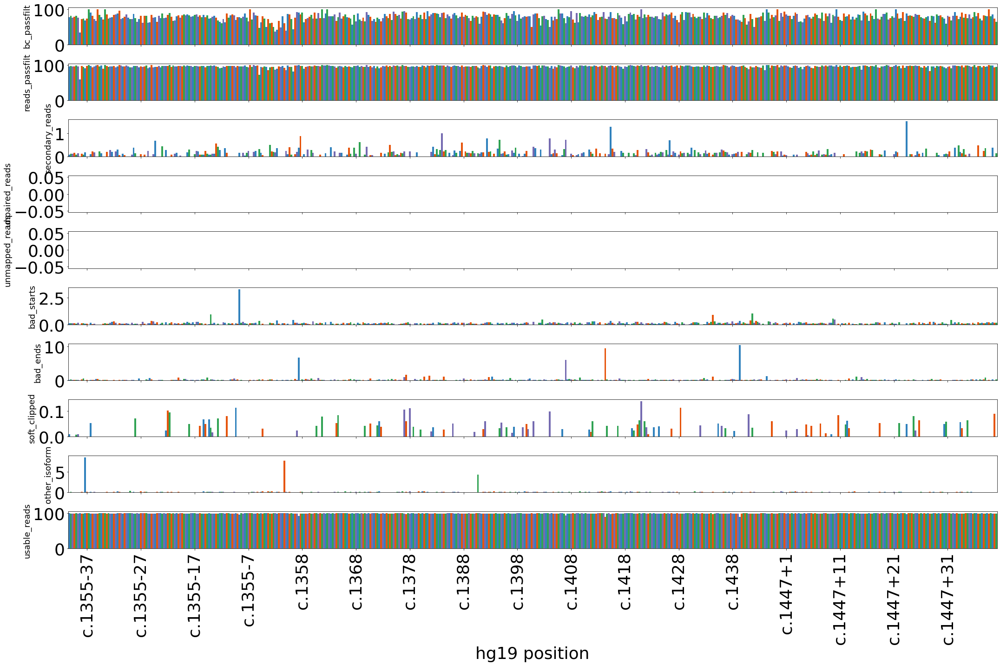

BB_test_Cos1053_JKLab0340_MM2B


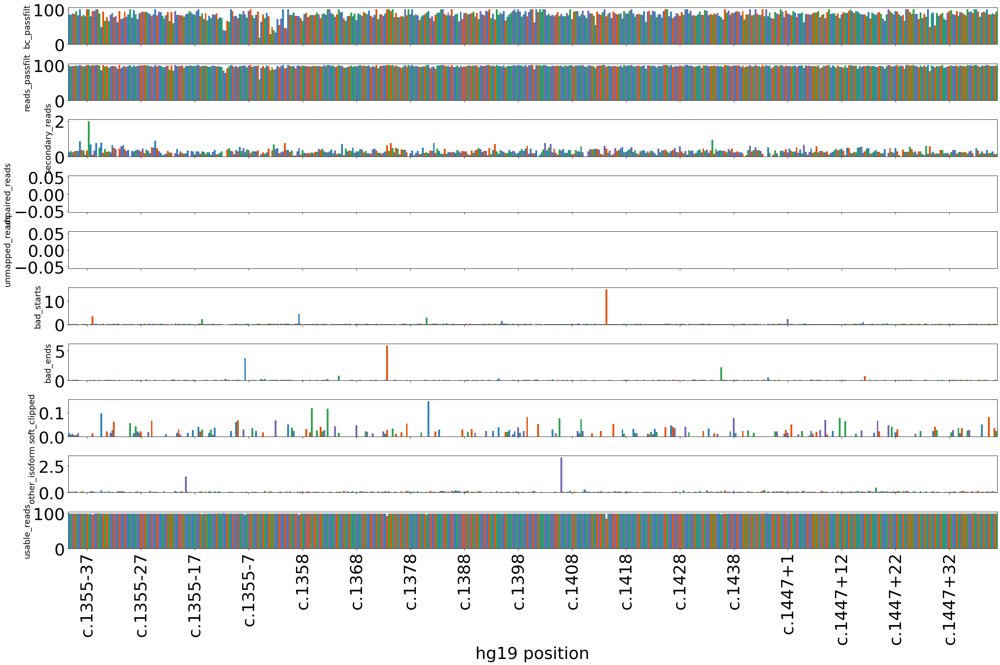

BB_test_Cos1053_oligodT_MM1B


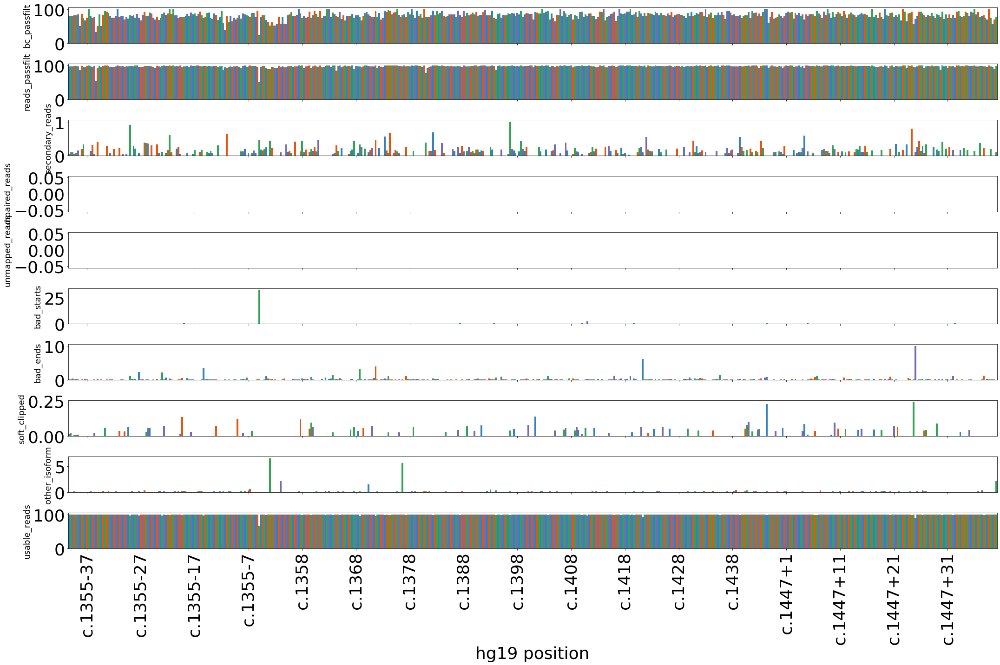

BB_test_Cos1053_oligodT_MM2B


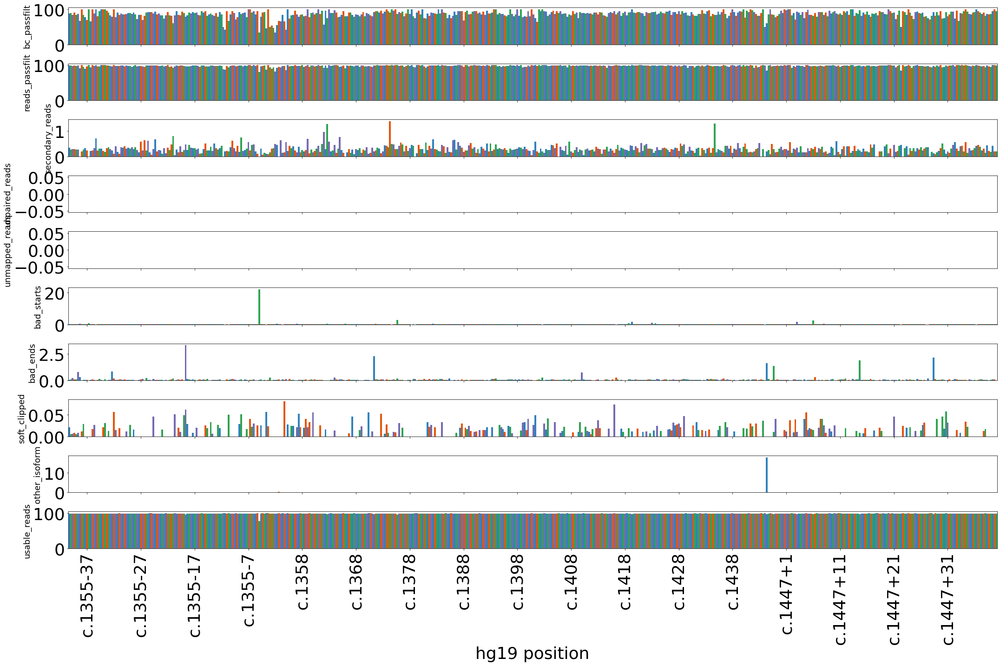

BB_RT_1_340_243_Cos1053


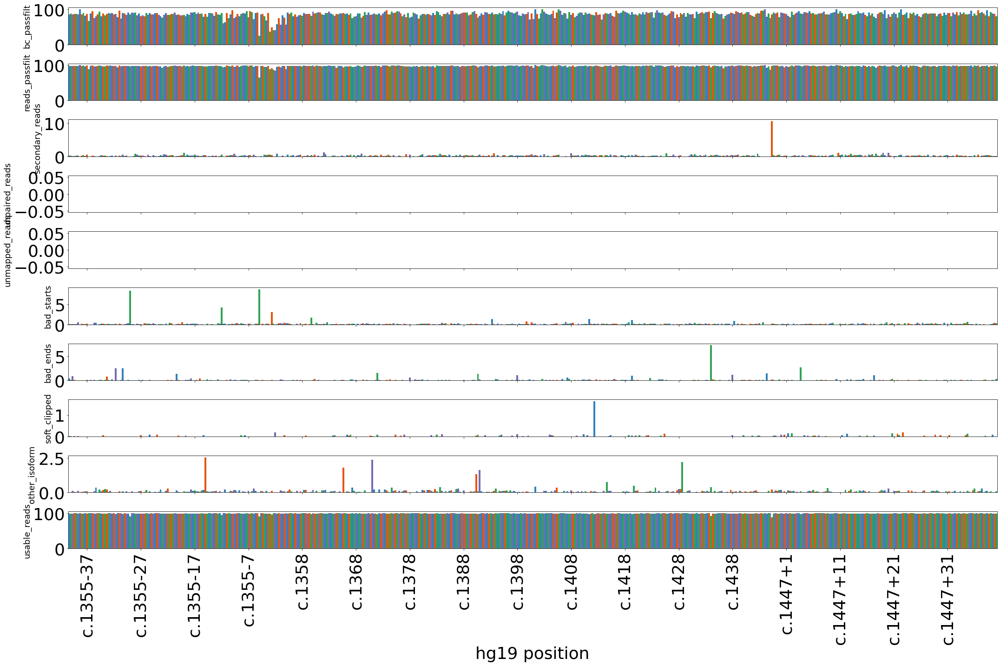

BB_RT_1_340_243_Hek1053


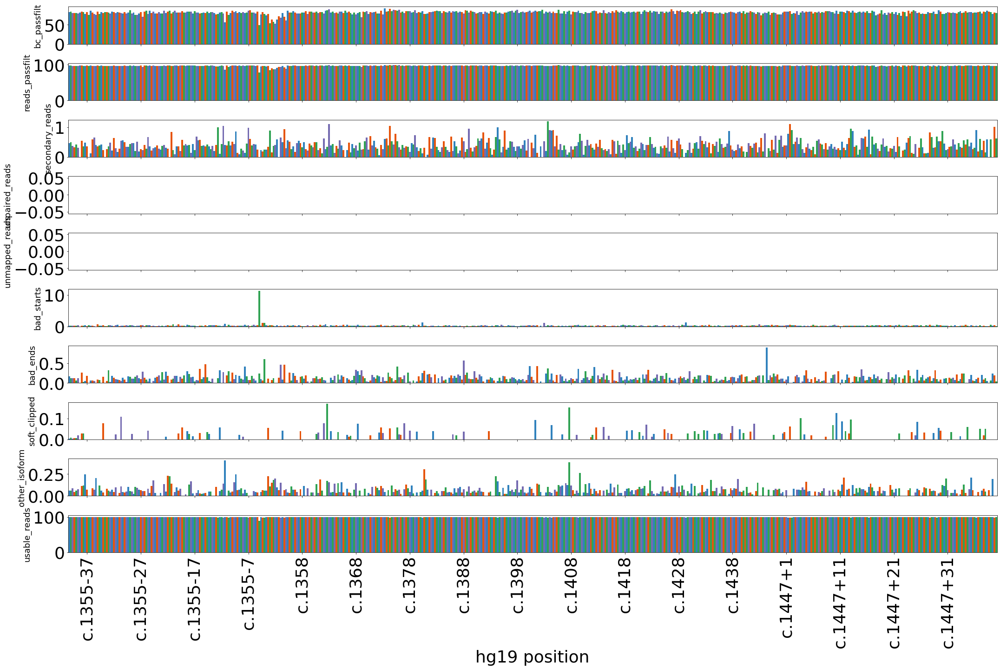

BB_RT_1_340_335_Cos1053


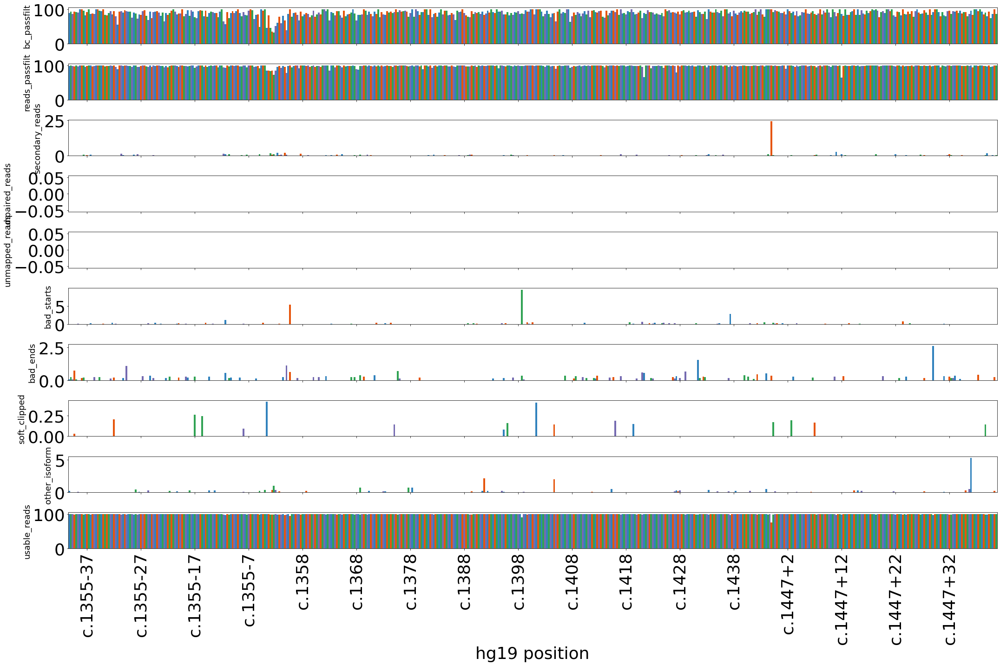

BB_RT_1_340_335_Hek1053


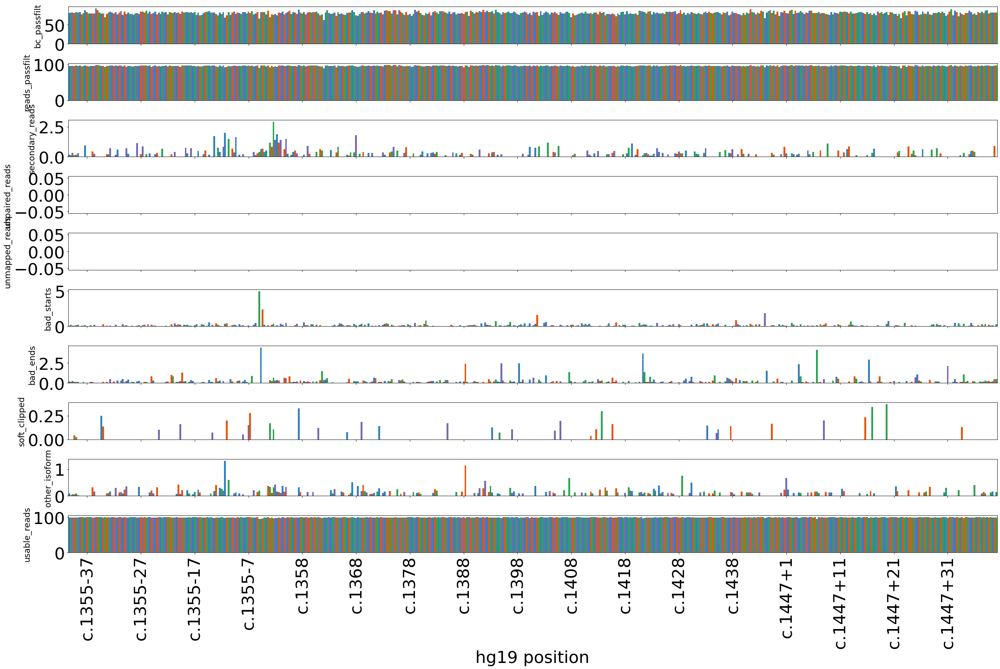

BB_RT_1b_340_243_Hek1053


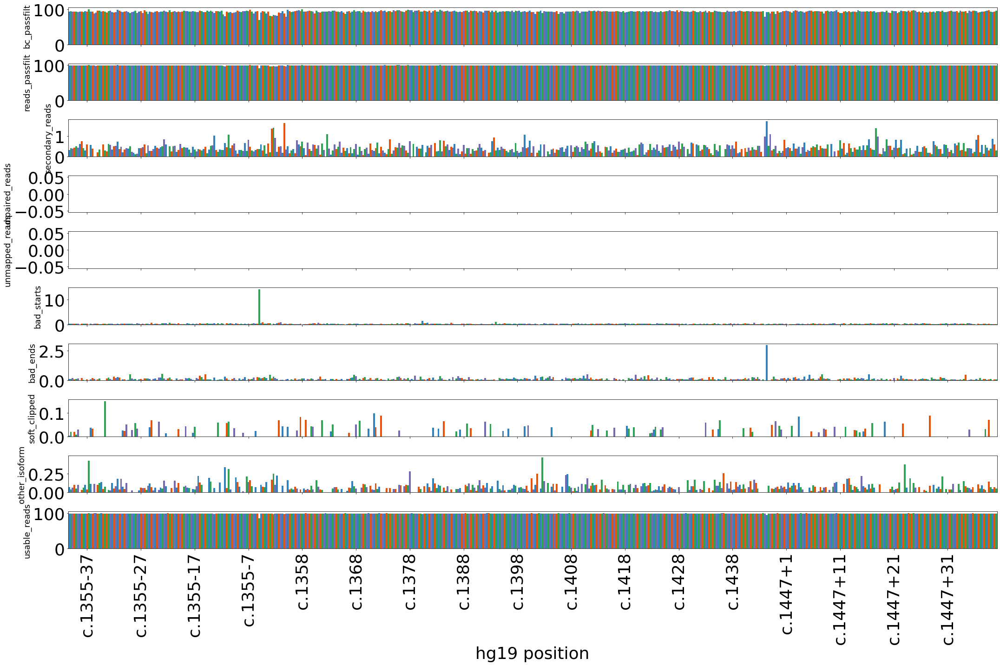

BB_RT_1b_340_335_Hek1053


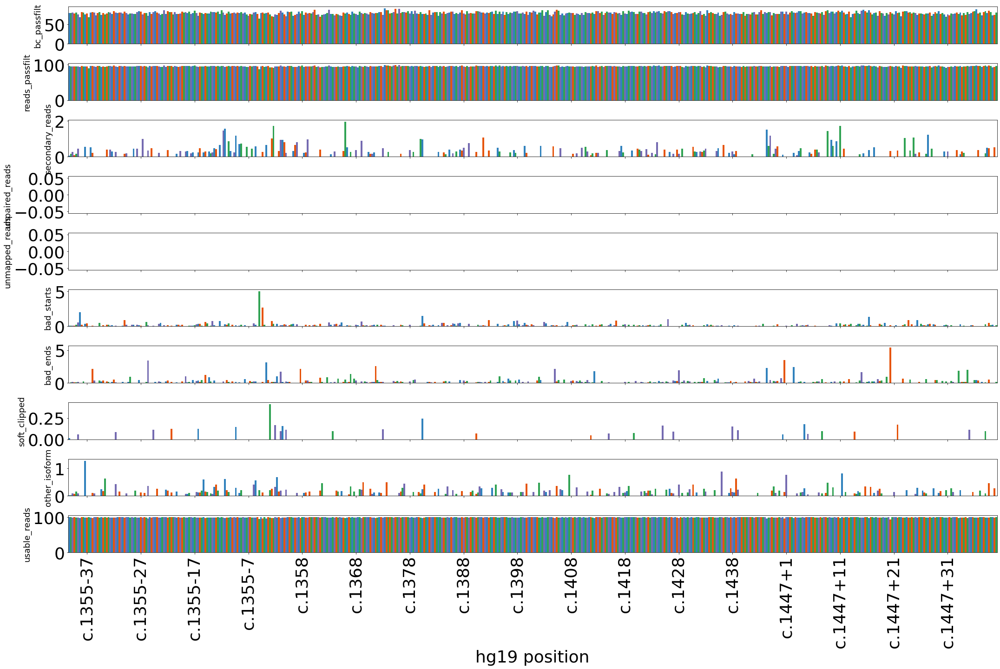

BB_RT_1b_ODT_243_Hek1053


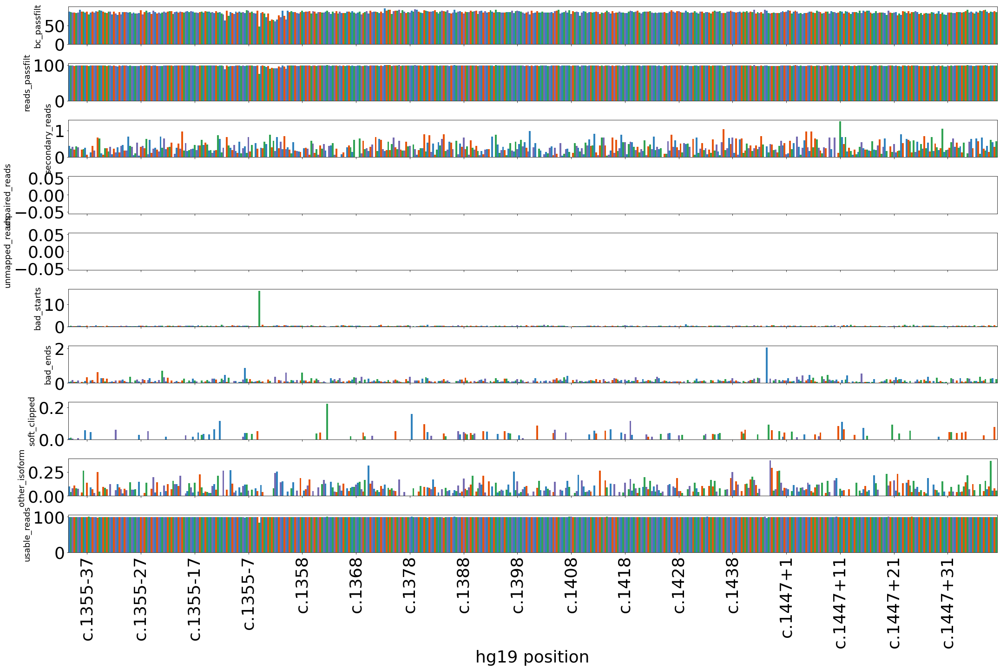

BB_RT_1b_ODT_335_Hek1053


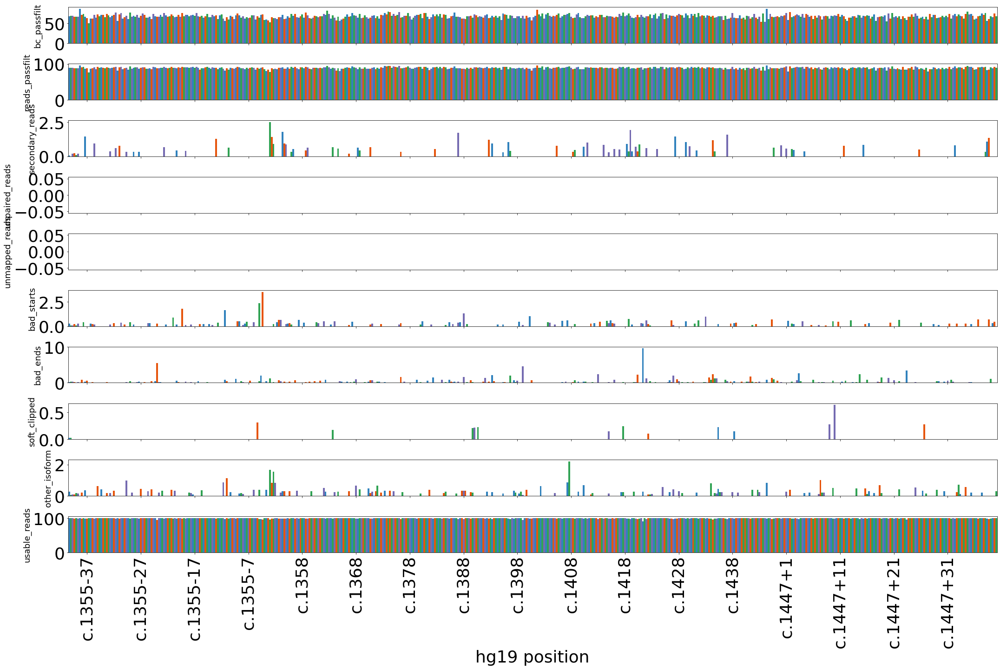

BB_RT_1_ODT_243_Cos1053


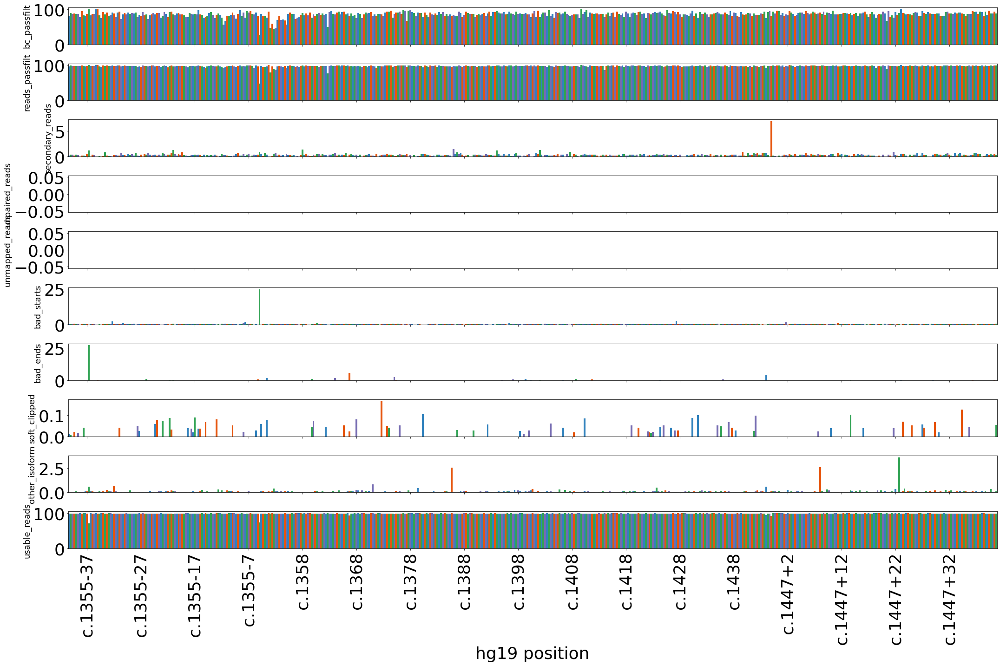

BB_RT_1_ODT_243_Hek1053


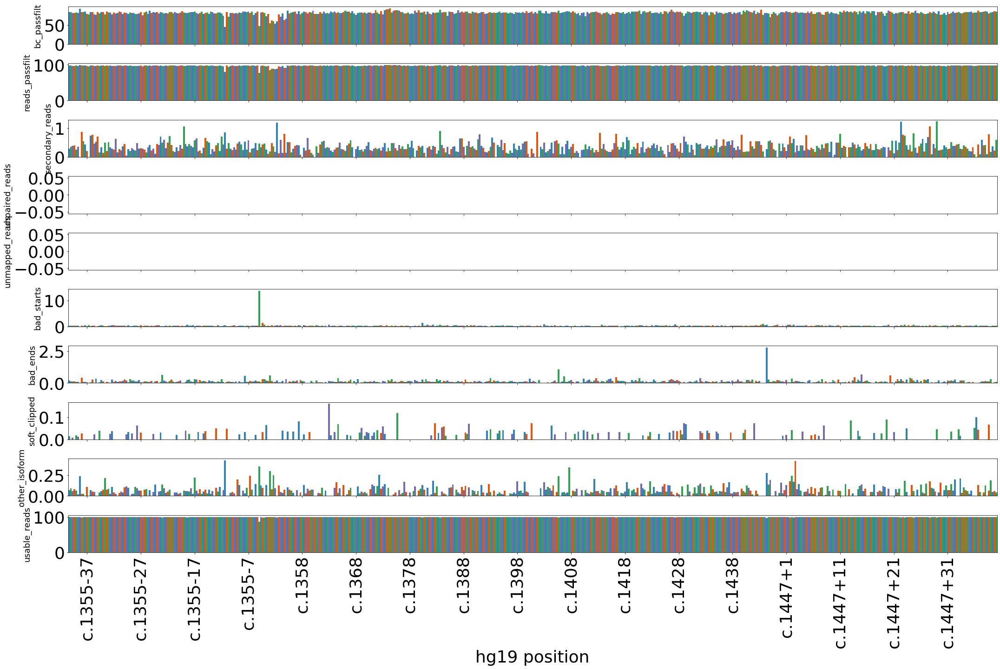

BB_RT_1_ODT_335_Cos1053


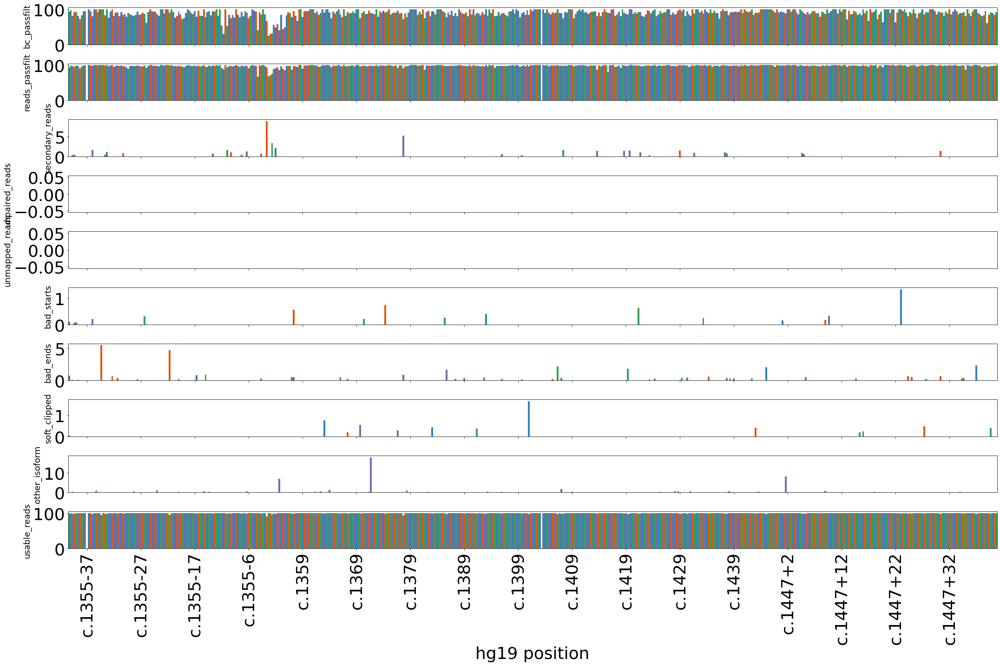

BB_RT_1_ODT_335_Hek1053


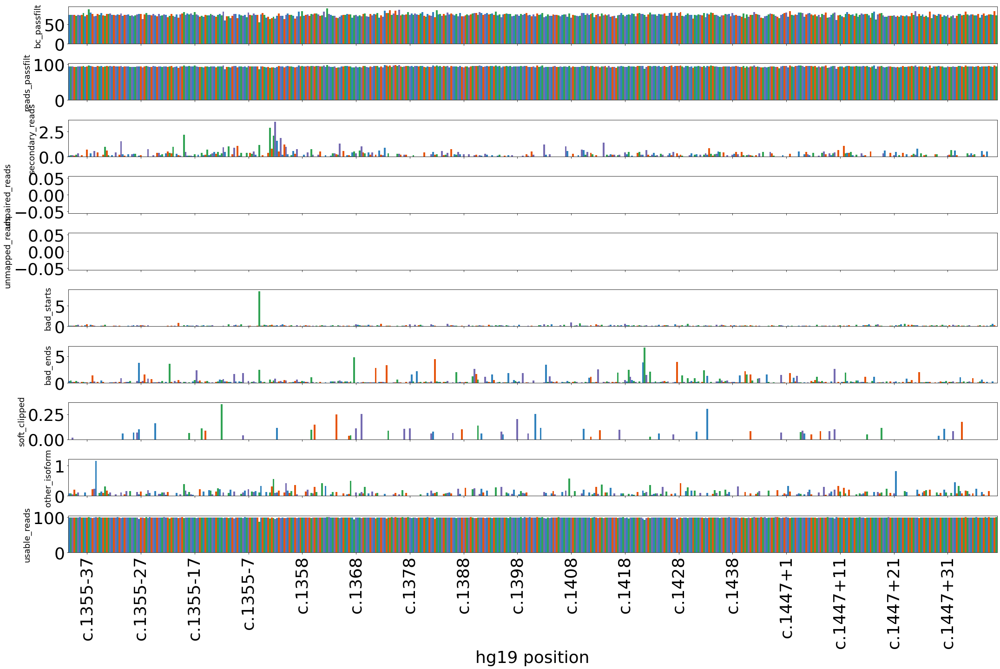

BB_RT_2_340_243_Cos1054


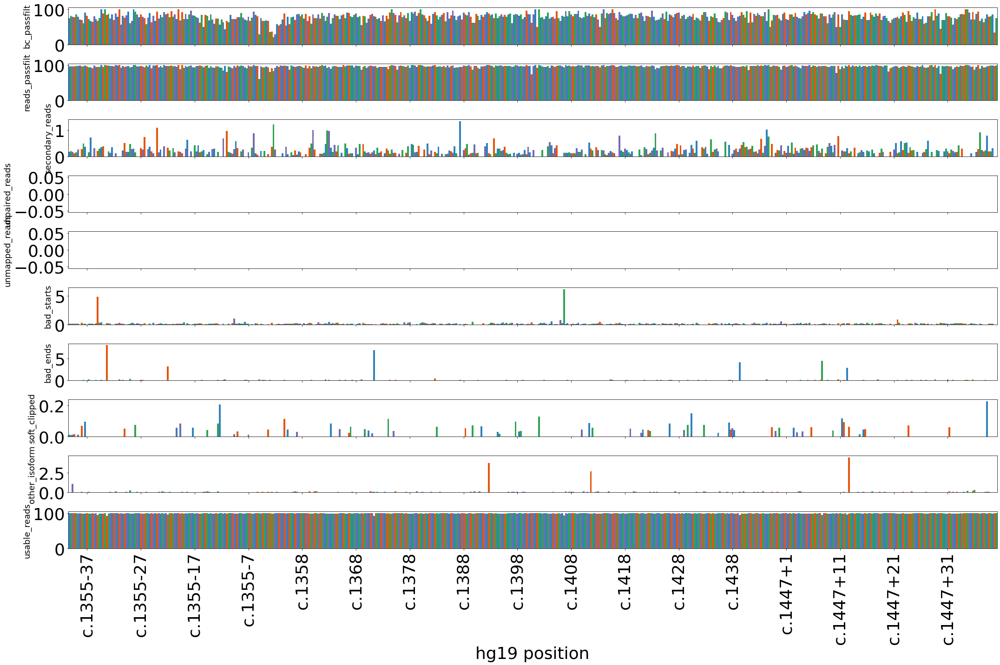

BB_RT_2_340_243_Hek1054


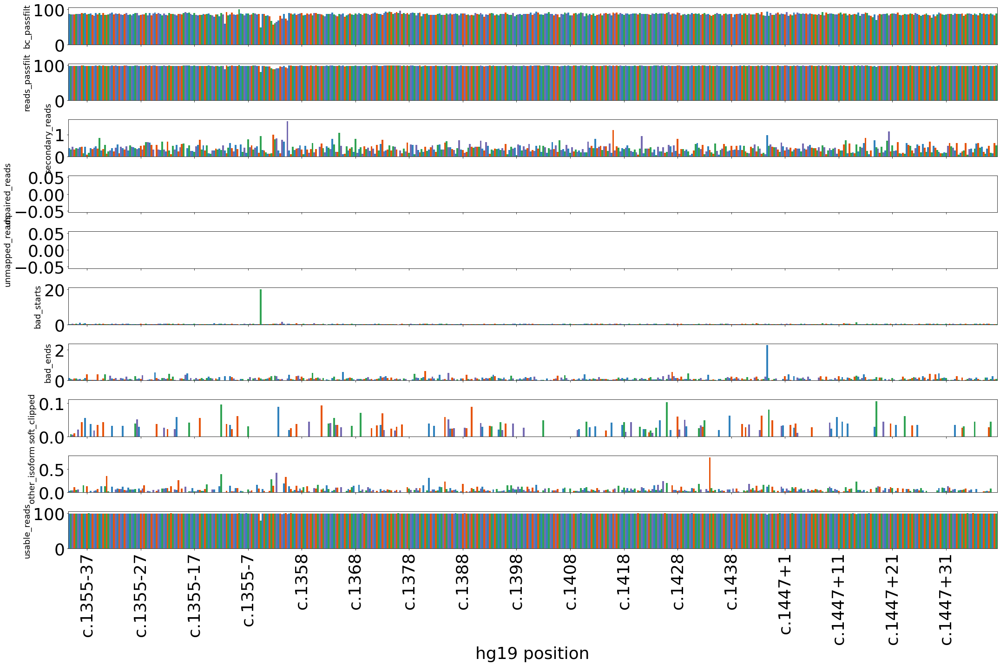

BB_RT_2_340_335_Cos1054


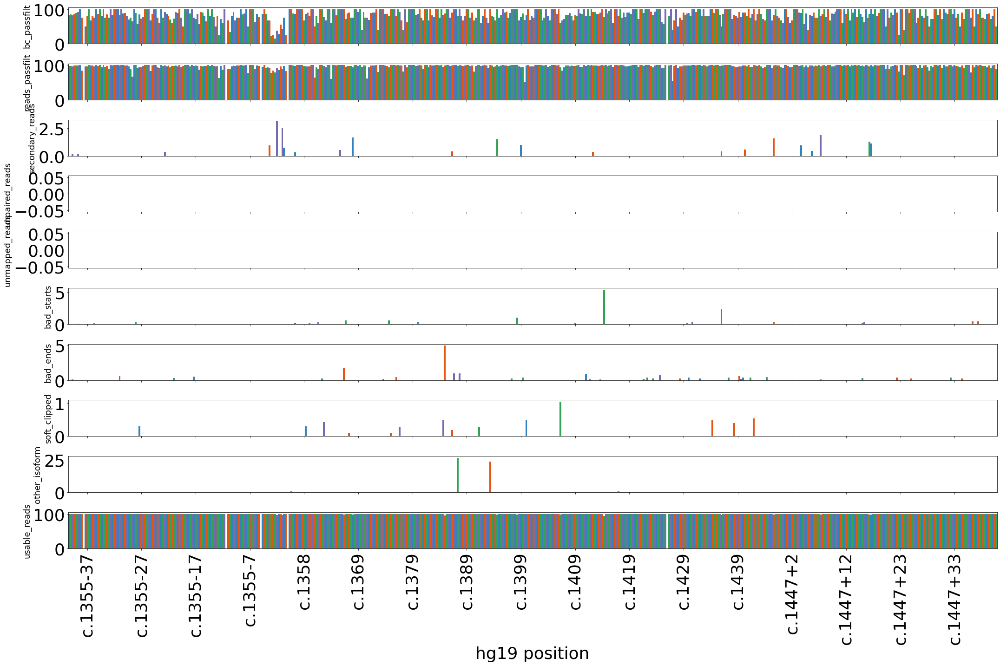

BB_RT_2_340_335_Hek1054


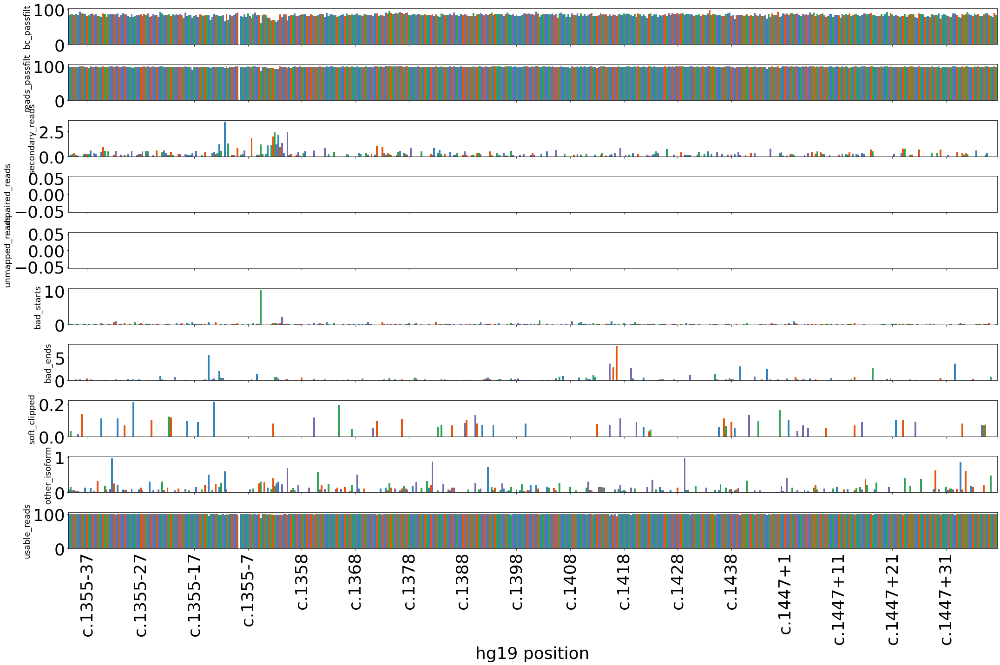

BB_RT_2_ODT_243_Cos1054


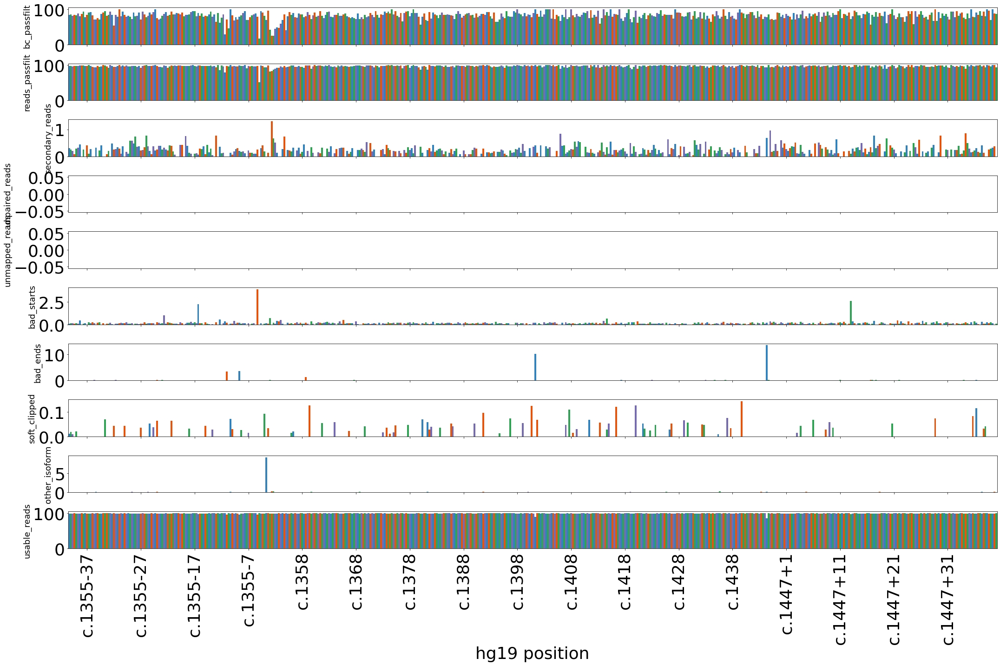

BB_RT_2_ODT_243_Hek1054


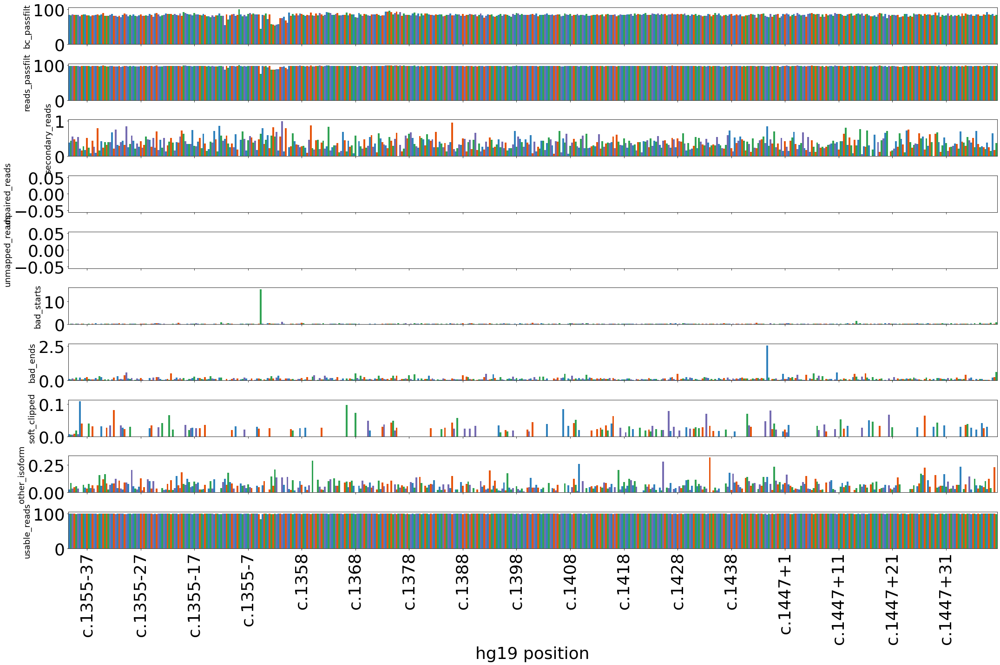

BB_RT_2_ODT_335_Hek1054


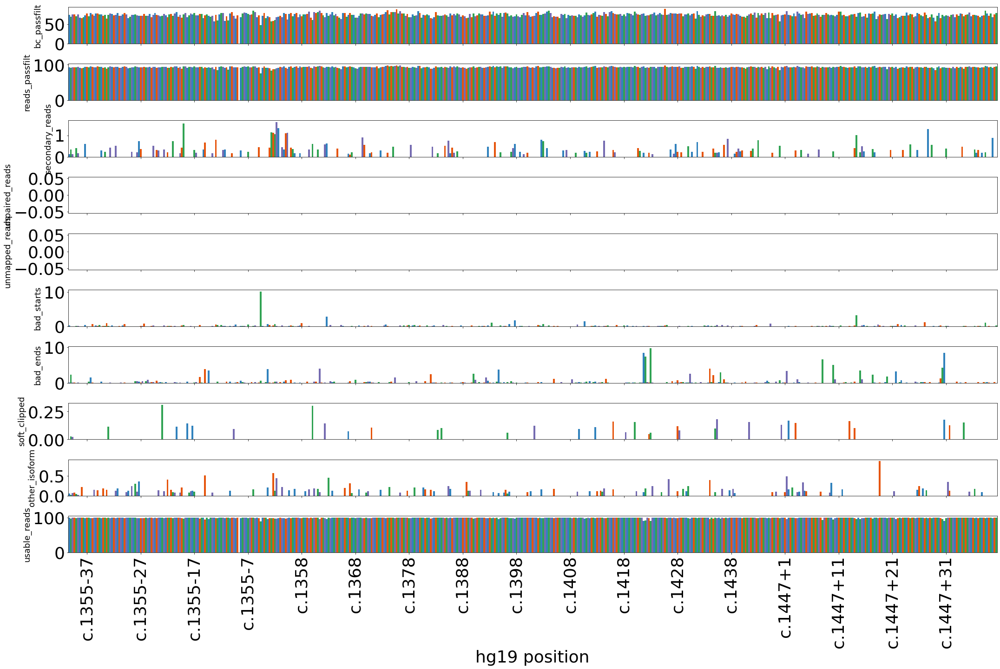

BB_RT_3_340_243_Cos1055


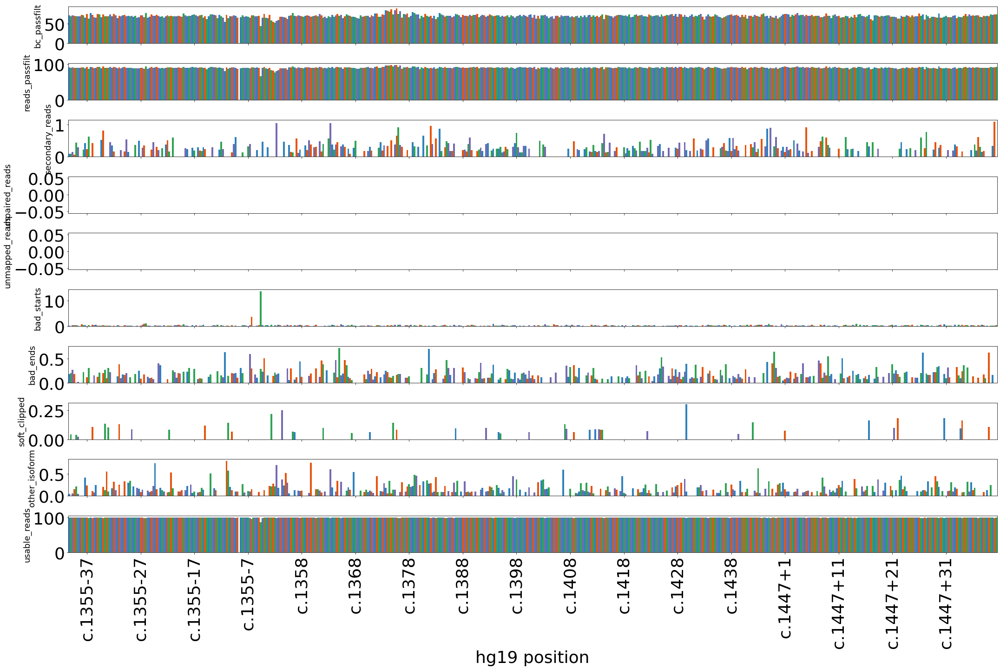

BB_RT_3_340_243_Hek1055


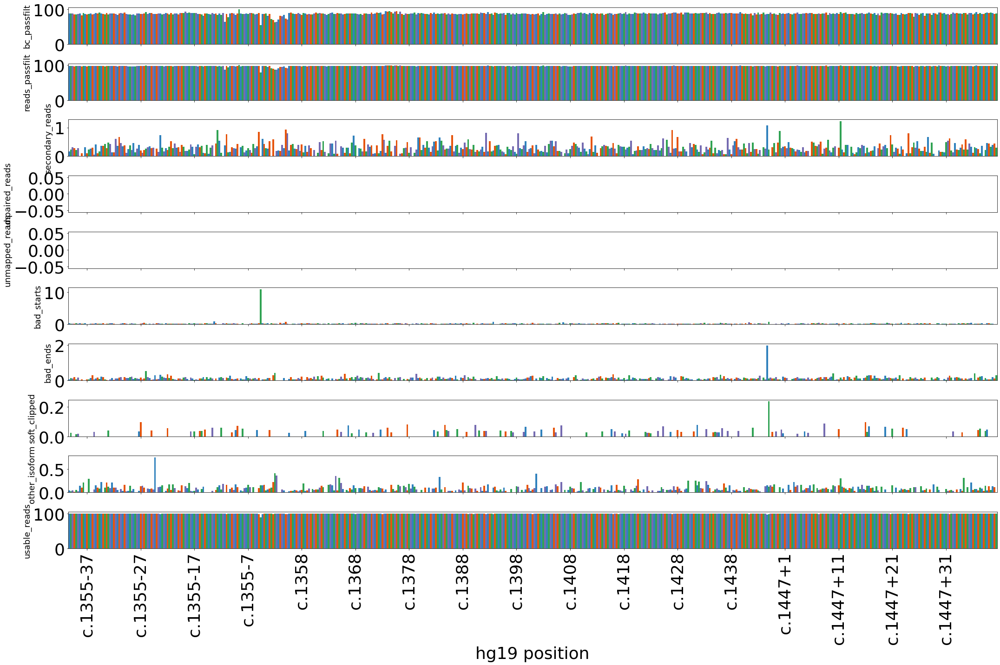

BB_RT_3_340_335_Cos1055


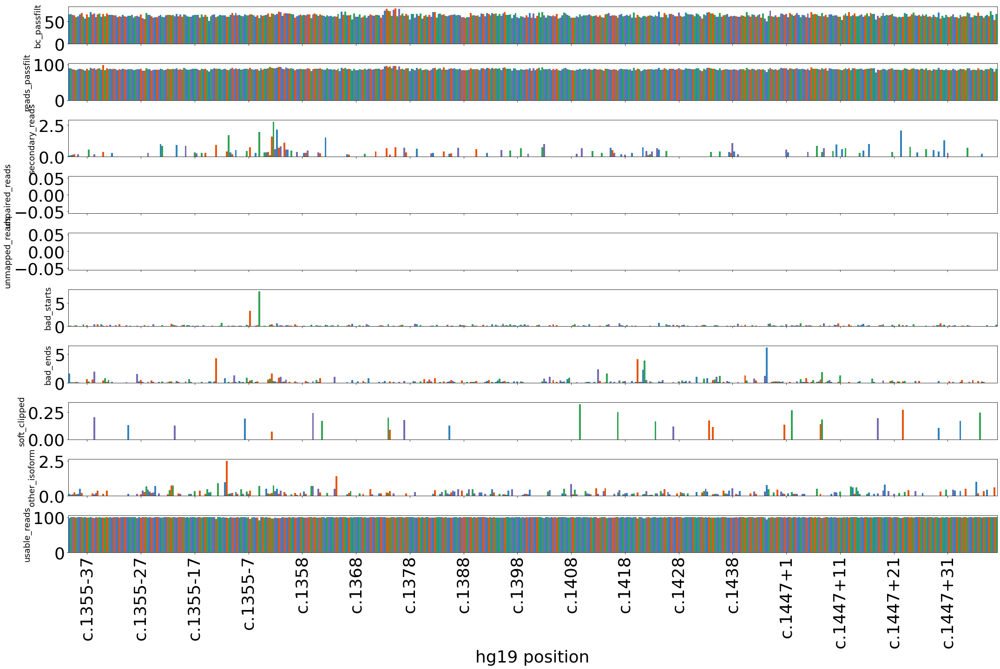

BB_RT_3_340_335_Hek1055


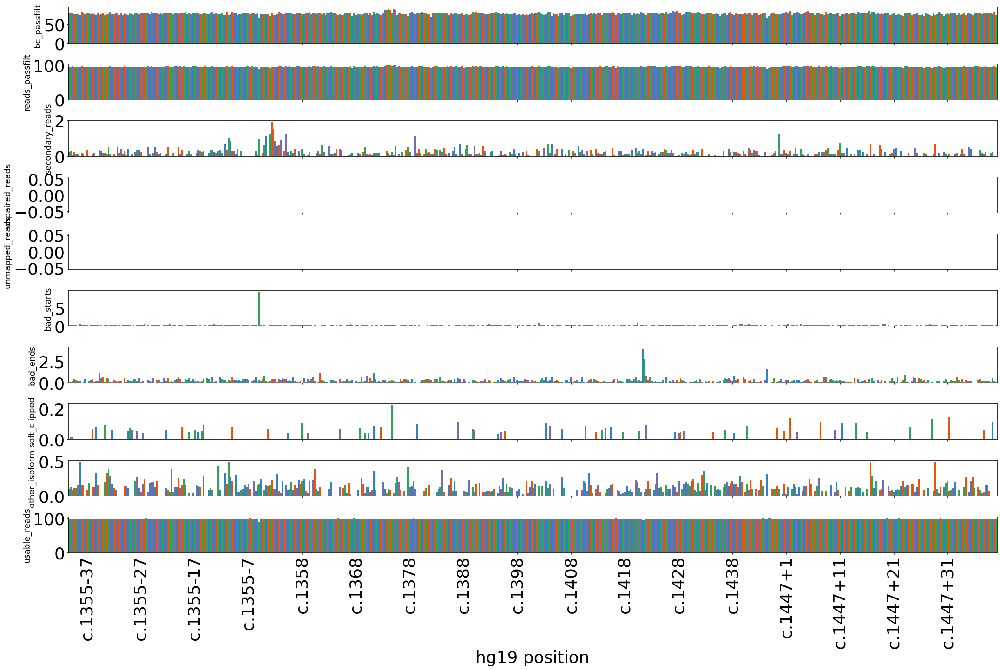

BB_RT_3_ODT_243_Cos1055


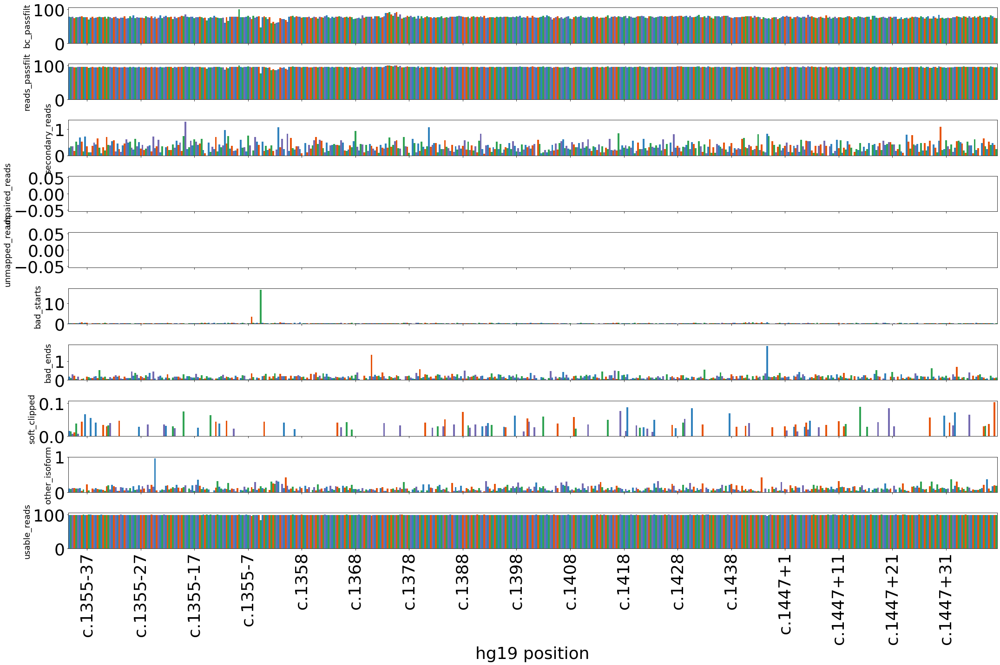

BB_RT_3_ODT_243_Hek1055


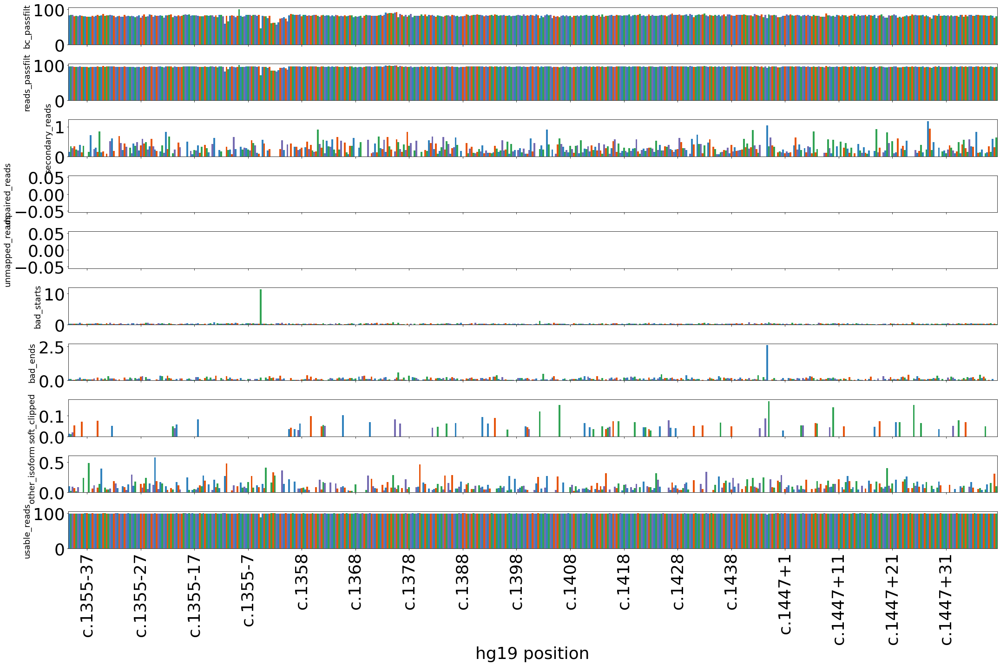

BB_RT_3_ODT_335_cos1055


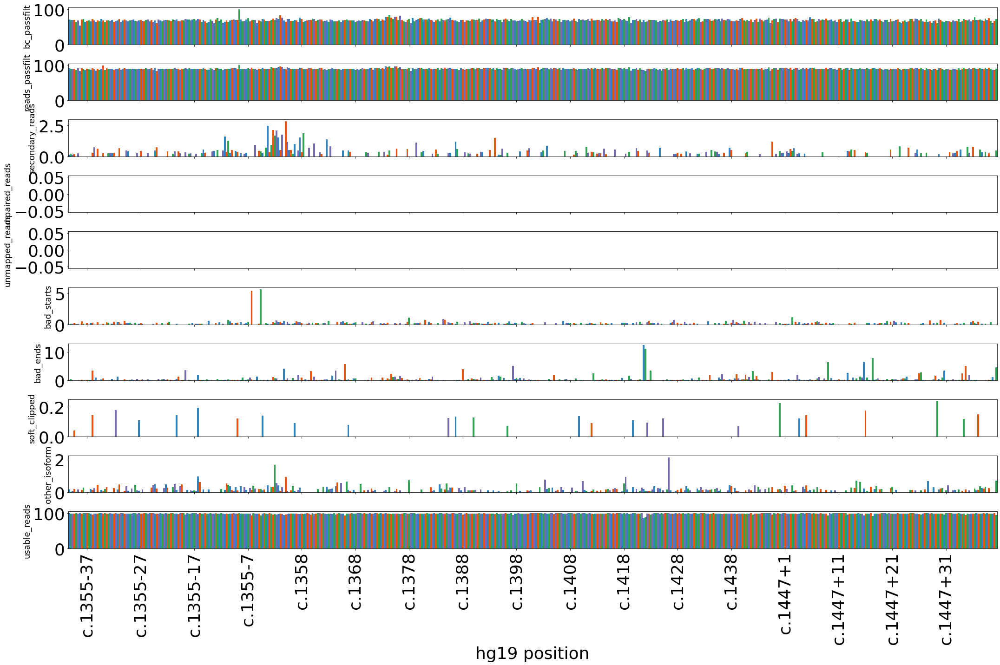

BB_RT_3_ODT_335_Hek1055


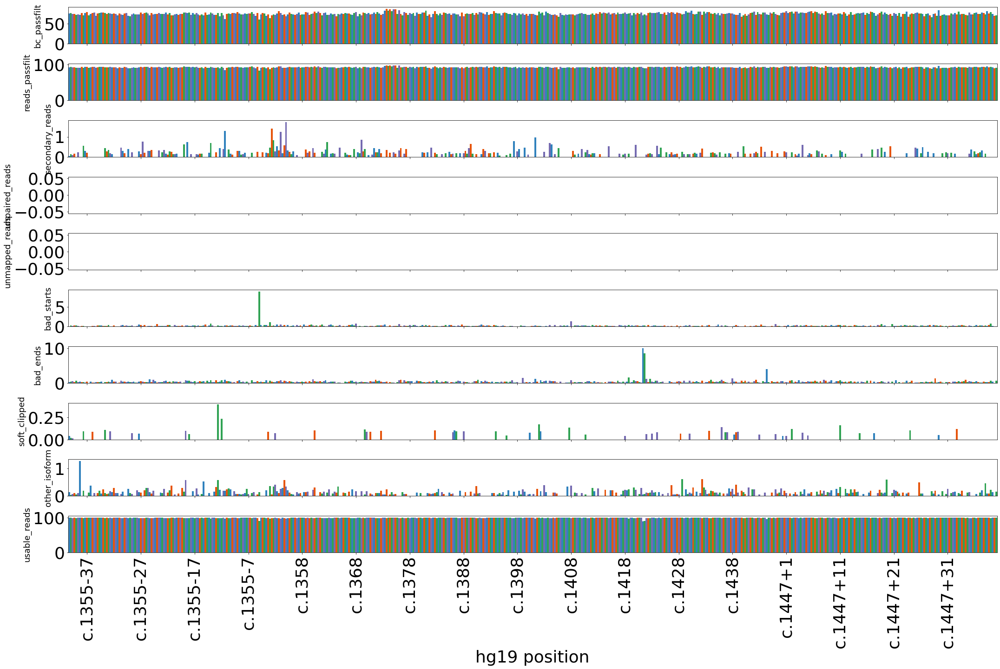

BB_RT_2_ODT_335_Cos1054


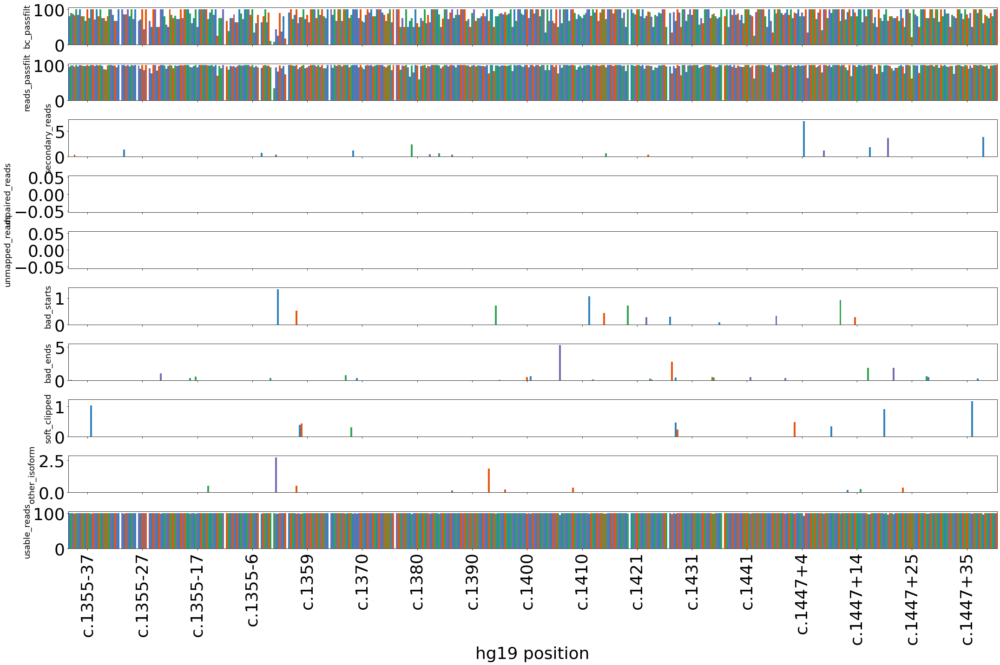

nan


/home/smithcat/splfxseq/splanl/plots.py:2882: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  ax.set_xlim( ( -.5, len( tbv ) - .5 ) )


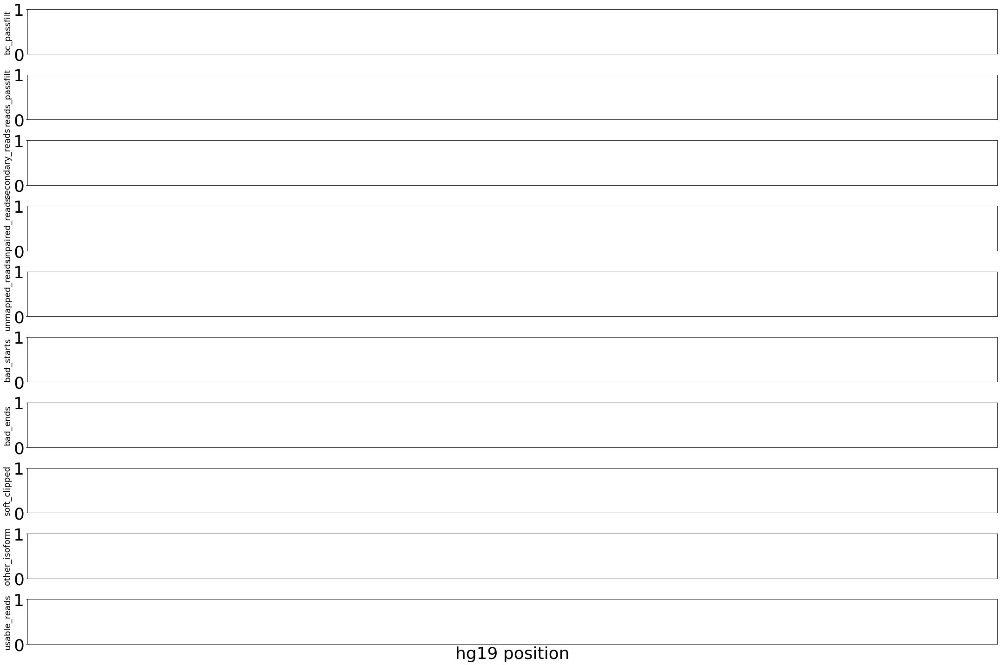

In [29]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.sat_subplots_wrapper( byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                           'ref': 'r',
                                                                                                                                            'alt_c': 'alt',
                                                                                                                                          'ref_c': 'ref' } ),
                         [ col for col in byvartbl_sat if col.startswith( 'per_' ) ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          share_y = False,
                          legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          #y_ax_lim = [ ( 0, 3 ) ] + ylim,
                          y_ax_title = [ col[ 4: ] for col in byvartbl_sat if col.startswith( 'per_' ) ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [30]:
qc_counts_d = {}

for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
        
    qc_counts_d[ col ] = Counter( byvartbl_long.loc[ byvartbl_long[ col ] >= 5 ].pos.tolist() )

In [31]:
for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
    
    print( col )
    
    print( qc_counts_d[ col ].most_common( 10 ) )

per_secondary_reads
[(1221, 4), (1358, 3), (1189, 3), (1202, 3), (1222, 2), (1170, 2), (1215, 1), (1210, 1), (1105, 1), (1194, 1)]
per_unpaired_reads
[]
per_unmapped_reads
[]
per_bad_starts
[(1262, 22), (1205, 3), (1202, 2), (1327, 1), (1238, 1), (1112, 1), (1200, 1), (1268, 1), (1311, 1), (1217, 1)]
per_bad_ends
[(1334, 9), (1214, 2), (1224, 2), (1357, 2), (1270, 1), (1319, 1), (1327, 1), (1352, 1), (1286, 1), (1384, 1)]
per_soft_clipped
[(1206, 1)]
per_other_isoform
[(1264, 2), (1167, 2), (1149, 2), (1230, 1), (1267, 1), (1289, 1), (1357, 1), (1395, 1), (1121, 1), (1185, 1)]


In [32]:
for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
    
    print( col )
    
    print( byvartbl_long.groupby( 'sample' )[ col ].max() )

per_secondary_reads
sample
BB_RT_1_340_243_Cos1053           10.549451
BB_RT_1_340_243_Hek1053           11.764706
BB_RT_1_340_335_Cos1053           24.324324
BB_RT_1_340_335_Hek1053            4.000000
BB_RT_1_ODT_243_Cos1053            6.896552
BB_RT_1_ODT_243_Hek1053           28.571429
BB_RT_1_ODT_335_Cos1053            8.823529
BB_RT_1_ODT_335_Hek1053            7.407407
BB_RT_1b_340_243_Hek1053           6.250000
BB_RT_1b_340_335_Hek1053          66.666667
BB_RT_1b_ODT_243_Hek1053          10.000000
BB_RT_1b_ODT_335_Hek1053           6.250000
BB_RT_2_340_243_Cos1054            1.346801
BB_RT_2_340_243_Hek1054           10.000000
BB_RT_2_340_335_Cos1054            3.100775
BB_RT_2_340_335_Hek1054           11.428571
BB_RT_2_ODT_243_Cos1054            1.305483
BB_RT_2_ODT_243_Hek1054            5.263158
BB_RT_2_ODT_335_Cos1054            6.976744
BB_RT_2_ODT_335_Hek1054            2.531646
BB_RT_3_340_243_Cos1055            5.000000
BB_RT_3_340_243_Hek1055           20.000000
BB_RT

In [33]:
for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
    
    print( col )
    
    print( byvartbl_long.loc[ byvartbl_long.pos >= 1227 ].groupby( 'sample' )[ col ].max() )

per_secondary_reads
sample
BB_RT_1_340_243_Cos1053           10.549451
BB_RT_1_340_243_Hek1053            1.196670
BB_RT_1_340_335_Cos1053           24.324324
BB_RT_1_340_335_Hek1053            2.925244
BB_RT_1_ODT_243_Cos1053            6.896552
BB_RT_1_ODT_243_Hek1053            1.240585
BB_RT_1_ODT_335_Cos1053            8.823529
BB_RT_1_ODT_335_Hek1053            3.491756
BB_RT_1b_340_243_Hek1053           1.739130
BB_RT_1b_340_335_Hek1053           1.970443
BB_RT_1b_ODT_243_Hek1053           1.355422
BB_RT_1b_ODT_335_Hek1053           2.510460
BB_RT_2_340_243_Cos1054            1.346801
BB_RT_2_340_243_Hek1054            1.615074
BB_RT_2_340_335_Cos1054            3.100775
BB_RT_2_340_335_Hek1054            3.437967
BB_RT_2_ODT_243_Cos1054            1.305483
BB_RT_2_ODT_243_Hek1054            0.990099
BB_RT_2_ODT_335_Cos1054            6.976744
BB_RT_2_ODT_335_Hek1054            1.630435
BB_RT_3_340_243_Cos1055            1.098901
BB_RT_3_340_243_Hek1055            1.217656
BB_RT

In [34]:
byvartbl_long.loc[ byvartbl_long.pos == 1358 ].groupby( 'sample' ).per_secondary_reads.max()

sample
BB_RT_1_340_243_Cos1053           10.549451
BB_RT_1_340_243_Hek1053            0.722423
BB_RT_1_340_335_Cos1053           24.324324
BB_RT_1_340_335_Hek1053            0.327869
BB_RT_1_ODT_243_Cos1053            6.896552
BB_RT_1_ODT_243_Hek1053            0.503356
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            0.328228
BB_RT_1b_340_243_Hek1053           0.514801
BB_RT_1b_340_335_Hek1053           0.454030
BB_RT_1b_ODT_243_Hek1053           0.470588
BB_RT_1b_ODT_335_Hek1053           0.627943
BB_RT_2_340_243_Cos1054            0.471698
BB_RT_2_340_243_Hek1054            0.432173
BB_RT_2_340_335_Cos1054            1.568627
BB_RT_2_340_335_Hek1054            0.000000
BB_RT_2_ODT_243_Cos1054            0.468384
BB_RT_2_ODT_243_Hek1054            0.703125
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.183486
BB_RT_3_340_243_Cos1055            0.612089
BB_RT_3_340_243_Hek1055            0.455063
BB_RT_3_340_335_Cos1055  

In [35]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1358 ) & ( byvartbl_long.per_secondary_reads >= 5 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_secondary_reads' ] ]

,pos,ref,alt,sample,per_secondary_reads
2700,1358,T,G,BB_RT_1_340_243_Cos1053,10.549451
3884,1358,T,G,BB_RT_1_340_335_Cos1053,24.324324
7535,1358,T,G,BB_RT_1_ODT_243_Cos1053,6.896552


In [36]:
byvartbl_long.loc[ ( byvartbl_long.per_secondary_reads >= 20 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_secondary_reads' ] ]

,pos,ref,alt,sample,per_secondary_reads
3884,1358,T,G,BB_RT_1_340_335_Cos1053,24.324324
5242,1105,A,G,BB_RT_1b_340_335_Hek1053,40.000000
5275,1194,G,A,BB_RT_1b_340_335_Hek1053,66.666667
7705,1202,T,G,BB_RT_1_ODT_243_Hek1053,28.571429
14678,1211,C,A,BB_RT_3_340_243_Hek1055,20.000000
15861,1180,C,T,BB_RT_3_340_335_Hek1055,22.222222
17685,1170,C,A,BB_RT_3_ODT_335_cos1055,25.000000


In [37]:
byvartbl_long.loc[ byvartbl_long.pos == 1262 ].groupby( 'sample' ).per_bad_starts.max()

sample
BB_RT_1_340_243_Cos1053            8.695652
BB_RT_1_340_243_Hek1053           11.334120
BB_RT_1_340_335_Cos1053            0.000000
BB_RT_1_340_335_Hek1053            4.961832
BB_RT_1_ODT_243_Cos1053           24.724062
BB_RT_1_ODT_243_Hek1053           13.744076
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            8.490566
BB_RT_1b_340_243_Hek1053          14.168618
BB_RT_1b_340_335_Hek1053           5.050505
BB_RT_1b_ODT_243_Hek1053          16.113744
BB_RT_1b_ODT_335_Hek1053           2.390438
BB_RT_2_340_243_Cos1054            0.182482
BB_RT_2_340_243_Hek1054           20.023148
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054           10.213415
BB_RT_2_ODT_243_Cos1054            3.906250
BB_RT_2_ODT_243_Hek1054           15.154749
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054           10.164835
BB_RT_3_340_243_Cos1055           13.583815
BB_RT_3_340_243_Hek1055           10.814815
BB_RT_3_340_335_Cos1055  

In [38]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1262 ) & ( byvartbl_long.per_bad_starts >= 20 ) ][ [ 'pos', 'ref', 'alt', 'per_bad_starts' ] ]

,pos,ref,alt,per_bad_starts
1268,1262,A,C,32.552693
1836,1262,A,C,22.173596
7250,1262,A,C,24.724062
10201,1262,A,C,20.023148


In [39]:
byvartbl_long.loc[ ( byvartbl_long.per_bad_starts >= 20 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_bad_starts' ] ]

,pos,ref,alt,sample,per_bad_starts
1268,1262,A,C,BB_test_Cos1053_oligodT_MM1B,32.552693
1836,1262,A,C,BB_test_Cos1053_oligodT_MM2B,22.173596
7250,1262,A,C,BB_RT_1_ODT_243_Cos1053,24.724062
8854,1149,G,A,BB_RT_1_ODT_335_Hek1053,25.000000
10201,1262,A,C,BB_RT_2_340_243_Hek1054,20.023148
14032,1158,G,A,BB_RT_3_340_243_Cos1055,33.333333
17670,1111,C,A,BB_RT_3_ODT_335_cos1055,28.571429


In [40]:
badseq3 = 'AGTGAACTGCACTATGACAAGCTGCACGCTCTAGAGTCGACCCAGCATTAGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACA'

In [41]:
refseq[ 649:696 ]

'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCA'

In [42]:
badseq3.find( refseq[ 649:662 ] )

0

In [43]:
badseq3[ 13: ]

'ATGACAAGCTGCACGCTCTAGAGTCGACCCAGCATTAGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACA'

In [44]:
badseq3[ 14: ].find( refseq[ 663:696 ] )

0

In [45]:
badseq3[ 13: 13+34 ]

'ATGACAAGCTGCACGCTCTAGAGTCGACCCAGCA'

In [46]:
badseq3[ 47: ]

'TTAGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACA'

In [47]:
refseq[ 1267: 1359 ]

'TGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAA'

In [48]:
refseq[ 696:706 ]

'GTAAGTAATA'

In [49]:
badseq3[ : 52 ]

'AGTGAACTGCACTATGACAAGCTGCACGCTCTAGAGTCGACCCAGCATTAGG'

In [50]:
badseq3[ 51: ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACA'

In [51]:
refseq.find( 'TTAGGTGTGAAA' )

1262

In [52]:
refseq[ 1258: 1270 ]

'CCATTTAGGTGT'

In [53]:
byvartbl_long.loc[ byvartbl_long.pos == 1334 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.028385
BB_RT_1_340_243_Hek1053            0.214938
BB_RT_1_340_335_Cos1053            0.550459
BB_RT_1_340_335_Hek1053            3.662751
BB_RT_1_ODT_243_Cos1053            0.116959
BB_RT_1_ODT_243_Hek1053            0.143756
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            6.582507
BB_RT_1b_340_243_Hek1053           0.375626
BB_RT_1b_340_335_Hek1053           0.076805
BB_RT_1b_ODT_243_Hek1053           0.215827
BB_RT_1b_ODT_335_Hek1053           9.598854
BB_RT_2_340_243_Cos1054            0.118624
BB_RT_2_340_243_Hek1054            0.110840
BB_RT_2_340_335_Cos1054            0.355872
BB_RT_2_340_335_Hek1054            0.660661
BB_RT_2_ODT_243_Cos1054            0.107258
BB_RT_2_ODT_243_Hek1054            0.079984
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            8.394161
BB_RT_3_340_243_Cos1055            0.251678
BB_RT_3_340_243_Hek1055            0.093284
BB_RT_3_340_335_Cos1055  

In [54]:
badseq2 = 'ACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTCAACAAACTCGGATCTAACGTTAGGCTATCAAAATT'

In [55]:
badseq2.find( refseq[ 654:698 ] )

0

In [56]:
refseq[ 654:698 ]

'ACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGT'

In [57]:
badseq2[ :46 ]

'ACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGT'

In [58]:
badseq2[ 46: ]

'GAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTCAACAAACTCGGATCTAACGTTAGGCTATCAAAATT'

In [59]:
refseq.upper().find( badseq2[ 44:64 ])

1268

In [60]:
refseq[ 1268:1300 ]

'GTGAAACCATTCCAGTGTAAAACTTGTCAGCG'

In [61]:
refseq[ 1265:1300 ]

'GGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCG'

In [62]:
refseq[ 1262:1300 ]

'TTAGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCG'

In [63]:
badseq2.find( 'GTGTGAAA' )

42

In [64]:
refseq.find( badseq2[ 42: 90 ] )

1266

In [65]:
refseq.find( badseq2[ 80: 90 ] )

1304

In [66]:
refseq[ 1310: 1330 ]

'CGGTCCGACCACCTGAAGAC'

In [67]:
badseq2[ 85: 95 ]

'CCGGTGGCTG'

In [68]:
badseq2[ 90: ]

'GGCTGGTGAAGTCAACAAACTCGGATCTAACGTTAGGCTATCAAAATT'

In [69]:
refseq.upper().find( badseq2[ 90:100 ] )

3520

In [70]:
refseq.upper().find( badseq2[ -48: ])

-1

In [71]:
badseq2[ -48: ]

'GGCTGGTGAAGTCAACAAACTCGGATCTAACGTTAGGCTATCAAAATT'

In [72]:
#DS constant is at ( 3478, 3533 )
badseq2_rev = 'GCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTC'

In [73]:
badseq2_rev[ -16 :  ]

'GGTGGCTGGTGAAGTC'

In [74]:
refseq.upper().find( badseq2_rev[ -16 : ] )

3517

In [75]:
refseq[ 3478: 3533 ]

'ACCTGGAGATCTCCCGAGGGGACCCGACAGtcagaaggtggtggctggtgAAGTC'

In [76]:
refseq.upper().find( badseq2_rev[ -26 : -16 ] )

1301

In [77]:
badseq2_rev[ -26 : -16 ]

'AAGTTCTCCC'

In [78]:
refseq[ 1301:1321 ]

'AAGTTCTCCCGGTCCGACCA'

In [79]:
refseq[ 1330:1340 ]

'CCACACCAGG'

In [80]:
badseq2.find( refseq[ 1334:1340 ] )

-1

In [81]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1334 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_bad_ends' ] ]

,pos,ref,alt,sample,per_bad_ends
1482,1334,G,T,BB_test_Cos1053_oligodT_MM1B,6.222910
6884,1334,G,T,BB_RT_1b_ODT_335_Hek1053,9.598854
9257,1334,G,C,BB_RT_1_ODT_335_Hek1053,6.582507
13824,1334,G,T,BB_RT_2_ODT_335_Hek1054,8.394161
13825,1334,G,C,BB_RT_2_ODT_335_Hek1054,7.339450
18074,1334,G,T,BB_RT_3_ODT_335_cos1055,12.291052
18075,1334,G,C,BB_RT_3_ODT_335_cos1055,11.111111
18684,1334,G,T,BB_RT_3_ODT_335_Hek1055,10.077060
18685,1334,G,C,BB_RT_3_ODT_335_Hek1055,8.550434


In [82]:
byvartbl_long.loc[ byvartbl_long.pos == 1357 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            1.458333
BB_RT_1_340_243_Hek1053            0.900901
BB_RT_1_340_335_Cos1053            0.523560
BB_RT_1_340_335_Hek1053            1.507538
BB_RT_1_ODT_243_Cos1053            4.373178
BB_RT_1_ODT_243_Hek1053            2.789400
BB_RT_1_ODT_335_Cos1053            2.061856
BB_RT_1_ODT_335_Hek1053            1.600000
BB_RT_1b_340_243_Hek1053           2.956522
BB_RT_1b_340_335_Hek1053           2.272727
BB_RT_1b_ODT_243_Hek1053           2.070393
BB_RT_1b_ODT_335_Hek1053           0.847458
BB_RT_2_340_243_Cos1054            0.257732
BB_RT_2_340_243_Hek1054            2.291918
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            2.527076
BB_RT_2_ODT_243_Cos1054           13.458262
BB_RT_2_ODT_243_Hek1054            2.549575
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.613497
BB_RT_3_340_243_Cos1055            0.434783
BB_RT_3_340_243_Hek1055            1.981707
BB_RT_3_340_335_Cos1055  

In [83]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1357 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_bad_ends' ] ]

,pos,ref,alt,sample,per_bad_ends
12164,1357,G,T,BB_RT_2_ODT_243_Cos1054,13.458262
15708,1357,G,T,BB_RT_3_340_335_Cos1055,6.153846


In [84]:
byvartbl_long.loc[ ( byvartbl_long.per_bad_ends >= 10 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_bad_ends' ] ]

,pos,ref,alt,sample,per_bad_ends
415,1352,A,T,BB_test_Cos1053_JKLab0340_MM1B,10.350318
4024,1148,C,G,BB_RT_1_340_335_Hek1053,10.000000
7155,1230,A,C,BB_RT_1_ODT_243_Cos1053,27.108434
7757,1224,G,C,BB_RT_1_ODT_243_Hek1053,40.000000
12035,1314,A,T,BB_RT_2_ODT_243_Cos1054,10.192837
12164,1357,G,T,BB_RT_2_ODT_243_Cos1054,13.458262
13496,1223,G,A,BB_RT_2_ODT_335_Hek1054,10.267857
15850,1157,C,T,BB_RT_3_340_335_Hek1055,12.500000
15857,1170,C,A,BB_RT_3_340_335_Hek1055,12.500000
18074,1334,G,T,BB_RT_3_ODT_335_cos1055,12.291052


In [85]:
byvartbl_long.loc[ byvartbl_long.pos == 1264 ].groupby( 'sample' ).per_other_isoform.max()

sample
BB_RT_1_340_243_Cos1053           0.108932
BB_RT_1_340_243_Hek1053           0.224845
BB_RT_1_340_335_Cos1053           0.000000
BB_RT_1_340_335_Hek1053           0.365631
BB_RT_1_ODT_243_Cos1053           0.095602
BB_RT_1_ODT_243_Hek1053           0.297915
BB_RT_1_ODT_335_Cos1053           0.000000
BB_RT_1_ODT_335_Hek1053           0.125156
BB_RT_1b_340_243_Hek1053          0.135685
BB_RT_1b_340_335_Hek1053          0.205761
BB_RT_1b_ODT_243_Hek1053          0.000000
BB_RT_1b_ODT_335_Hek1053          1.673640
BB_RT_2_340_243_Cos1054           0.085874
BB_RT_2_340_243_Hek1054           0.277971
BB_RT_2_340_335_Cos1054           0.000000
BB_RT_2_340_335_Hek1054           0.135685
BB_RT_2_ODT_243_Cos1054           9.203980
BB_RT_2_ODT_243_Hek1054           0.147384
BB_RT_2_ODT_335_Cos1054           0.000000
BB_RT_2_ODT_335_Hek1054           0.211864
BB_RT_3_340_243_Cos1055           0.220994
BB_RT_3_340_243_Hek1055           0.106724
BB_RT_3_340_335_Cos1055           0.520833
BB_R

In [86]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1264 ) & ( byvartbl_long.per_other_isoform >= 5 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_other_isoform' ] ]

,pos,ref,alt,sample,per_other_isoform
1274,1264,A,C,BB_test_Cos1053_oligodT_MM1B,6.501096
11885,1264,A,T,BB_RT_2_ODT_243_Cos1054,9.203980


In [87]:
byvartbl_long.loc[ ( byvartbl_long.per_bad_ends >= 10 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_bad_ends' ] ]

,pos,ref,alt,sample,per_bad_ends
415,1352,A,T,BB_test_Cos1053_JKLab0340_MM1B,10.350318
4024,1148,C,G,BB_RT_1_340_335_Hek1053,10.000000
7155,1230,A,C,BB_RT_1_ODT_243_Cos1053,27.108434
7757,1224,G,C,BB_RT_1_ODT_243_Hek1053,40.000000
12035,1314,A,T,BB_RT_2_ODT_243_Cos1054,10.192837
12164,1357,G,T,BB_RT_2_ODT_243_Cos1054,13.458262
13496,1223,G,A,BB_RT_2_ODT_335_Hek1054,10.267857
15850,1157,C,T,BB_RT_3_340_335_Hek1055,12.500000
15857,1170,C,A,BB_RT_3_340_335_Hek1055,12.500000
18074,1334,G,T,BB_RT_3_ODT_335_cos1055,12.291052


In [88]:
for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
    
    print( col )
    
    print( byvartbl_long.loc[ ( byvartbl_long.pos >= 1227 ) & ( byvartbl_long[ col ] >= 20 ) ][ [ 'pos', 'ref', 'alt', 'sample', col ] ] ) 

per_secondary_reads
       pos ref alt                   sample  per_secondary_reads
3884  1358   T   G  BB_RT_1_340_335_Cos1053            24.324324
per_unpaired_reads
Empty DataFrame
Columns: [pos, ref, alt, sample, per_unpaired_reads]
Index: []
per_unmapped_reads
Empty DataFrame
Columns: [pos, ref, alt, sample, per_unmapped_reads]
Index: []
per_bad_starts
        pos ref alt                        sample  per_bad_starts
1268   1262   A   C  BB_test_Cos1053_oligodT_MM1B       32.552693
1836   1262   A   C  BB_test_Cos1053_oligodT_MM2B       22.173596
7250   1262   A   C       BB_RT_1_ODT_243_Cos1053       24.724062
10201  1262   A   C       BB_RT_2_340_243_Hek1054       20.023148
per_bad_ends
       pos ref alt                   sample  per_bad_ends
7155  1230   A   C  BB_RT_1_ODT_243_Cos1053     27.108434
per_soft_clipped
Empty DataFrame
Columns: [pos, ref, alt, sample, per_soft_clipped]
Index: []
per_other_isoform
        pos ref alt                   sample  per_other_isoform
1084

In [89]:
byvartbl_long[ 'sample' ].unique()

array(['BB_test_Cos1053_JKLab0340_MM1B', 'BB_test_Cos1053_JKLab0340_MM2B',
       'BB_test_Cos1053_oligodT_MM1B', 'BB_test_Cos1053_oligodT_MM2B',
       'BB_RT_1_340_243_Cos1053', 'BB_RT_1_340_243_Hek1053',
       'BB_RT_1_340_335_Cos1053', 'BB_RT_1_340_335_Hek1053',
       'BB_RT_1b_340_243_Hek1053', 'BB_RT_1b_340_335_Hek1053',
       'BB_RT_1b_ODT_243_Hek1053', 'BB_RT_1b_ODT_335_Hek1053',
       'BB_RT_1_ODT_243_Cos1053', 'BB_RT_1_ODT_243_Hek1053',
       'BB_RT_1_ODT_335_Cos1053', 'BB_RT_1_ODT_335_Hek1053',
       'BB_RT_2_340_243_Cos1054', 'BB_RT_2_340_243_Hek1054',
       'BB_RT_2_340_335_Cos1054', 'BB_RT_2_340_335_Hek1054',
       'BB_RT_2_ODT_243_Cos1054', 'BB_RT_2_ODT_243_Hek1054',
       'BB_RT_2_ODT_335_Cos1054', 'BB_RT_2_ODT_335_Hek1054',
       'BB_RT_3_340_243_Cos1055', 'BB_RT_3_340_243_Hek1055',
       'BB_RT_3_340_335_Cos1055', 'BB_RT_3_340_335_Hek1055',
       'BB_RT_3_ODT_243_Cos1055', 'BB_RT_3_ODT_243_Hek1055',
       'BB_RT_3_ODT_335_cos1055', 'BB_RT_3_ODT_335_Hek105

In [90]:
coll_samps = [ ( 1299, 'BB_RT_2_340_335_Cos1054' ),
              ( 1305, 'BB_RT_2_340_335_Cos1054' ),
              ( 1357, 'BB_RT_2_ODT_243_Cos1054' ),
              ( 1358, 'BB_RT_1_340_335_Cos1053' ),
              ( 1262, 'BB_test_Cos1053_oligodT_MM1B' ),
              ( 1230, 'BB_RT_1_ODT_243_Cos1053' ),
              ( 1334, 'BB_RT_3_ODT_335_cos1055' ) ]

In [91]:
view_cols = [ 'pos', 'ref', 'alt', 'sum_reads_passfilt', 'n_bc_passfilt',  ]

In [92]:
for samp in coll_samps:
    
    print( samp )
    
    print( byvartbl_long.loc[ ( byvartbl_long.pos == samp[ 0 ] ) & ( byvartbl_long[ 'sample' ] == samp[ 1 ] ) ][ view_cols ] )

(1299, 'BB_RT_2_340_335_Cos1054')
        pos ref alt  sum_reads_passfilt  n_bc_passfilt
10844  1299   G   T                 122              3
10845  1299   G   C                 125              4
10846  1299   G   A                 102              3
(1305, 'BB_RT_2_340_335_Cos1054')
        pos ref alt  sum_reads_passfilt  n_bc_passfilt
10862  1305   A   T                 221              3
10863  1305   A   G                 127              4
10864  1305   A   C                 417              4
(1357, 'BB_RT_2_ODT_243_Cos1054')
        pos ref alt  sum_reads_passfilt  n_bc_passfilt
12164  1357   G   T                 587              7
12165  1357   G   C                 692              6
12166  1357   G   A                 627              7
(1358, 'BB_RT_1_340_335_Cos1053')
       pos ref alt  sum_reads_passfilt  n_bc_passfilt
3884  1358   T   G                 296             13
3885  1358   T   C                 578             30
3886  1358   T   A                 690    

In [93]:
bybc_tbl_l = ! ls /nfs/kitzman2/smithcat/proj/wt1_2022/ex9_data/wt1_ex9_*_by_bc_effects_allvars-2022-0503.txt

In [94]:
bybc_tbl_fn = { tbl.split( '/' )[ -1 ].split( '_' )[ 2 ]: pd.read_table( tbl )
                for tbl in bybc_tbl_l }

In [95]:
for lib in bybc_tbl_fn:
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ].passes ) & ( bybc_tbl_fn[ lib ].n_variants_passing == 1 ) ].copy()

In [96]:
bybc_tbl_fn[ 'JKP1053' ].columns.tolist()

['barcode',
 'sample',
 'passes',
 'status',
 'n_variants_passing',
 'variant_list',
 'num_reads',
 'secondary_reads',
 'unpaired_reads',
 'unmapped_reads',
 'bad_starts',
 'bad_ends',
 'soft_clipped',
 'other_isoform',
 'usable_reads',
 'KTS+',
 'KTS-',
 'SKIP',
 'OTHER',
 'KTS+_psi',
 'KTS-_psi',
 'SKIP_psi',
 'OTHER_psi']

In [97]:
coll_bc_samps = [ ( 'jkp815:1299:C:G', 'BB_RT_2_340_335_Cos1054' ),
                  ( 'jkp815:1305:T:C', 'BB_RT_2_340_335_Cos1054' ),
                  ( 'jkp815:1357:C:A', 'BB_RT_2_ODT_243_Cos1054' ),
                  ( 'jkp815:1358:A:C', 'BB_RT_1_340_335_Cos1053' ),
                  ( 'jkp815:1262:T:G', 'BB_test_Cos1053_oligodT_MM1B' ),
                  ( 'jkp815:1230:T:G', 'BB_RT_1_ODT_243_Cos1053' ),
                  ( 'jkp815:1334:C:A', 'BB_RT_3_ODT_335_cos1055' ),
                  ( 'jkp815:1334:C:G', 'BB_RT_3_ODT_335_cos1055' ) ]

In [98]:
view_bc_fn = { lib: { samp: [] for var,samp in coll_bc_samps if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

In [99]:
view_bc_fn

{'JKP1053': {'BB_RT_1_340_335_Cos1053': [],
  'BB_test_Cos1053_oligodT_MM1B': [],
  'BB_RT_1_ODT_243_Cos1053': []},
 'JKP1054': {'BB_RT_2_340_335_Cos1054': [], 'BB_RT_2_ODT_243_Cos1054': []},
 'JKP1055': {'BB_RT_3_ODT_335_cos1055': []}}

In [100]:
view_bc_fn = { lib: { samp: [] for var,samp in coll_bc_samps if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

for lib in bybc_tbl_fn:
    
    for var,samp in coll_bc_samps:
        
        if lib.replace( 'JKP', '' ) not in samp:
            continue
        
        print( var,samp )
        
        if len( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ] ) == 0:
                
                print( 'No rows selected!' )
            
        view_bc_fn[ lib ][ samp ].append( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ].copy() ) 

jkp815:1358:A:C BB_RT_1_340_335_Cos1053
jkp815:1262:T:G BB_test_Cos1053_oligodT_MM1B
jkp815:1230:T:G BB_RT_1_ODT_243_Cos1053
No rows selected!
jkp815:1299:C:G BB_RT_2_340_335_Cos1054
jkp815:1305:T:C BB_RT_2_340_335_Cos1054
jkp815:1357:C:A BB_RT_2_ODT_243_Cos1054
No rows selected!
jkp815:1334:C:A BB_RT_3_ODT_335_cos1055
jkp815:1334:C:G BB_RT_3_ODT_335_cos1055


In [101]:
for lib in view_bc_fn:
    
    for samp in view_bc_fn[ lib ]:
        
        if len( view_bc_fn[ lib ][ samp ] ) > 1:
            
            view_bc_fn[ lib ][ samp ] = pd.concat( view_bc_fn[ lib ][ samp ] )
            view_bc_fn[ lib ][ samp ] = view_bc_fn[ lib ][ samp ].rename( columns = { 'barcode': 'readgroupid' } )
            
        else:
            
            view_bc_fn[ lib ][ samp ] = view_bc_fn[ lib ][ samp ][ 0 ].rename( columns = { 'barcode': 'readgroupid' } )            
       

In [102]:
bc_out = '/nfs/kitzman2/smithcat/proj/wt1_2022/20220505_inspect_bad_vars/'

In [103]:
for lib in view_bc_fn:
    
    for samp in view_bc_fn[ lib ]:
    
        view_bc_fn[ lib ][ samp ].to_csv( bc_out + '%s_%s_bad_vars.txt' % ( lib, samp ),
                                          sep = '\t',
                                          index = False )

In [104]:
! ls {bc_out}

JKP1053_bad_vars.txt
JKP1053_BB_RT_1_340_335_Cos1053_bad_vars.txt
JKP1053_BB_RT_1_ODT_243_Cos1053_bad_vars.txt
JKP1053_BB_test_Cos1053_oligodT_MM1B_bad_vars.txt
JKP1054_bad_vars.txt
JKP1054_BB_RT_2_340_335_Cos1054_bad_vars.txt
JKP1054_BB_RT_2_ODT_243_Cos1054_bad_vars.txt
JKP1055_bad_vars.txt
JKP1055_BB_RT_3_ODT_335_cos1055_bad_vars.txt
%s_bad_vars.txt


In [105]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends > 2' )[ [ 'readgroupid', 'variant_list', 'num_reads', 'bad_ends' ] ]

,readgroupid,variant_list,num_reads,bad_ends
2876993,ACACCCGTAGCTTCCGAGTGTGG,jkp815:1334:C:A,11,7
2947823,CATCTAGCACTTTAATGTGGTGG,jkp815:1334:C:A,7,7
2863469,AACGTTAGGCTATCAAAATTTGG,jkp815:1334:C:G,10,9
2873583,AATGTAATGTACCCTTCGTTTGG,jkp815:1334:C:G,7,4
2941777,ATTTTTAAGTGTGCGTGGGCTGG,jkp815:1334:C:G,11,10
3035700,GGTGCATTAAGCCGGGAGGATGG,jkp815:1334:C:G,11,9
3050222,GTATTTTGTATATATCCTACTGG,jkp815:1334:C:G,25,23
3096074,TAGTGGAGATCGGTATGGGGTGG,jkp815:1334:C:G,25,24


In [106]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends / num_reads > .05' )[ [ 'readgroupid', 'variant_list', 'num_reads', 'bad_ends' ] ]

,readgroupid,variant_list,num_reads,bad_ends
2876993,ACACCCGTAGCTTCCGAGTGTGG,jkp815:1334:C:A,11,7
2947823,CATCTAGCACTTTAATGTGGTGG,jkp815:1334:C:A,7,7
2863469,AACGTTAGGCTATCAAAATTTGG,jkp815:1334:C:G,10,9
2873583,AATGTAATGTACCCTTCGTTTGG,jkp815:1334:C:G,7,4
2941777,ATTTTTAAGTGTGCGTGGGCTGG,jkp815:1334:C:G,11,10
2998401,GCAATTAAGGTGGCTATAAGTGG,jkp815:1334:C:G,4,2
3035700,GGTGCATTAAGCCGGGAGGATGG,jkp815:1334:C:G,11,9
3050222,GTATTTTGTATATATCCTACTGG,jkp815:1334:C:G,25,23
3096074,TAGTGGAGATCGGTATGGGGTGG,jkp815:1334:C:G,25,24


In [107]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends / num_reads > .05' ).bad_ends.sum()

95

In [108]:
len( view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ] )

191

In [109]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends / num_reads < .05' ).num_reads.sum()

552

In [110]:
refseq[ 1330:1340 ]

'CCACACCAGG'

In [111]:
bad_seq = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCAGACCAGGACTCATACAGGTAAAACAAAC'

In [112]:
bad_seq.find( refseq[ 650:696 ] )

1

In [113]:
len( refseq[ 650:696 ] )

46

In [114]:
refseq[ 1266: 1359 ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAA'

In [115]:
bad_seq[ 47: ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCAGACCAGGACTCATACAGGTAAAACAAAC'

In [116]:
bad_seq[ 47: ].find( refseq[ 1266: 1333 ] )

0

In [117]:
len( refseq[ 1266: 1333 ] )

67

In [118]:
bad_seq[ 104: ]

'TGAAGACCCAGACCAGGACTCATACAGGTAAAACAAAC'

In [119]:
insertion = 'TGAAG'

In [120]:
refseq[ 1334: 1359 ]

'ACCAGGACTCATACAGGTAAAACAA'

In [121]:
'GTGTGAAACCATT' == 'GTGTGAAACCATT'

True

In [122]:
bad_seq2 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTCAACAAACTCGGATCTACACCCGTAGCTTCCGAGT'

In [123]:
bad_seq2.find( refseq[ 649:696 ] )

0

In [124]:
bad_seq2[ 47: ].find( refseq[ 1266: 1314 ] )

0

In [125]:
bad_seq2[ 47: 95 ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGT'

In [126]:
refseq[ 1310:1320 ]

'CGGTCCGACC'

In [127]:
bad_seq2[ 95: ]

'GGCTGGTGAAGTCAACAAACTCGGATCTACACCCGTAGCTTCCGAGT'

In [128]:
refseq[ 3478 : 3533 ]

'ACCTGGAGATCTCCCGAGGGGACCCGACAGtcagaaggtggtggctggtgAAGTC'

In [129]:
len( 'GGCTGGTGAAGTC' )

13

In [130]:
refseq.upper().find( bad_seq2[ 95:123 ] )

3520

In [131]:
refseq[ 3515: 3525 ]

'gtggtggctg'

In [132]:
bad_seq2[ 95:123 ]

'GGCTGGTGAAGTCAACAAACTCGGATCT'

In [133]:
refseq.upper()[ 3520:3548 ]

'GGCTGGTGAAGTCAACAAACTCGGATCT'

In [134]:
bad_seq2[ 123: ]

'ACACCCGTAGCTTCCGAGT'

In [135]:
'ACACCCGTAGCTTCCGAGTGTGG'.find( bad_seq2[ 123: ] )

0

In [136]:
refseq.upper().find( bad_seq2[ 123: 130] )

-1

In [137]:
refseq.upper().find( bad_seq2[ 140: 150] )

2

BB_test_Cos1053_JKLab0340_MM1B


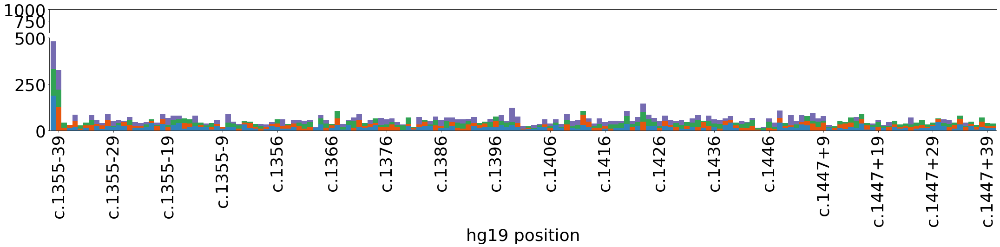

BB_test_Cos1053_JKLab0340_MM2B


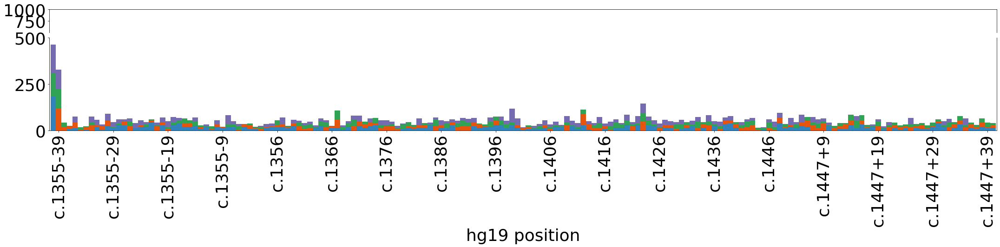

BB_test_Cos1053_oligodT_MM1B


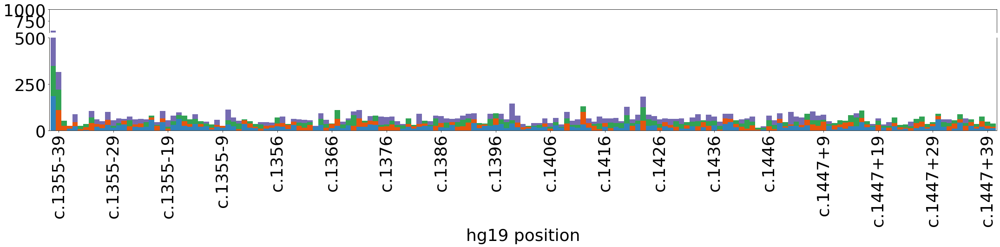

BB_test_Cos1053_oligodT_MM2B


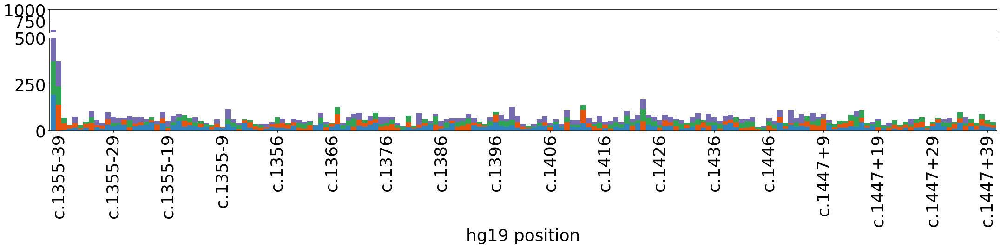

BB_RT_1_340_243_Cos1053


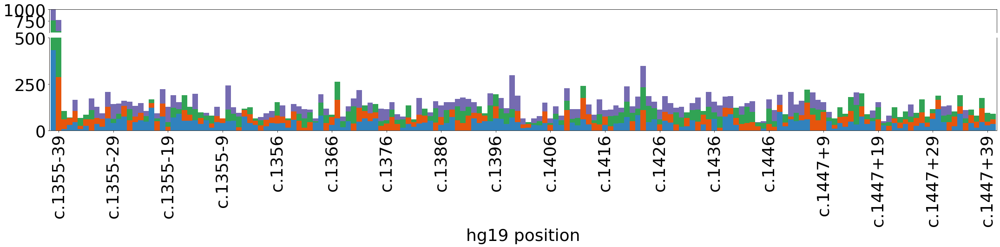

BB_RT_1_340_243_Hek1053


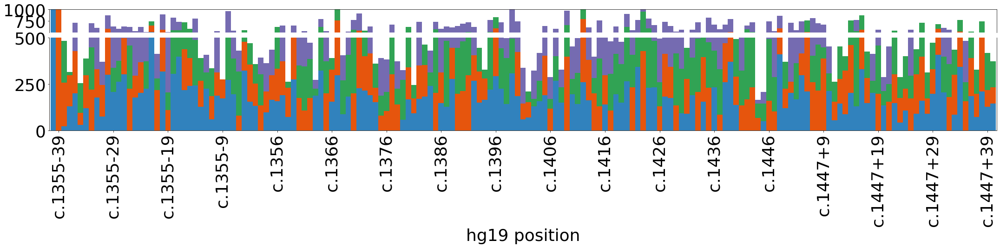

BB_RT_1_340_335_Cos1053


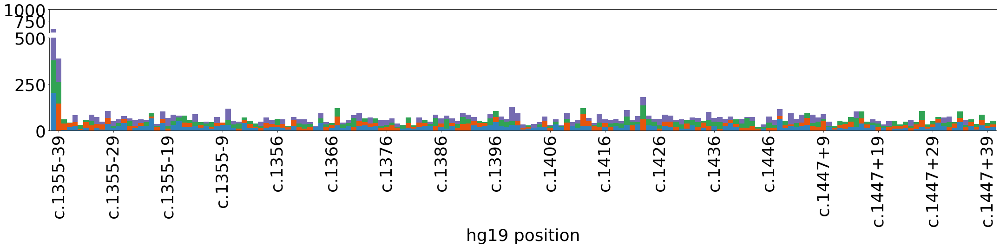

BB_RT_1_340_335_Hek1053


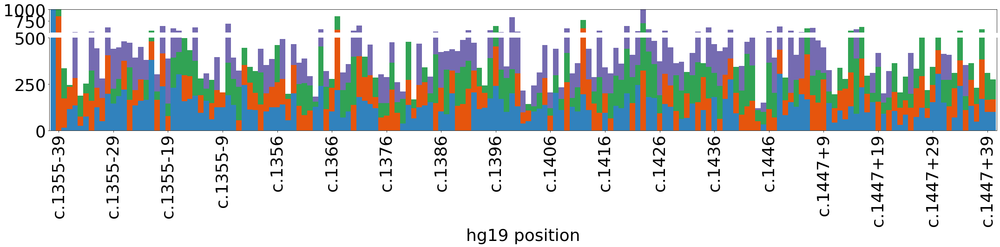

BB_RT_1b_340_243_Hek1053


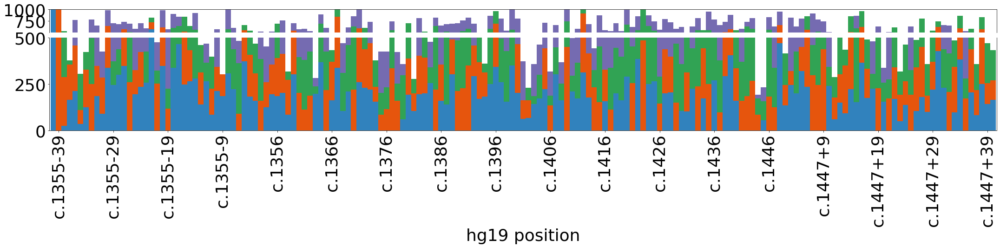

BB_RT_1b_340_335_Hek1053


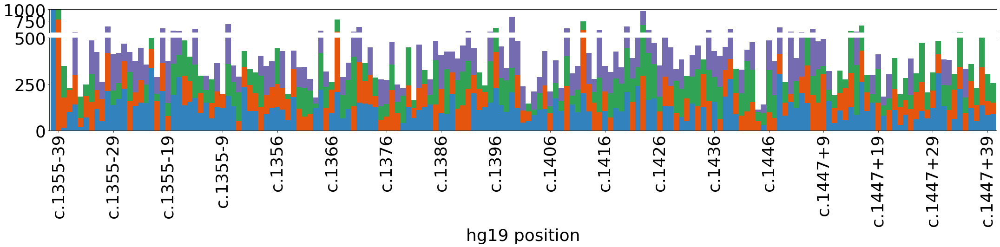

BB_RT_1b_ODT_243_Hek1053


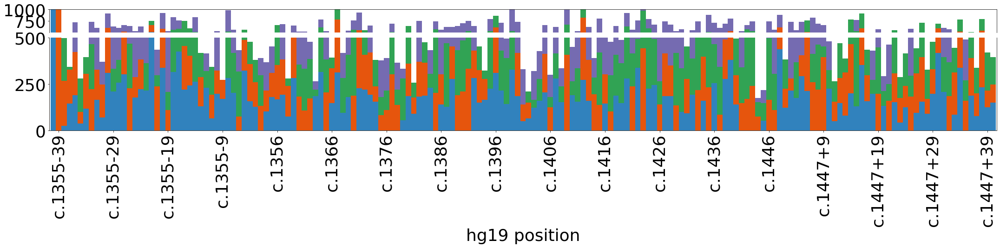

BB_RT_1b_ODT_335_Hek1053


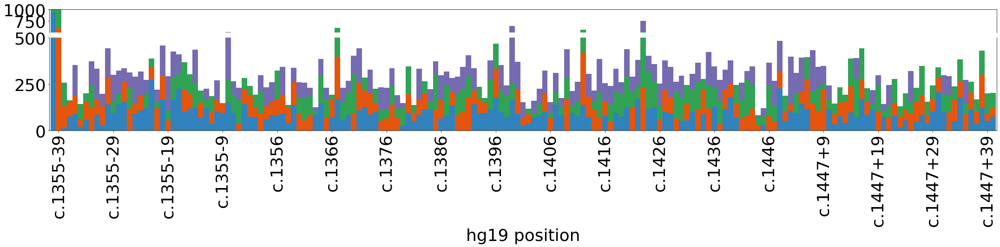

BB_RT_1_ODT_243_Cos1053


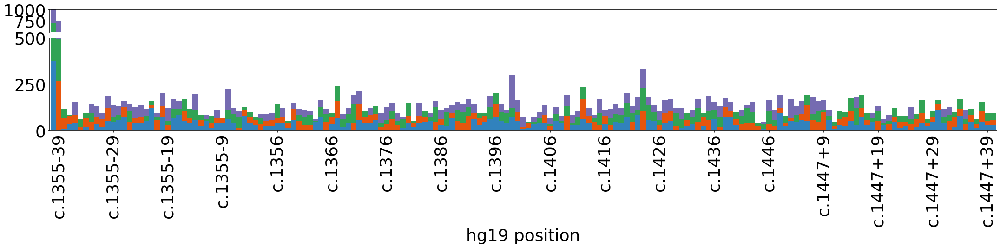

BB_RT_1_ODT_243_Hek1053


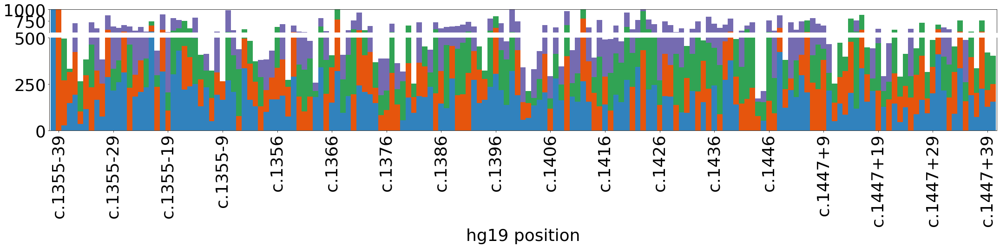

BB_RT_1_ODT_335_Cos1053


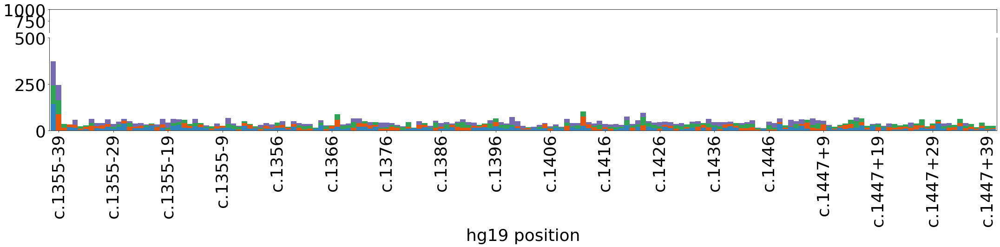

BB_RT_1_ODT_335_Hek1053


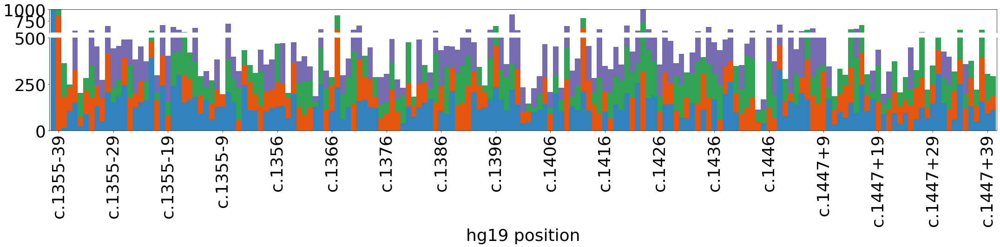

BB_RT_2_340_243_Cos1054


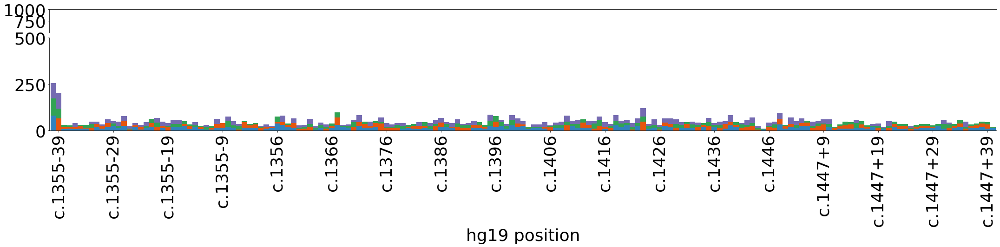

BB_RT_2_340_243_Hek1054


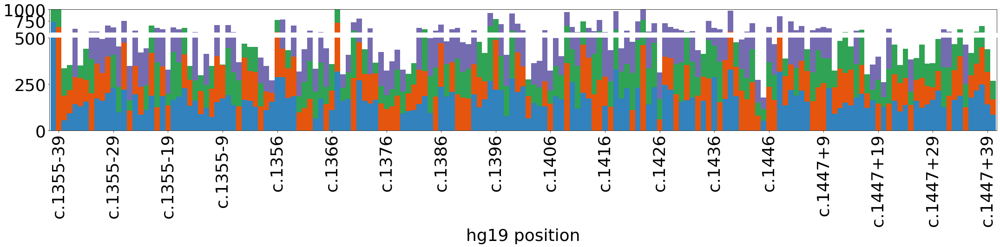

BB_RT_2_340_335_Cos1054


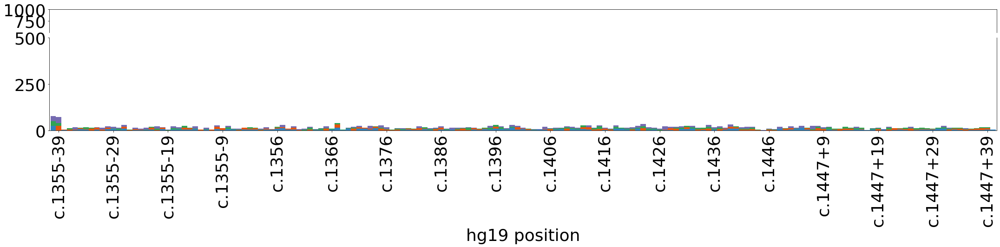

BB_RT_2_340_335_Hek1054


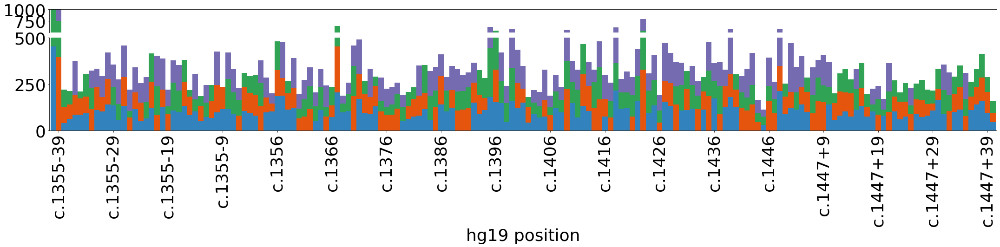

BB_RT_2_ODT_243_Cos1054


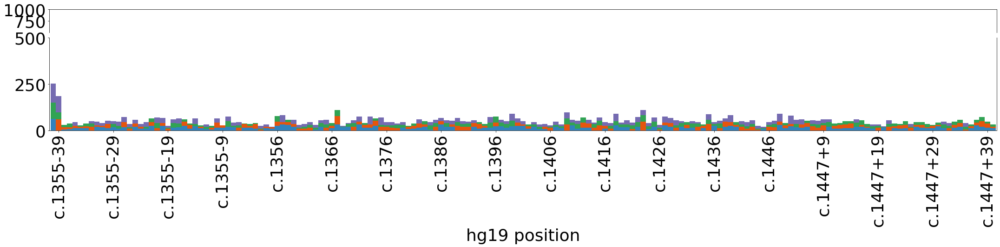

BB_RT_2_ODT_243_Hek1054


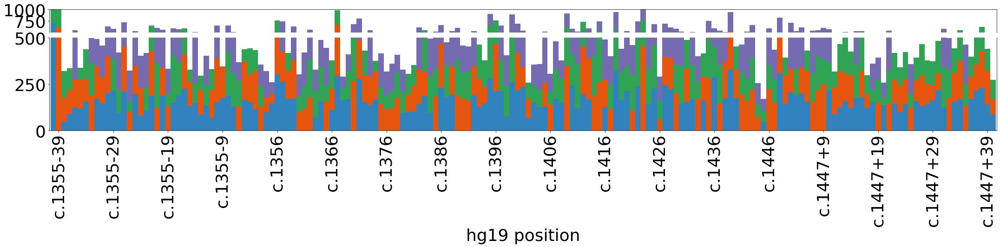

BB_RT_2_ODT_335_Hek1054


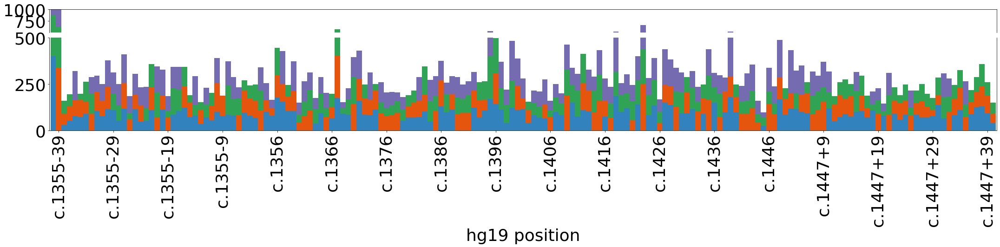

BB_RT_3_340_243_Cos1055


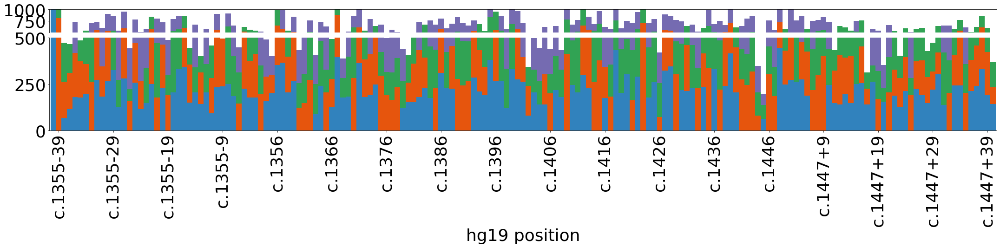

BB_RT_3_340_243_Hek1055


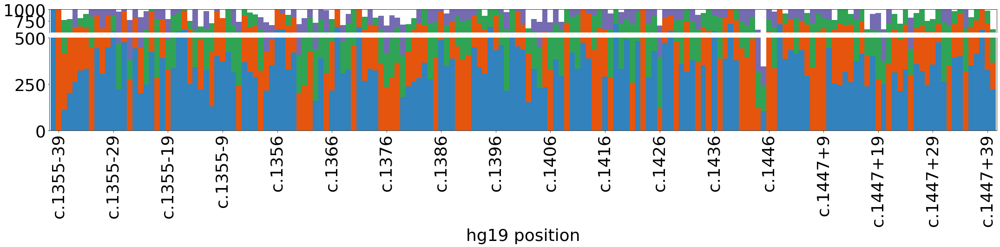

BB_RT_3_340_335_Cos1055


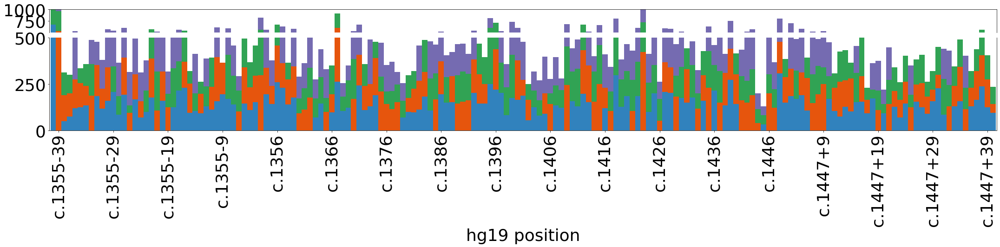

BB_RT_3_340_335_Hek1055


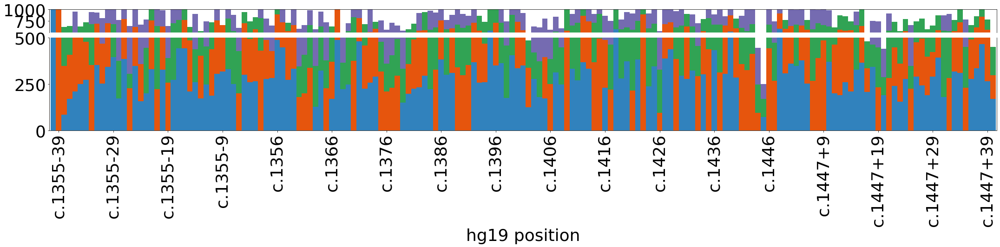

BB_RT_3_ODT_243_Cos1055


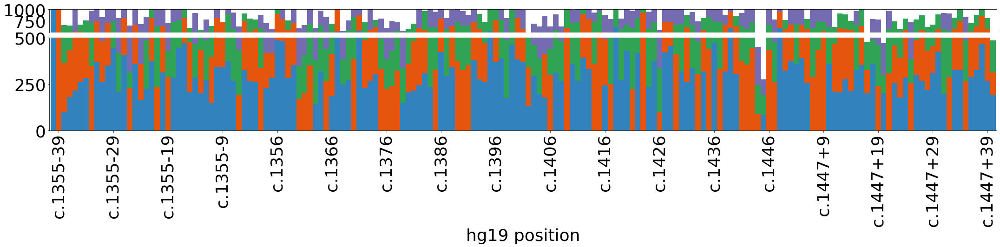

BB_RT_3_ODT_243_Hek1055


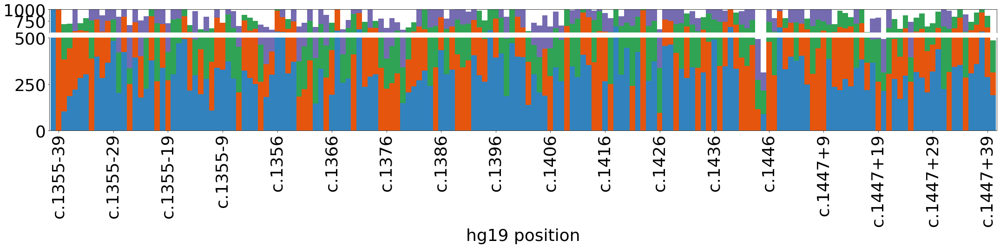

BB_RT_3_ODT_335_cos1055


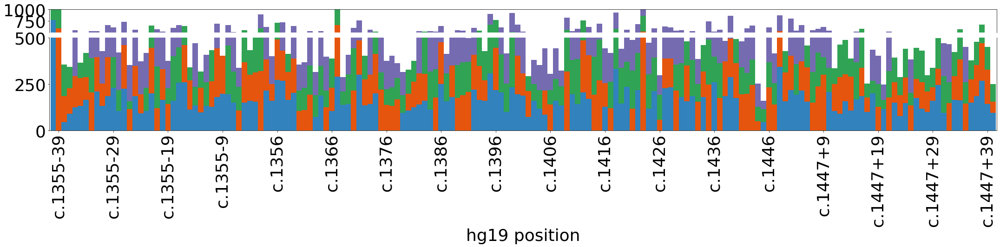

BB_RT_3_ODT_335_Hek1055


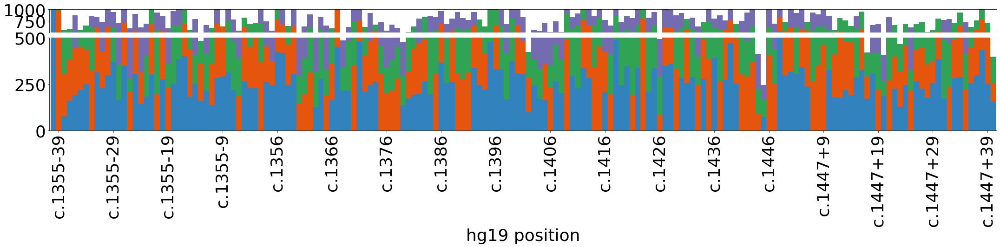

BB_RT_2_ODT_335_Cos1054


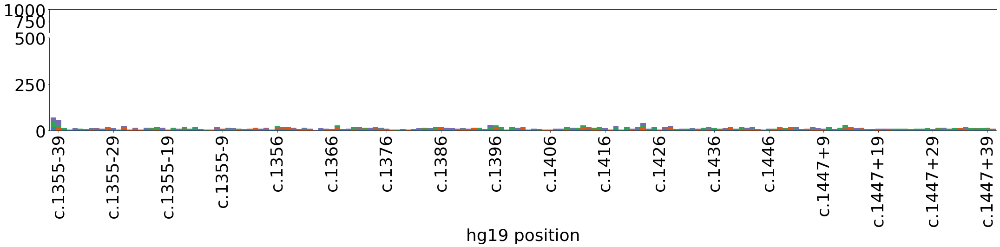

nan


TypeError: no numeric data to plot

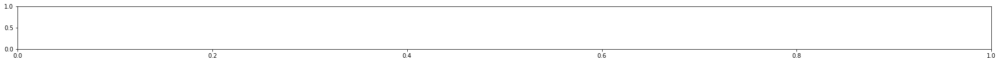

In [140]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.split_ax_bcs(  byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                  'ref': 'r',
                                                                                                                                  'alt_c': 'alt',
                                                                                                                                   'ref_c': 'ref' } ),
                  [ 'n_bc_passfilt' ],
                  'hgvs_pos',
                    [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                    [ ( 500.5, 1000 ), ( 0, 500 ) ],
                    fig_size = ( 30, 7.5 ),
                    legend = False,
                    hratios = [ 1, 4 ],
                    x_ax_title = 'hg19 position',
                    #tight = False,
                    #savefile = plot_out + 'bcs_filt_by_pos_split.pdf'
                           )

In [142]:
samp_by_rep_fn = {}

for samp in byvartbl_long['sample'].unique().tolist():
    
    if '_test_' in samp:
        rep = 'test'
    else:
        rep = samp.split( '_' )[ 2 ]
        
    if rep in samp_by_rep_fn:
        samp_by_rep_fn[ rep ].append( samp )
    else:
        samp_by_rep_fn[ rep ] = [ samp ]

In [143]:
byvartbl_long[ 'rep' ] = [ 'test' if '_test_' in samp else samp.split( '_' )[ 2 ]
                           for samp in byvartbl_long[ 'sample' ] ]

In [144]:
sample_stats = pp.across_sample_stats( [ byvartbl_long.loc[ ( byvartbl_long.pos >= 1227 ) & ( byvartbl_long.rep == rep ) ] for rep in samp_by_rep_fn ],
                                        samp_by_rep_fn,
                                        [ 'wmean_OTHER', 'wmean_SKIP', 'wmean_KTS+', 'wmean_KTS-' ]
                                       ) 

In [145]:
colors = { '1':'green', '1b':'blue', '2':'red', '3':'orange', 'test':'purple' }

per_var_seen


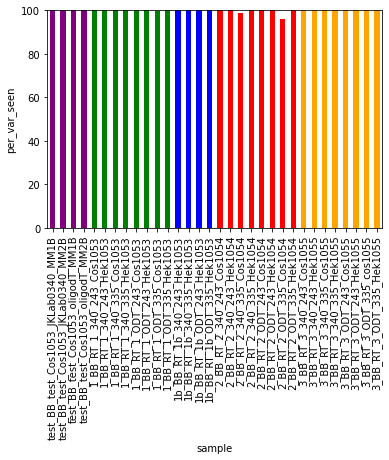

per_reads_passfilt


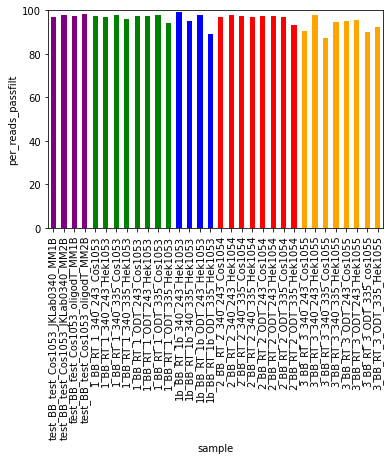

per_bc_passfilt


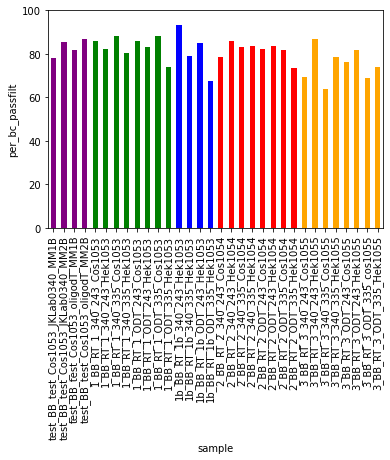

per_usable


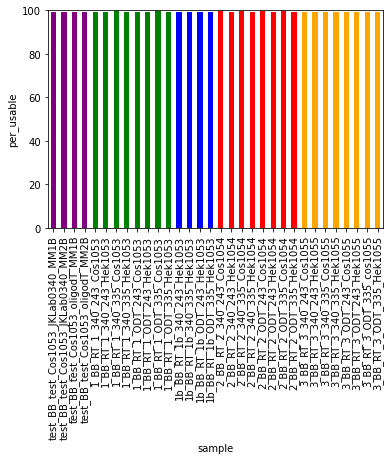

per_unmapped


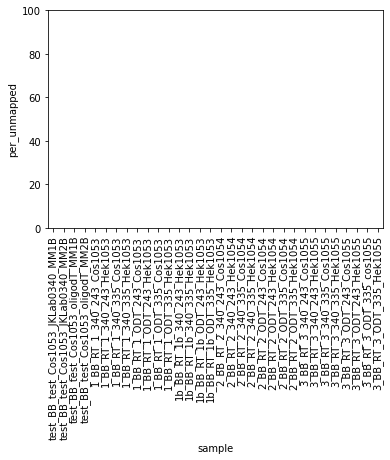

per_badstart


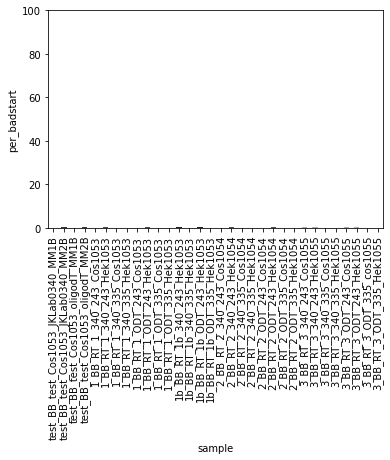

per_badend


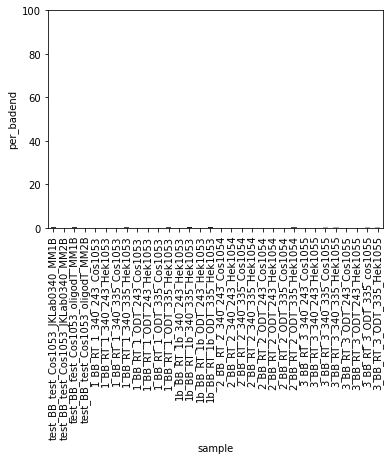

per_softclip


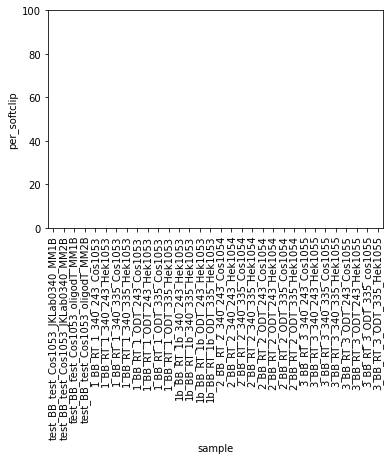

per_otheriso


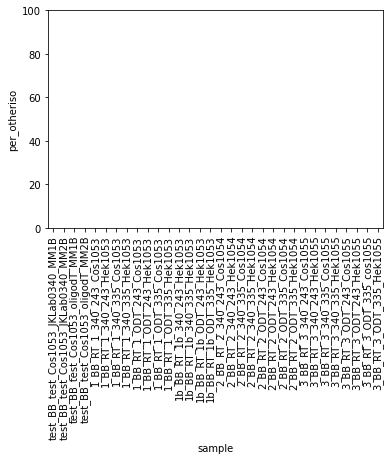

All missing for per_sdv - skipping...
All missing for per_sdv_ex - skipping...
All missing for per_sdv_in - skipping...
All missing for per_acc_used - skipping...
All missing for per_don_used - skipping...


In [146]:
for col in [ col for col in sample_stats if col.startswith( 'per_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   y_lim = ( 0, 100 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

per_unmapped


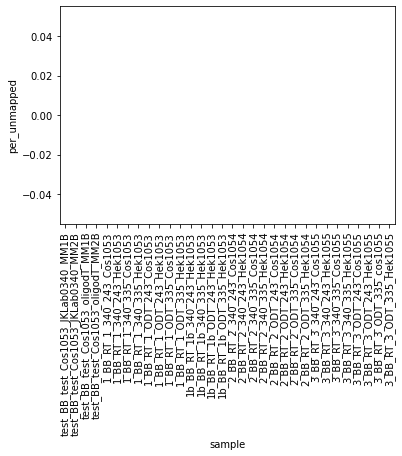

per_badstart


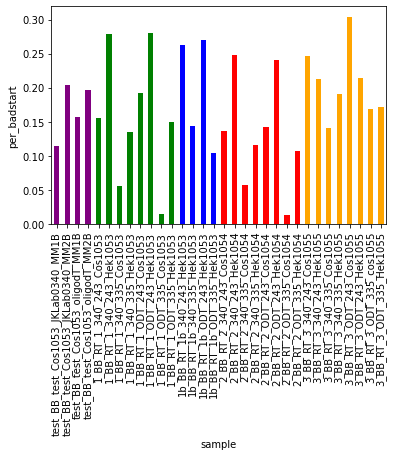

per_badend


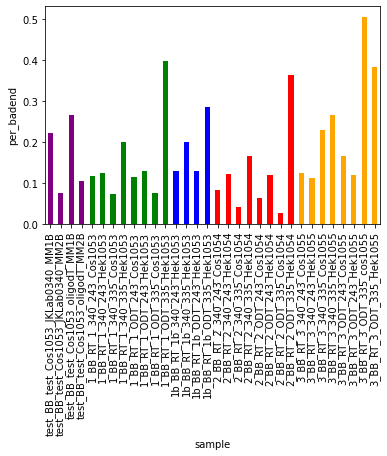

per_softclip


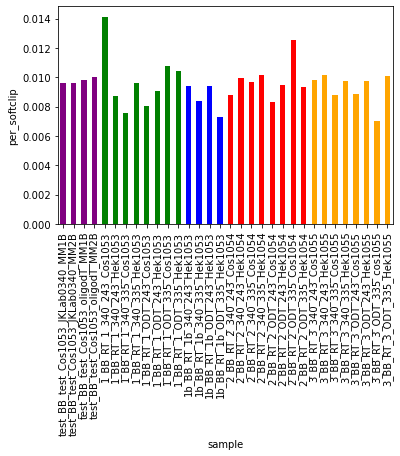

per_otheriso


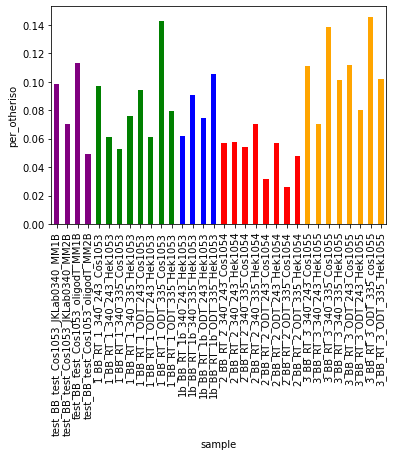

All missing for per_sdv - skipping...
All missing for per_sdv_ex - skipping...
All missing for per_sdv_in - skipping...
All missing for per_acc_used - skipping...
All missing for per_don_used - skipping...


In [147]:
for col in [ col for col in sample_stats if col.startswith( 'per_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    elif sample_stats[ col ].max() > 50:
        
        continue
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   #y_lim = ( 0, 100 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

psbl_var


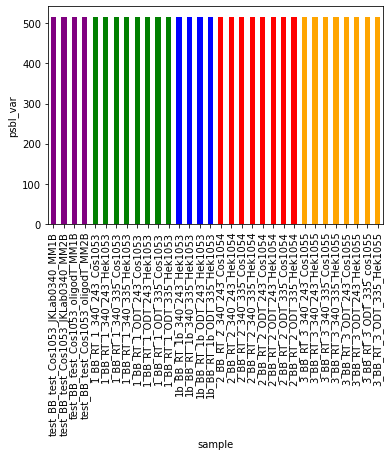

n_var


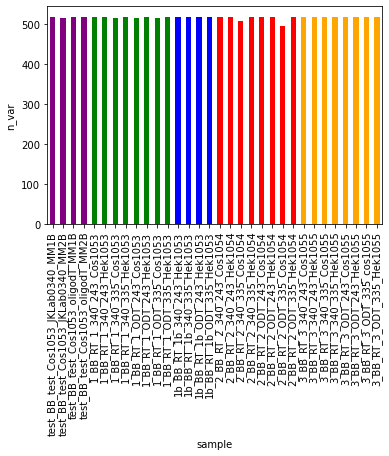

All missing for n_var_ex - skipping...
All missing for n_var_in - skipping...
n_reads


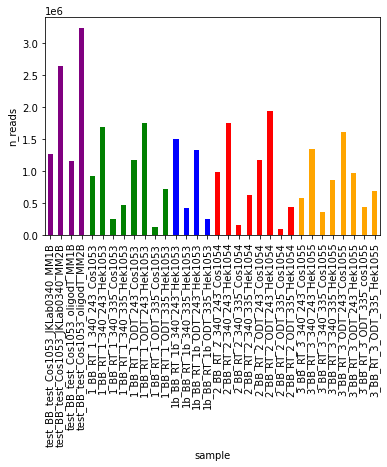

n_reads_passfilt


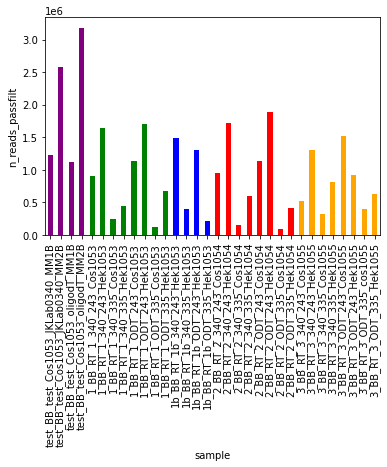

n_usable_reads


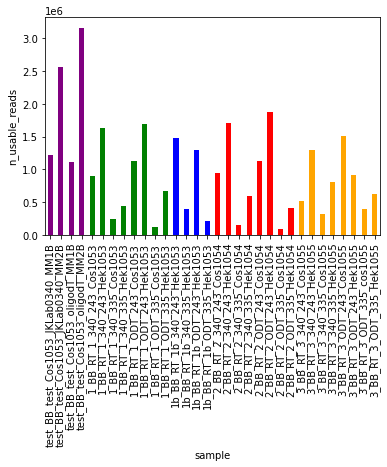

n_bc


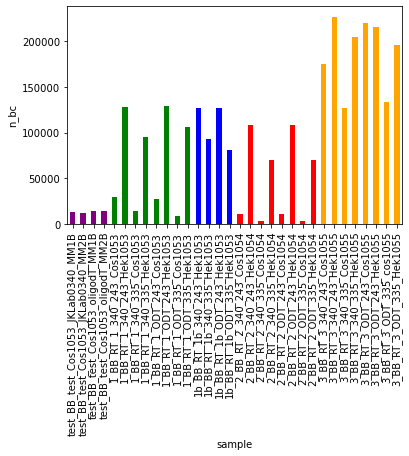

n_bc_passfilt


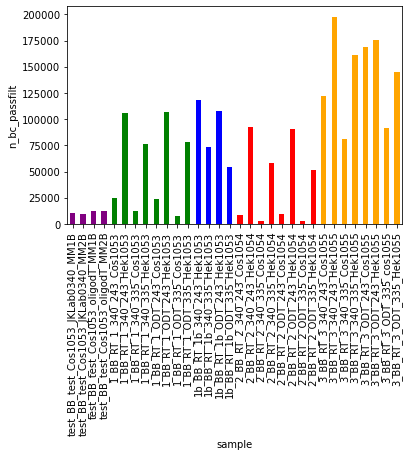

n_unmapped


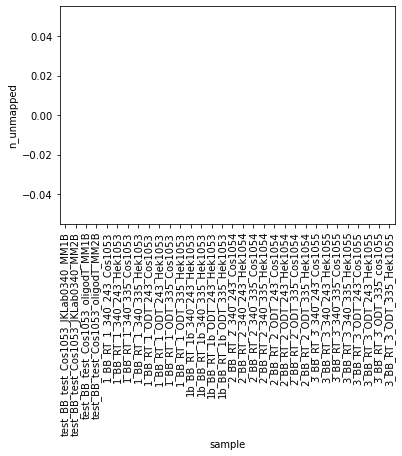

n_badstart


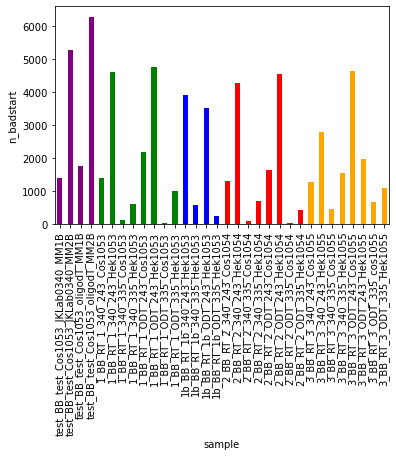

n_badend


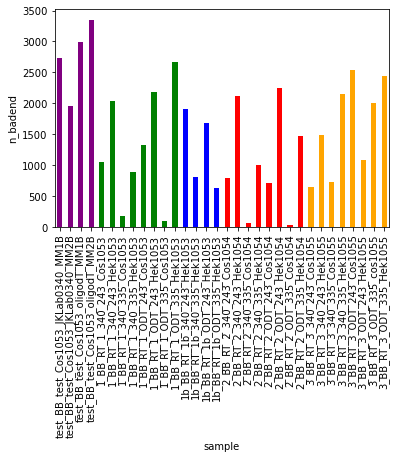

n_softclip


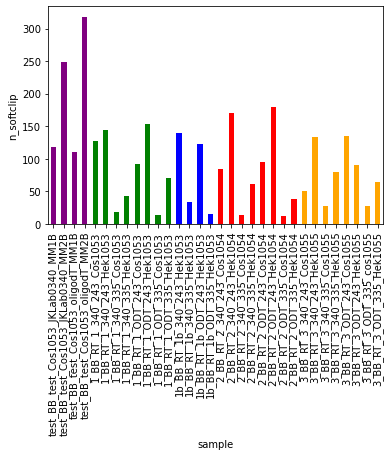

n_otheriso


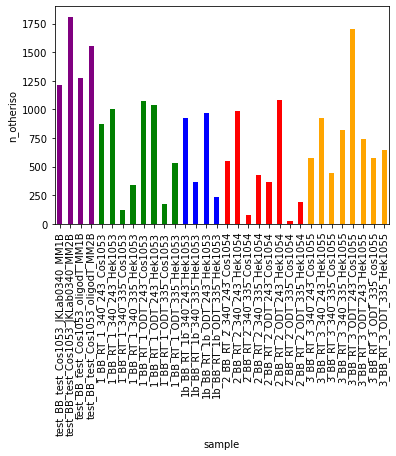

All missing for n_sdv - skipping...
All missing for n_sdv_ex - skipping...
All missing for n_sdv_in - skipping...
All missing for psbl_alt_acc - skipping...
All missing for psbl_alt_don - skipping...
All missing for n_alt_acc - skipping...
All missing for n_alt_don - skipping...
med_wmean_OTHER


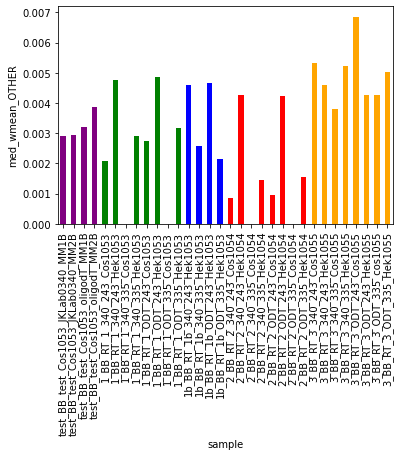

med_wmean_SKIP


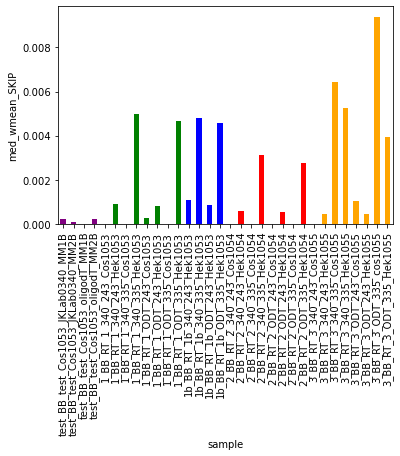

med_wmean_KTS+


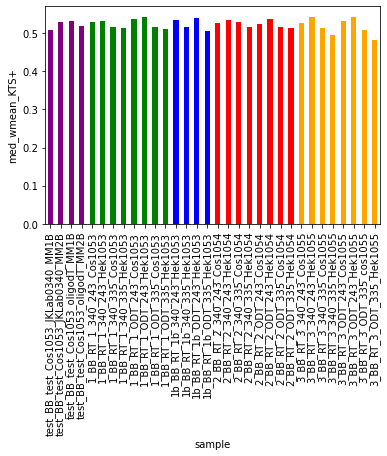

med_wmean_KTS-


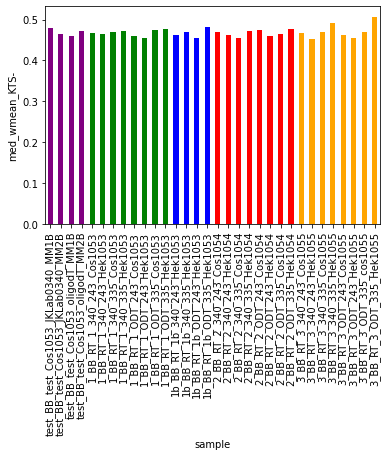

In [148]:
for col in [ col for col in sample_stats if not col.startswith( 'per_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    elif 'sample' in col:
        continue
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   #y_lim = ( 0, 100 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

med_wmean_OTHER


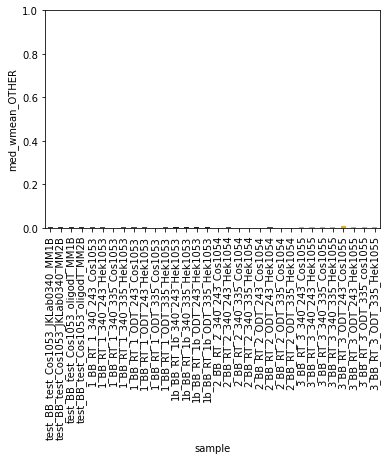

med_wmean_SKIP


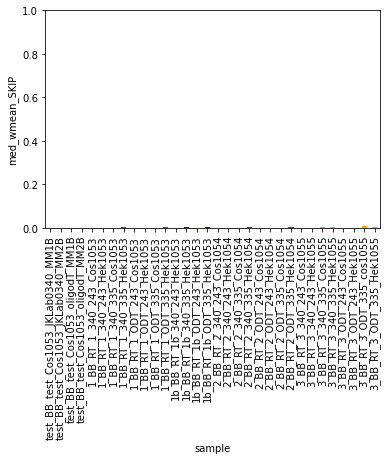

med_wmean_KTS+


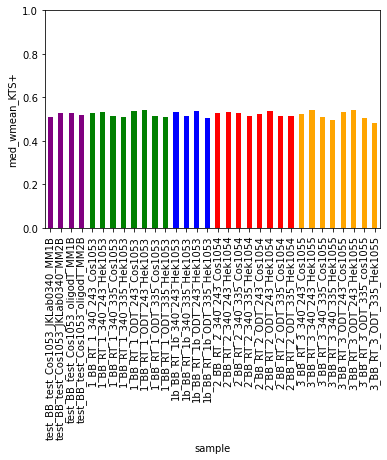

med_wmean_KTS-


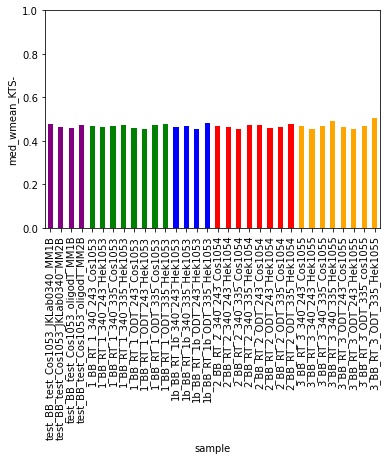

In [149]:
for col in [ col for col in sample_stats if col.startswith( 'med_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   y_lim = ( 0, 1 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

In [150]:
byvartbl_sat[ 'KTS_+_ratio' ] = ( byvartbl_sat[ 'wmean_KTS+' ] + .001 ) / ( byvartbl_sat[ 'wmean_KTS-' ] + .001 )

In [151]:
byvartbl_sat[ 'KTS_+_ratio' ].max()

1038.9746835443036

In [152]:
byvartbl_sat[ 'KTS_+_ratio' ].min()

0.0009832841691248771

In [153]:
byvartbl_sat[ 'KTS_+_ratio_log10' ] = np.log10( byvartbl_sat[ 'KTS_+_ratio' ] )

In [154]:
byvartbl_sat[ 'KTS_+_ratio_log10' ].max()

3.016604965332959

In [155]:
byvartbl_sat[ 'KTS_+_ratio_log10' ].min()

-3.0073209529227447

BB_test_Cos1053_JKLab0340_MM1B


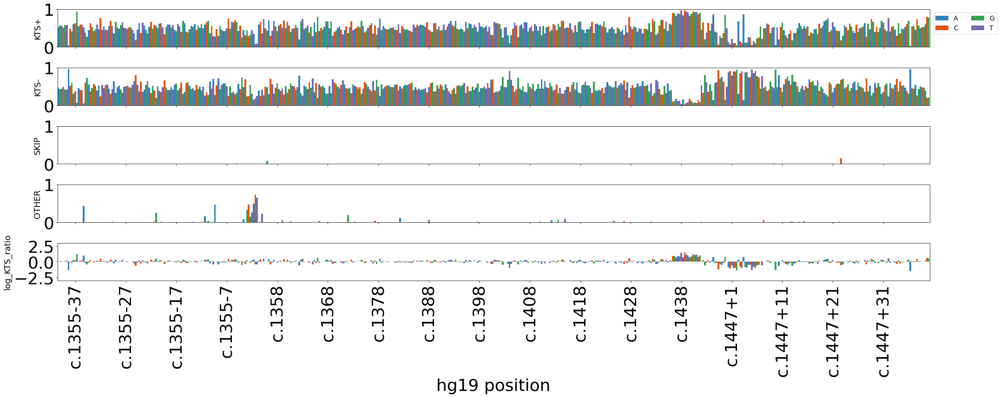

BB_test_Cos1053_JKLab0340_MM2B


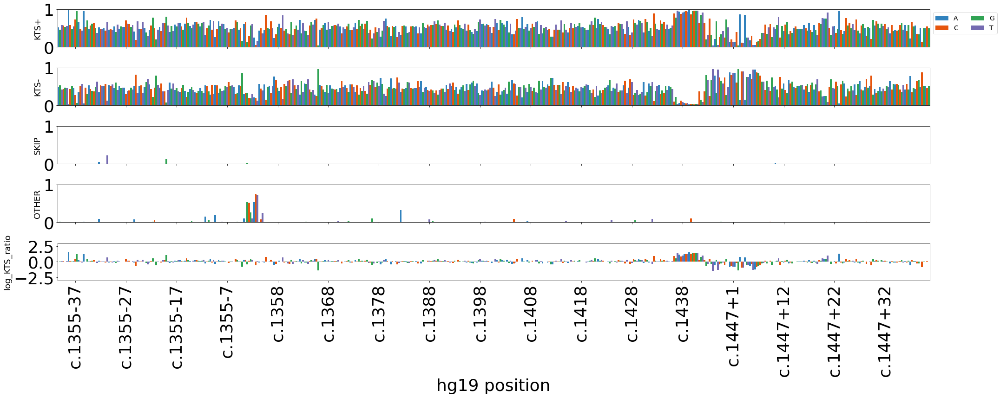

BB_test_Cos1053_oligodT_MM1B


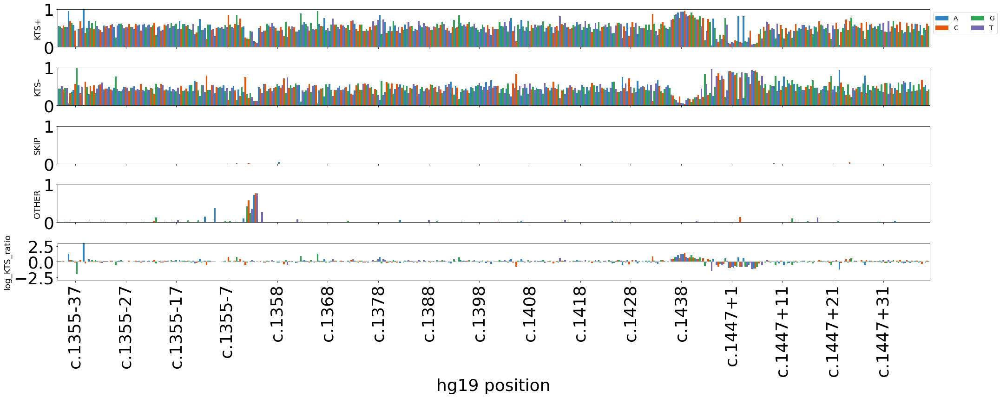

BB_test_Cos1053_oligodT_MM2B


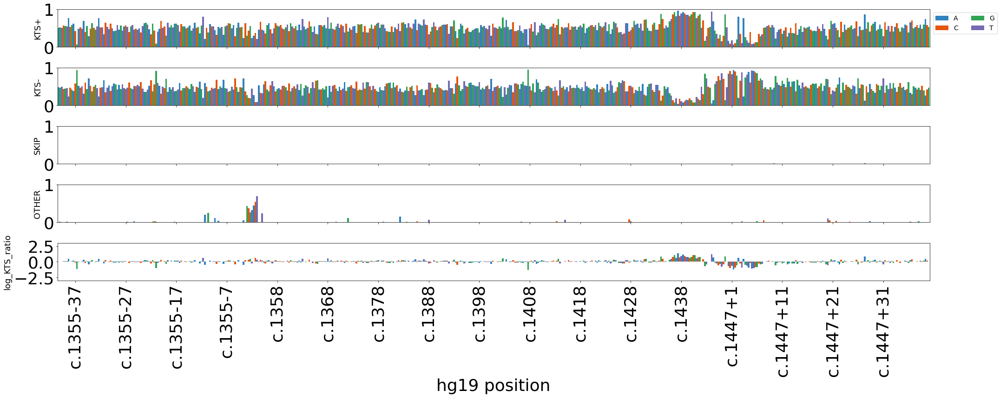

BB_RT_1_340_243_Cos1053


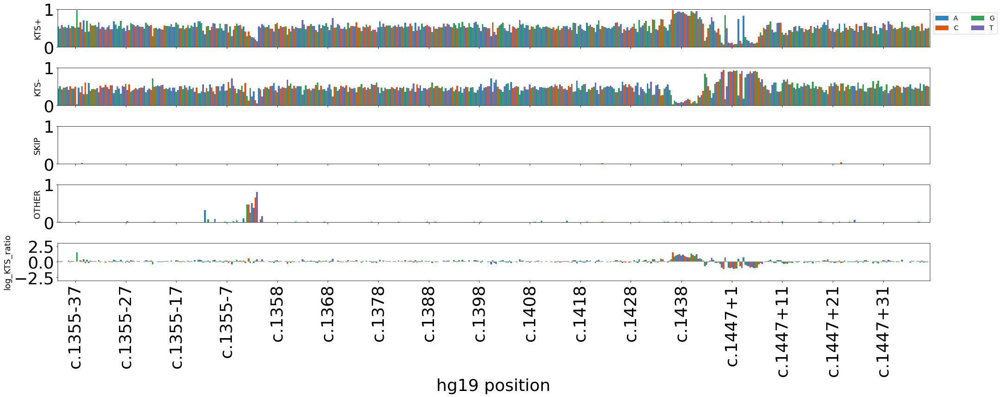

BB_RT_1_340_243_Hek1053


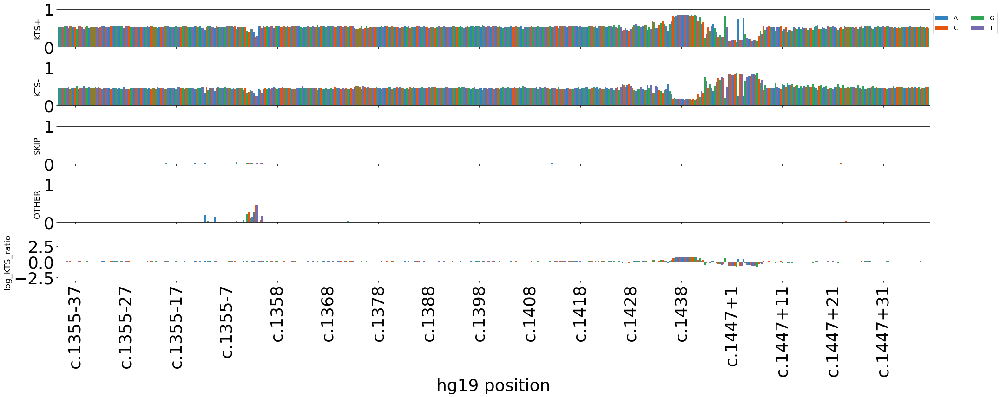

BB_RT_1_340_335_Cos1053


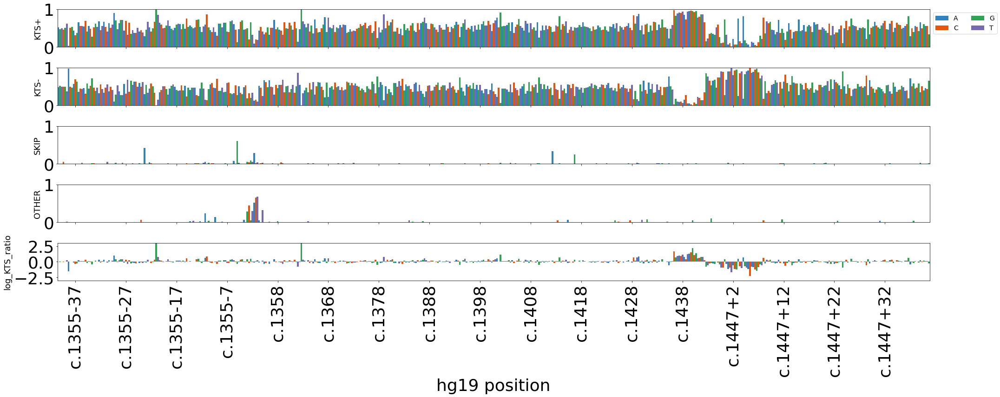

BB_RT_1_340_335_Hek1053


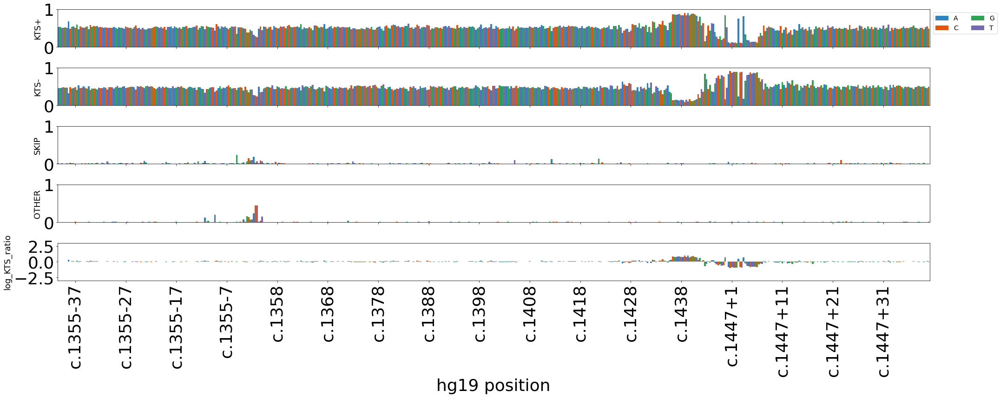

BB_RT_1b_340_243_Hek1053


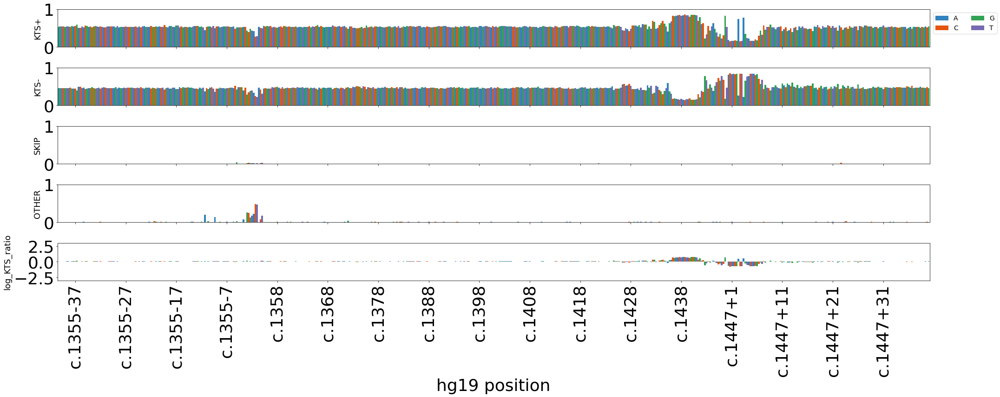

BB_RT_1b_340_335_Hek1053


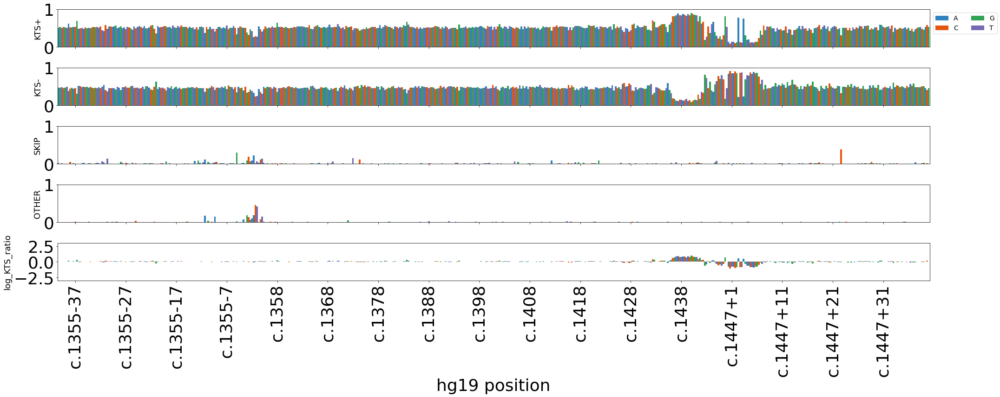

BB_RT_1b_ODT_243_Hek1053


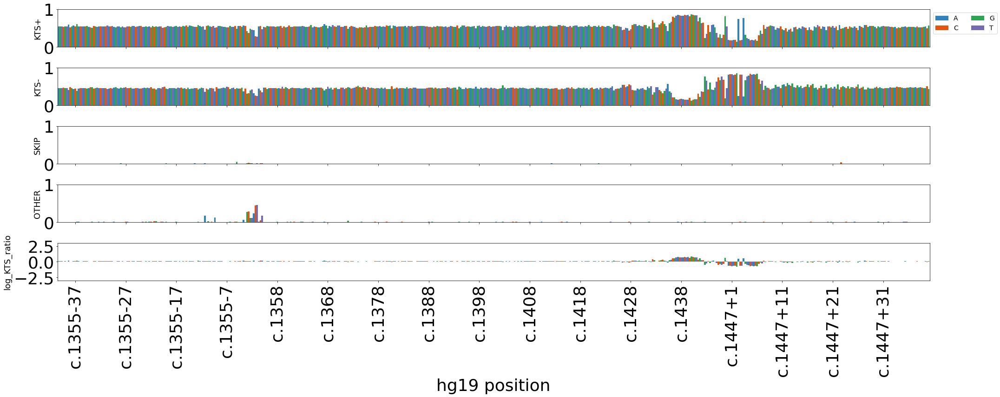

BB_RT_1b_ODT_335_Hek1053


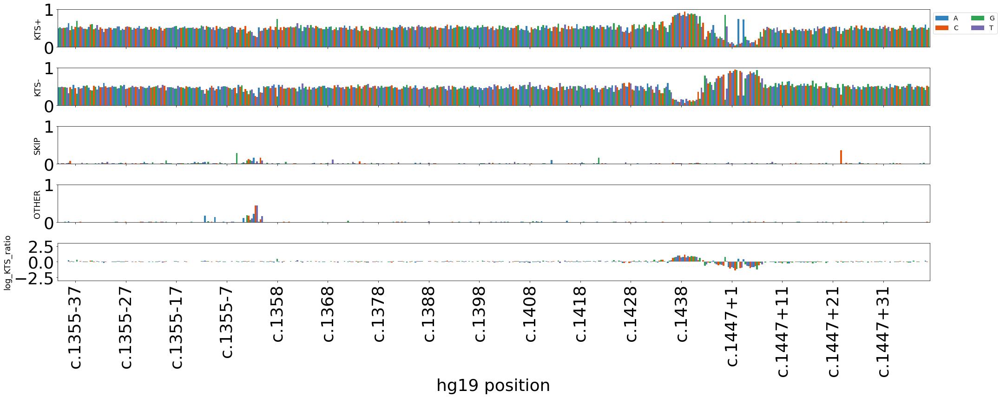

BB_RT_1_ODT_243_Cos1053


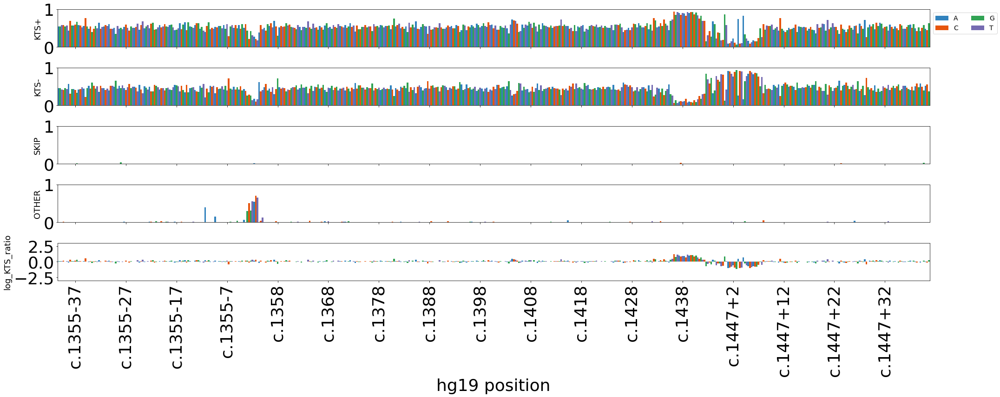

BB_RT_1_ODT_243_Hek1053


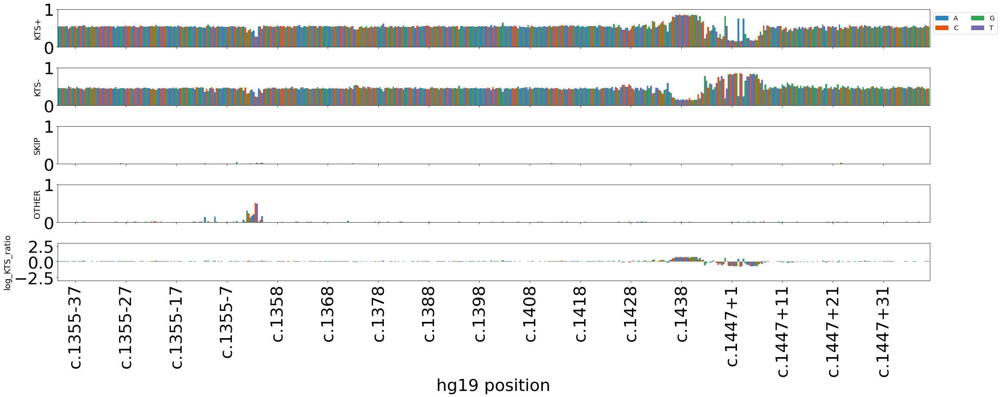

BB_RT_1_ODT_335_Cos1053


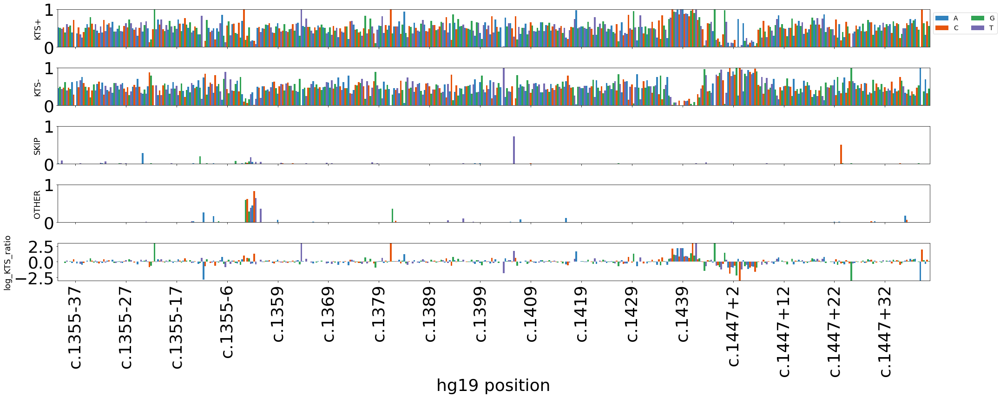

BB_RT_1_ODT_335_Hek1053


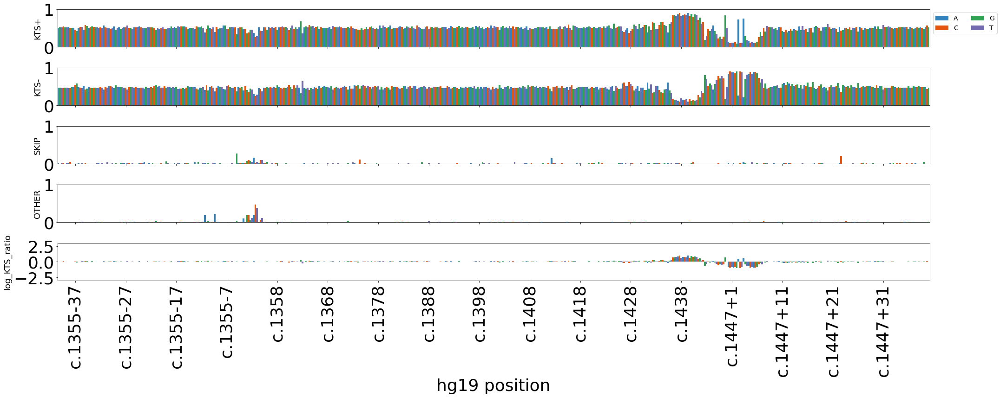

BB_RT_2_340_243_Cos1054


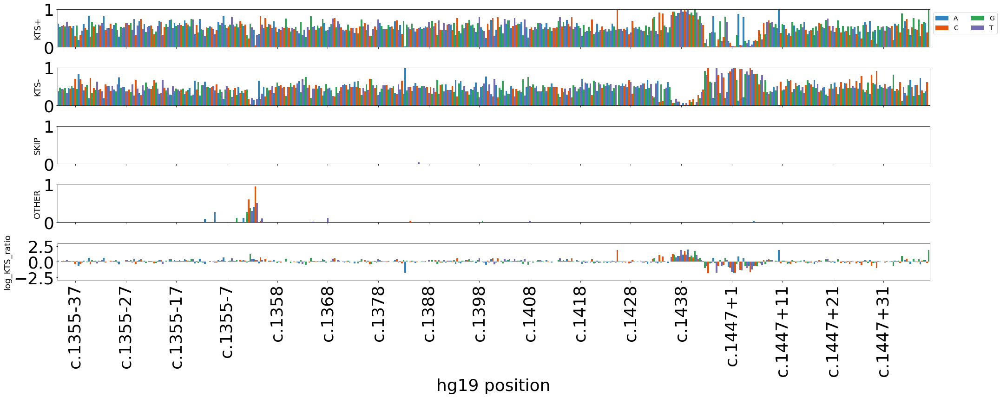

BB_RT_2_340_243_Hek1054


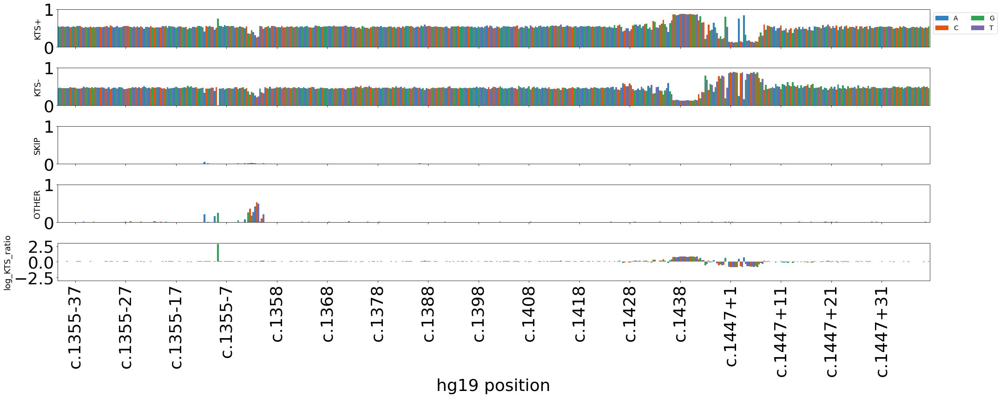

BB_RT_2_340_335_Cos1054


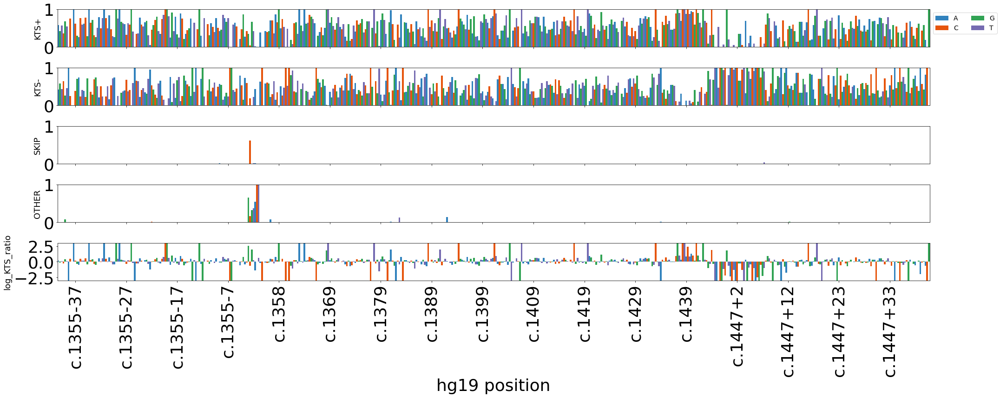

BB_RT_2_340_335_Hek1054


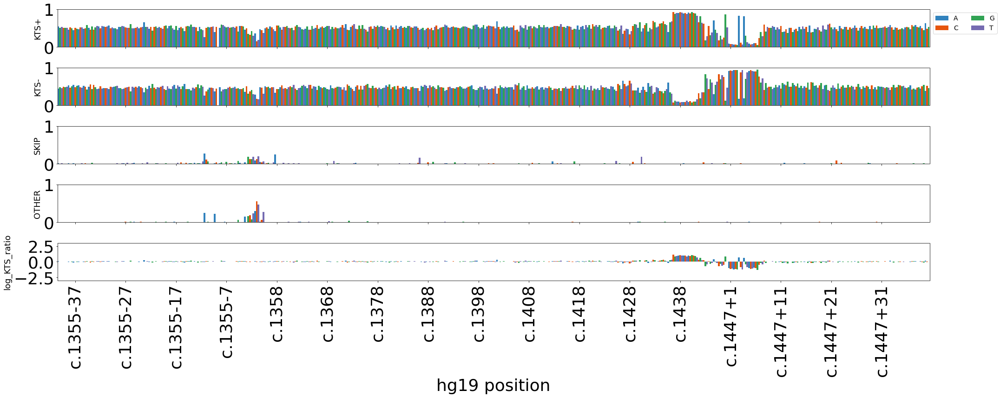

BB_RT_2_ODT_243_Cos1054


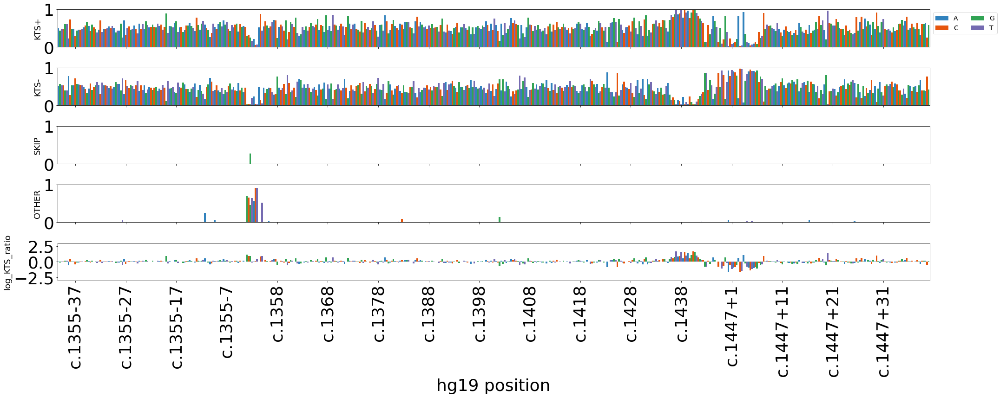

BB_RT_2_ODT_243_Hek1054


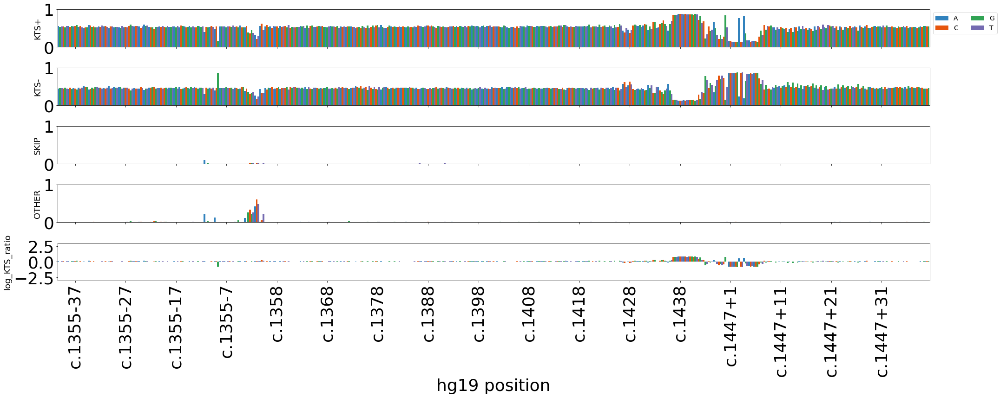

BB_RT_2_ODT_335_Hek1054


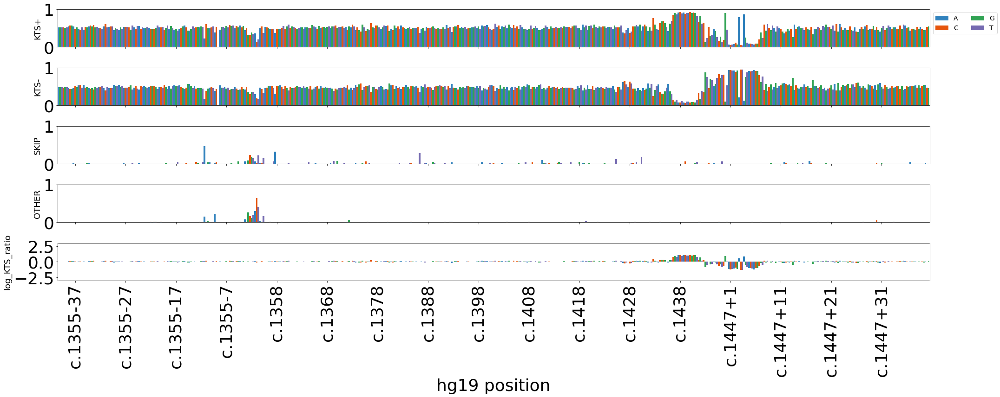

BB_RT_3_340_243_Cos1055


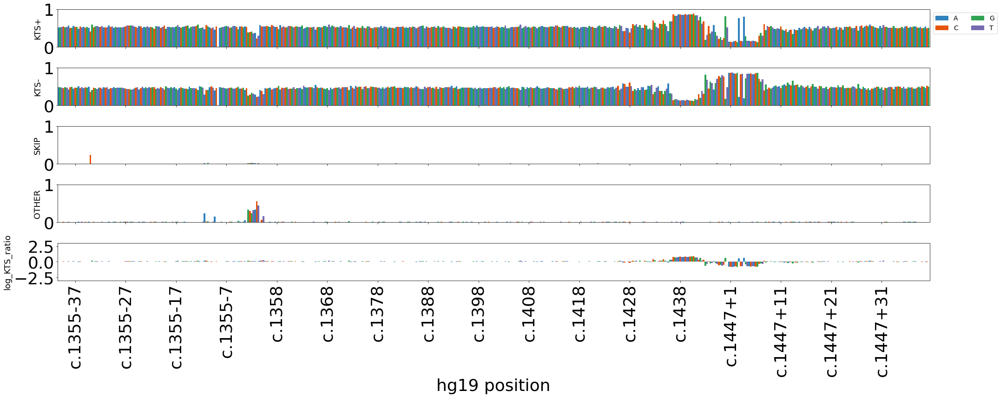

BB_RT_3_340_243_Hek1055


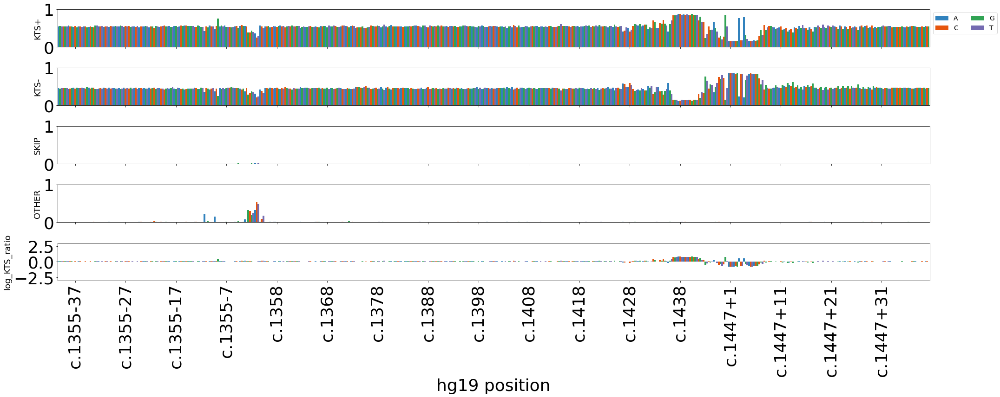

BB_RT_3_340_335_Cos1055


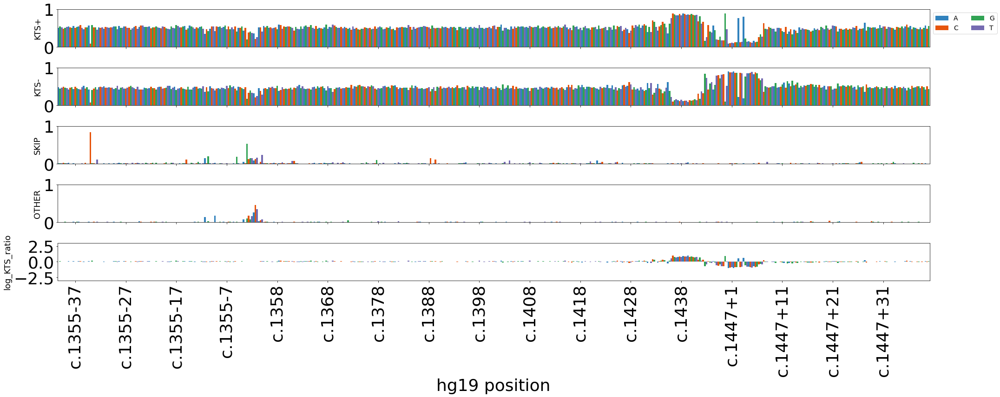

BB_RT_3_340_335_Hek1055


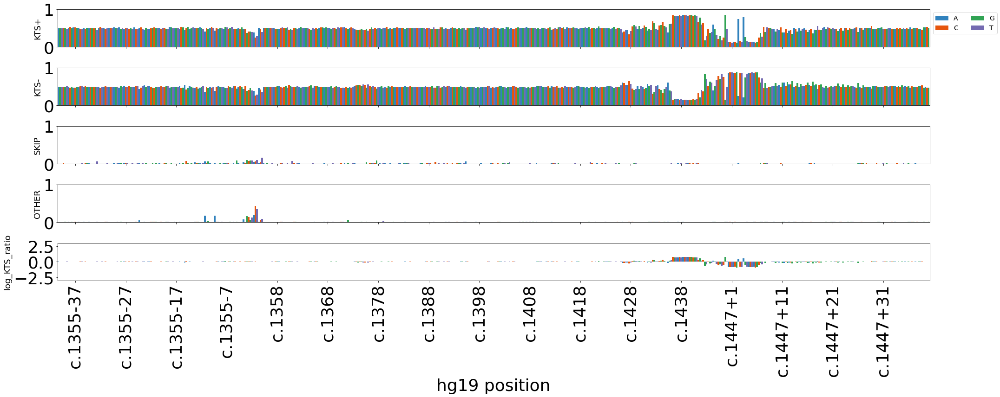

BB_RT_3_ODT_243_Cos1055


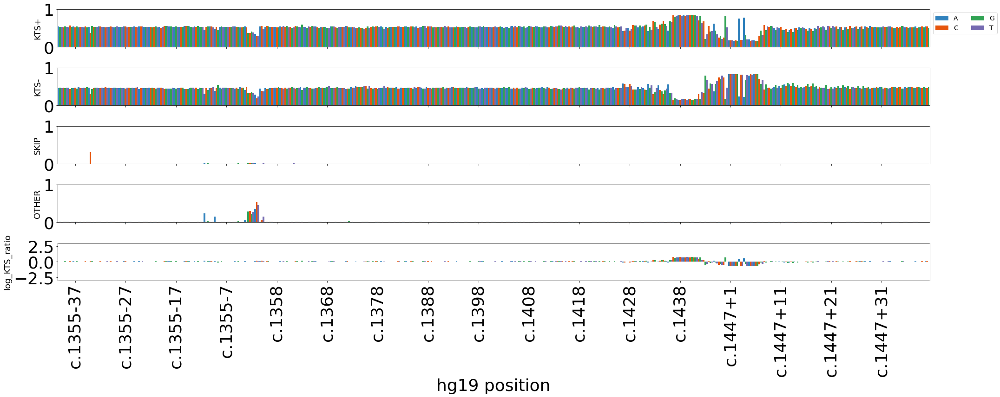

BB_RT_3_ODT_243_Hek1055


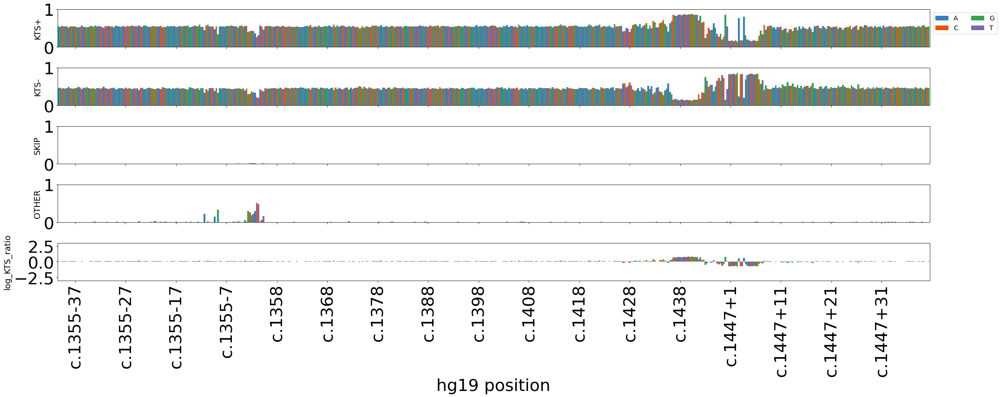

BB_RT_3_ODT_335_cos1055


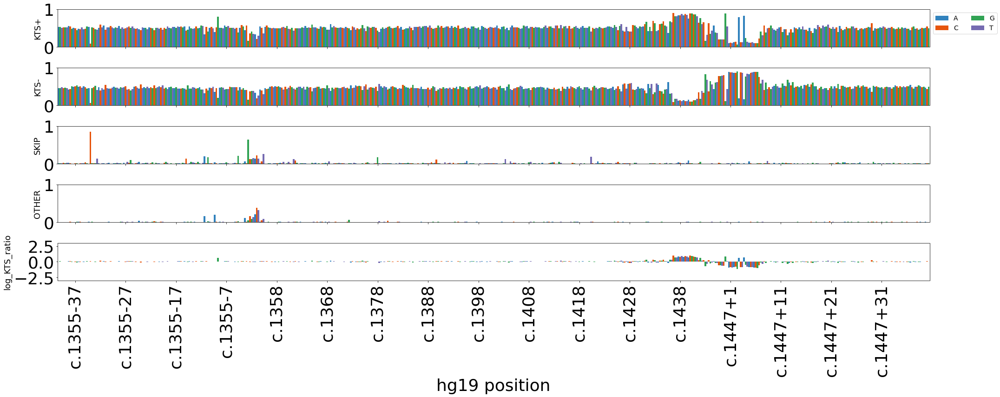

BB_RT_3_ODT_335_Hek1055


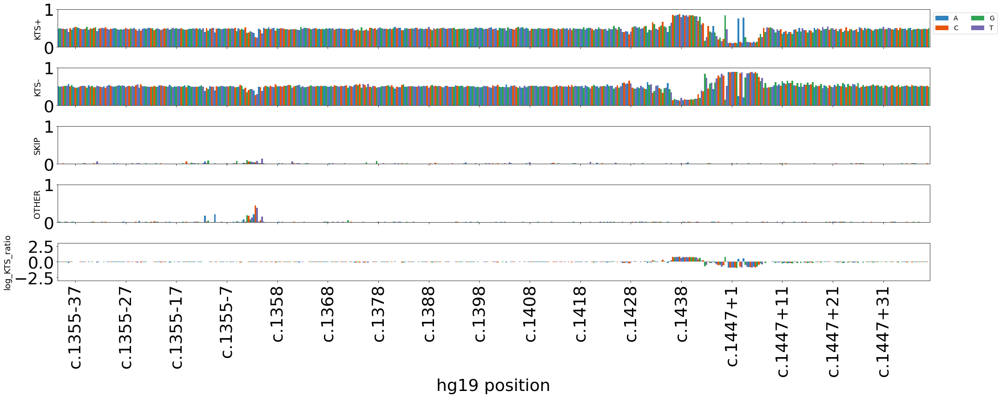

BB_RT_2_ODT_335_Cos1054


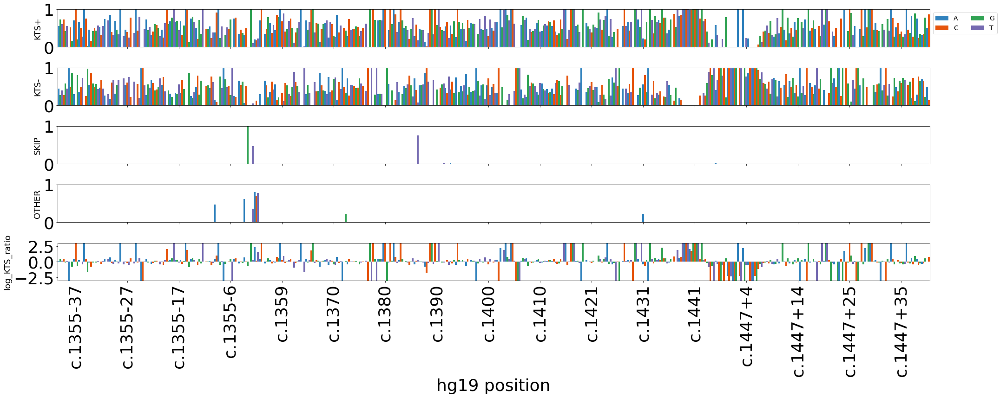

/home/smithcat/splfxseq/splanl/plots.py:2882: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  ax.set_xlim( ( -.5, len( tbv ) - .5 ) )
No handles with labels found to put in legend.


nan


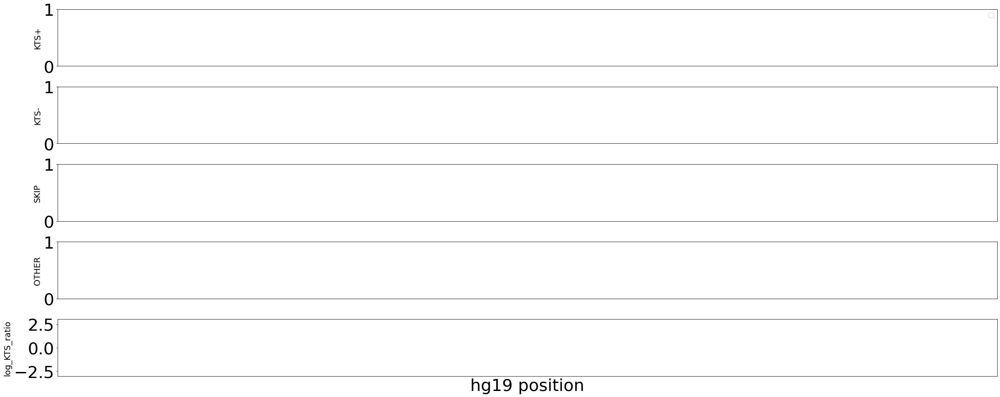

In [156]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.sat_subplots_wrapper( byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                         'ref': 'r',
                                                                                                                                          'alt_c': 'alt',
                                                                                                                                         'ref_c': 'ref' } ),
                         [ col for col in byvartbl_sat if col.startswith( 'wmean_' ) ] + [ 'KTS_+_ratio_log10' ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 12 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -3, 3 ) ],
                          y_ax_title = [ col[ 6: ] for col in byvartbl_sat if col.startswith( 'wmean_' ) ] + [ 'log_KTS_ratio' ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [157]:
low_bc_samps = [ 'BB_RT_2_340_243_Cos1054', 'BB_RT_2_ODT_335_Cos1054', 'BB_RT_2_ODT_243_Cos1054', 'BB_RT_2_340_335_Cos1054',  ]  

BB_RT_2_340_243_Cos1054


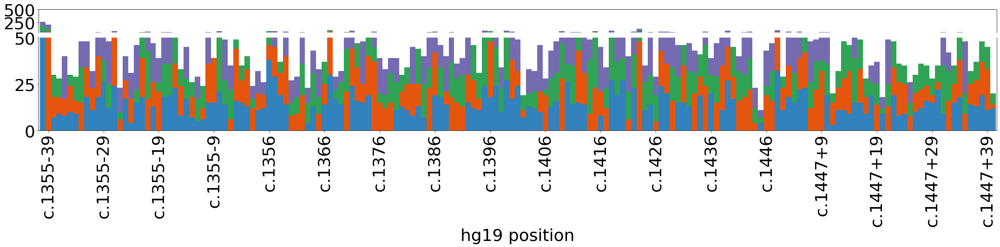

BB_RT_2_340_335_Cos1054


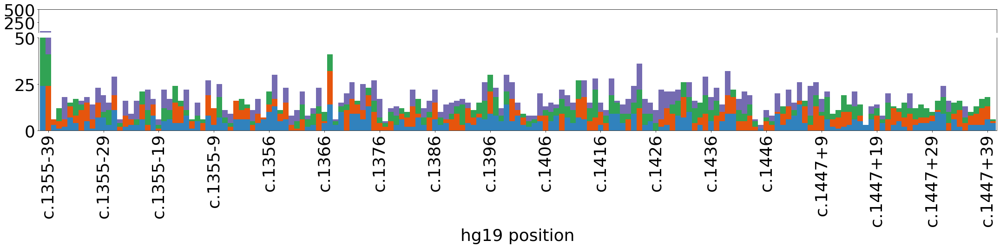

BB_RT_2_ODT_243_Cos1054


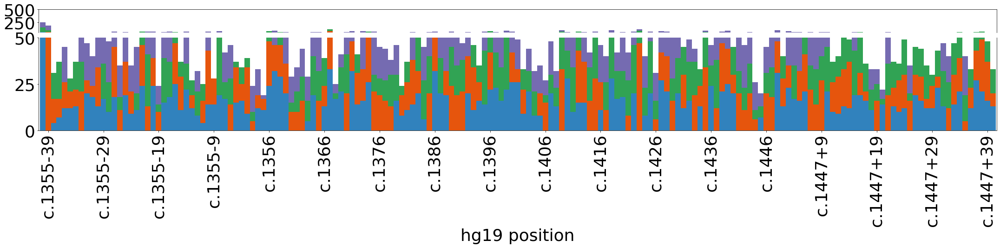

BB_RT_2_ODT_335_Cos1054


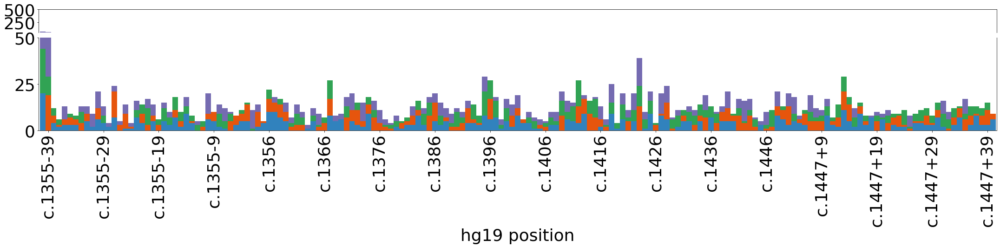

In [158]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    if samp not in low_bc_samps:
        continue
    
    print( samp )

    sp.split_ax_bcs(  byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                  'ref': 'r',
                                                                                                                                  'alt_c': 'alt',
                                                                                                                                   'ref_c': 'ref' } ),
                  [ 'n_bc_passfilt' ],
                  'hgvs_pos',
                    [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                    [ ( 50.5, 500 ), ( 0, 50 ) ],
                    fig_size = ( 30, 7.5 ),
                    legend = False,
                    hratios = [ 1, 4 ],
                    x_ax_title = 'hg19 position',
                    #tight = False,
                    #savefile = plot_out + 'bcs_filt_by_pos_split.pdf'
                           )

BB_test_Cos1053_JKLab0340_MM1B


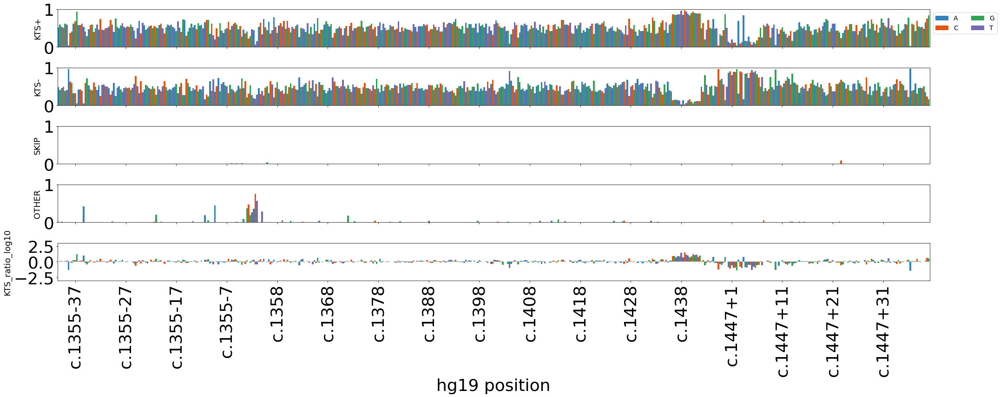

BB_test_Cos1053_JKLab0340_MM2B


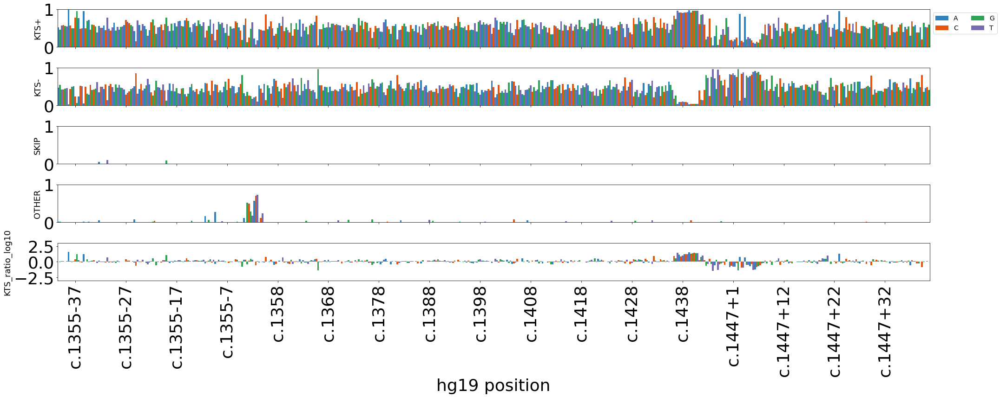

BB_test_Cos1053_oligodT_MM1B


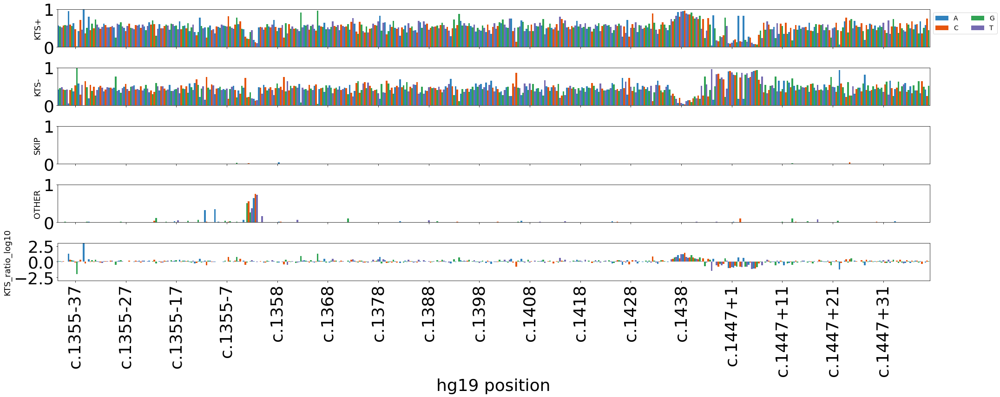

BB_test_Cos1053_oligodT_MM2B


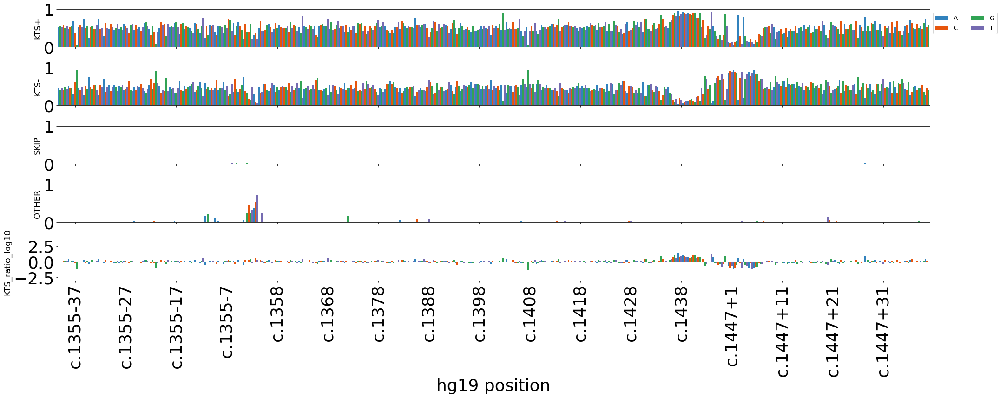

BB_RT_1_340_243_Cos1053


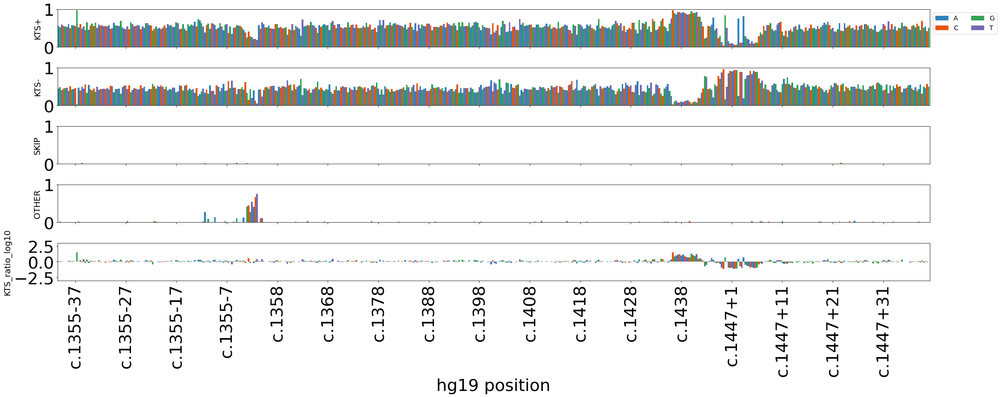

BB_RT_1_340_243_Hek1053


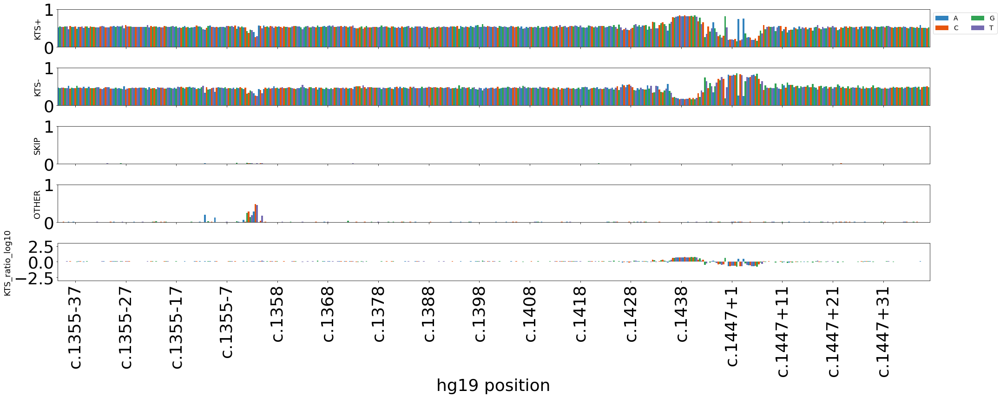

BB_RT_1_340_335_Cos1053


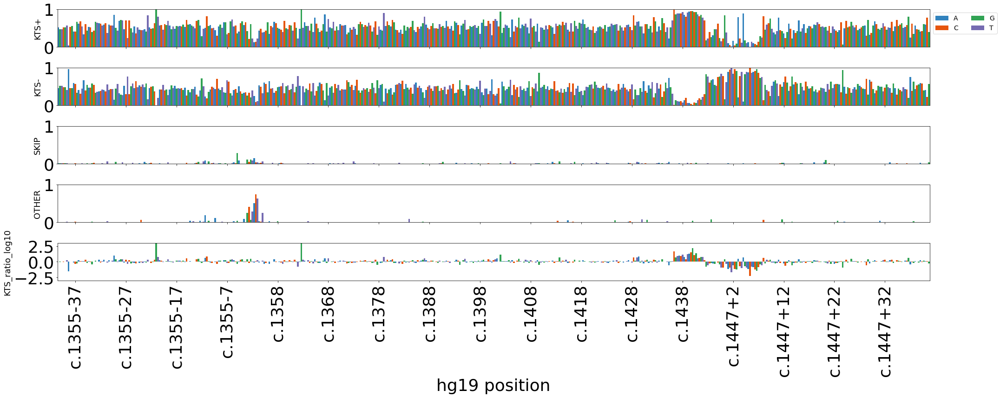

BB_RT_1_340_335_Hek1053


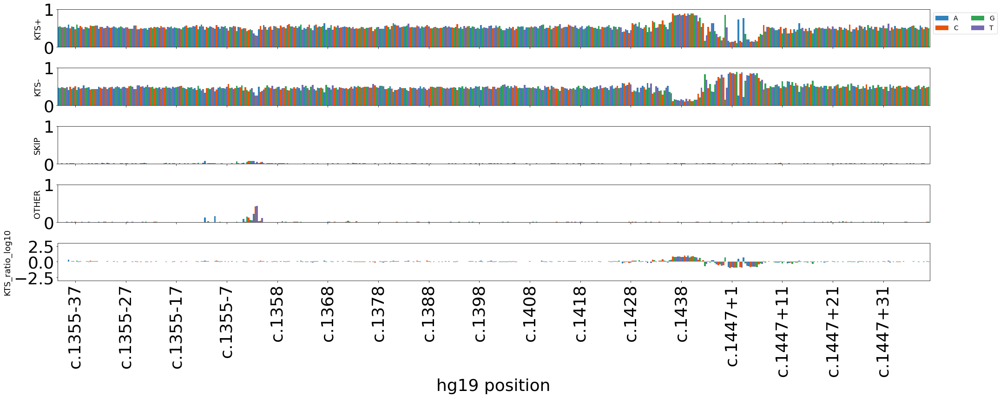

BB_RT_1b_340_243_Hek1053


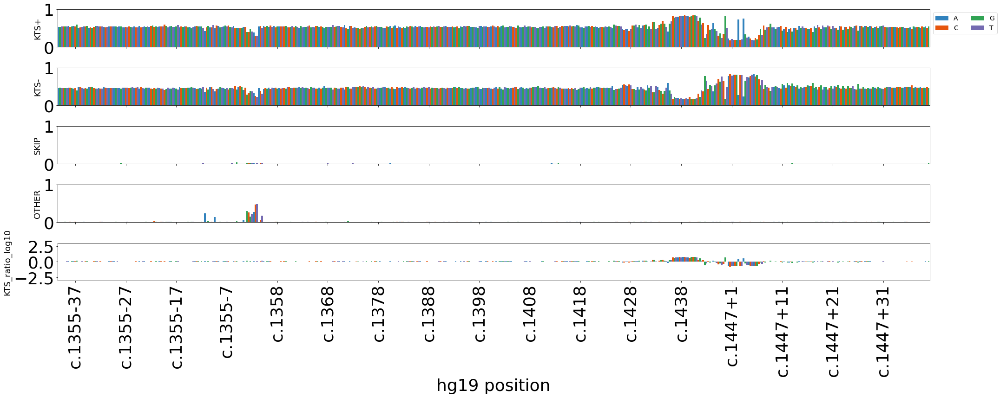

BB_RT_1b_340_335_Hek1053


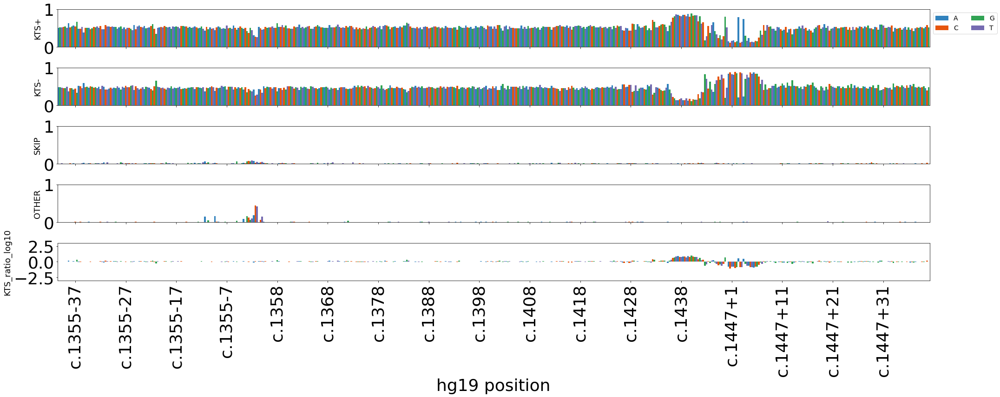

BB_RT_1b_ODT_243_Hek1053


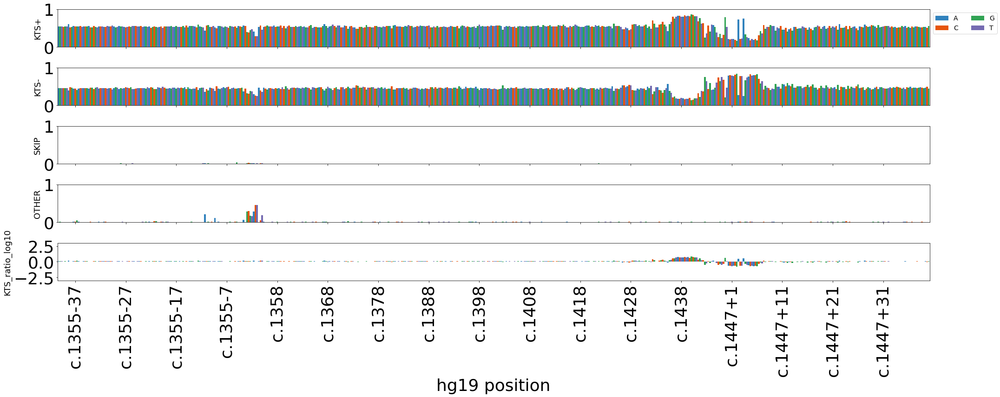

BB_RT_1b_ODT_335_Hek1053


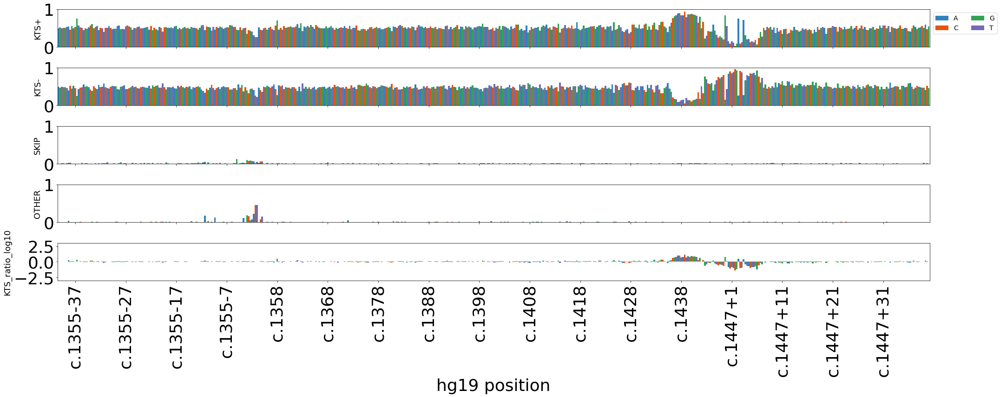

BB_RT_1_ODT_243_Cos1053


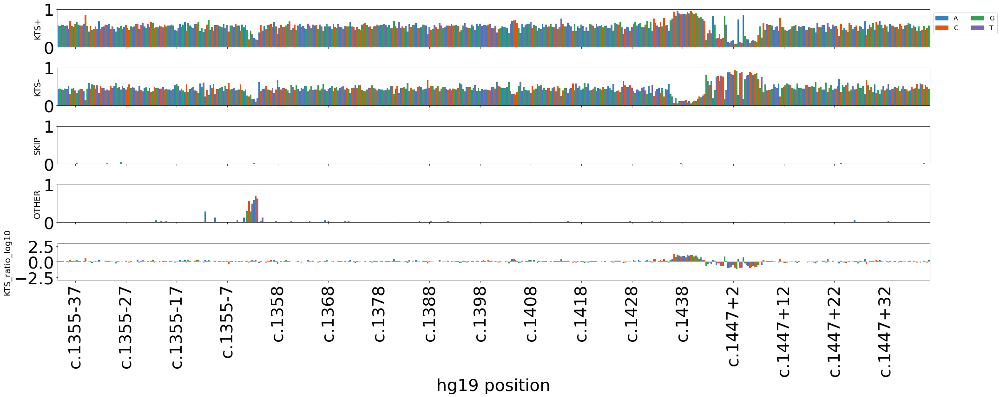

BB_RT_1_ODT_243_Hek1053


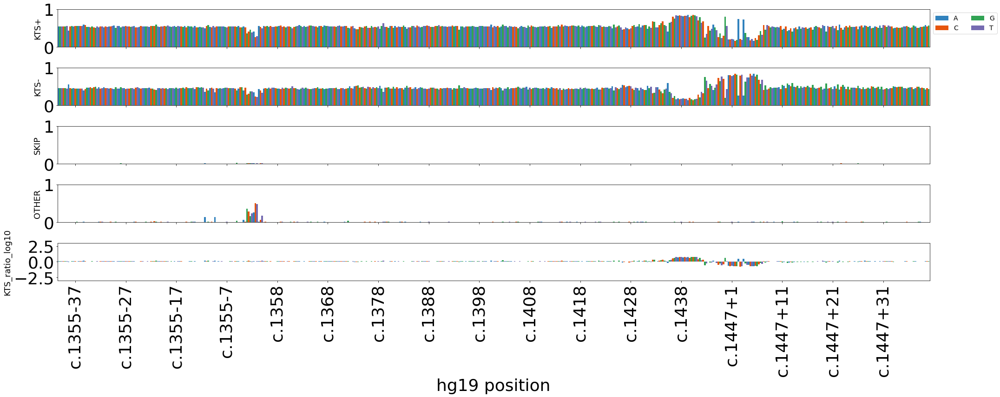

BB_RT_1_ODT_335_Cos1053


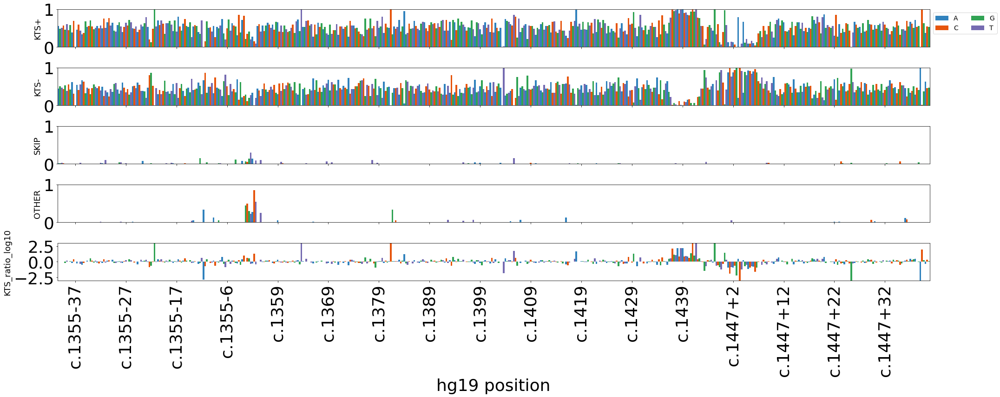

BB_RT_1_ODT_335_Hek1053


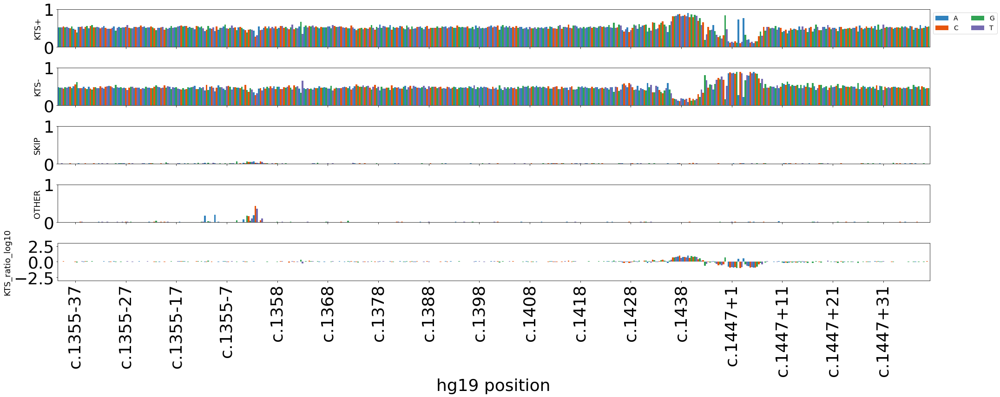

BB_RT_2_340_243_Cos1054


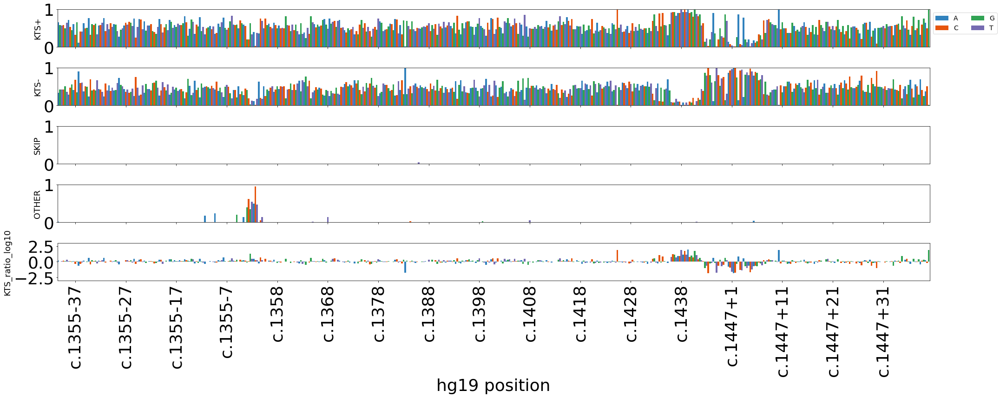

BB_RT_2_340_243_Hek1054


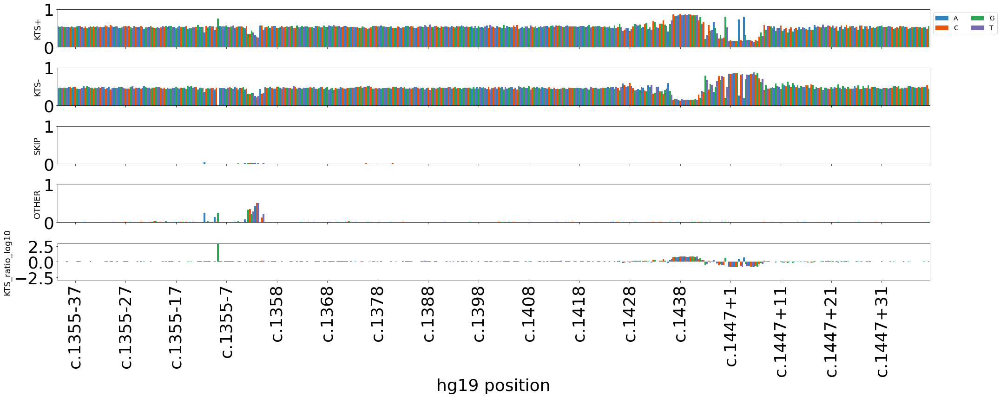

BB_RT_2_340_335_Cos1054


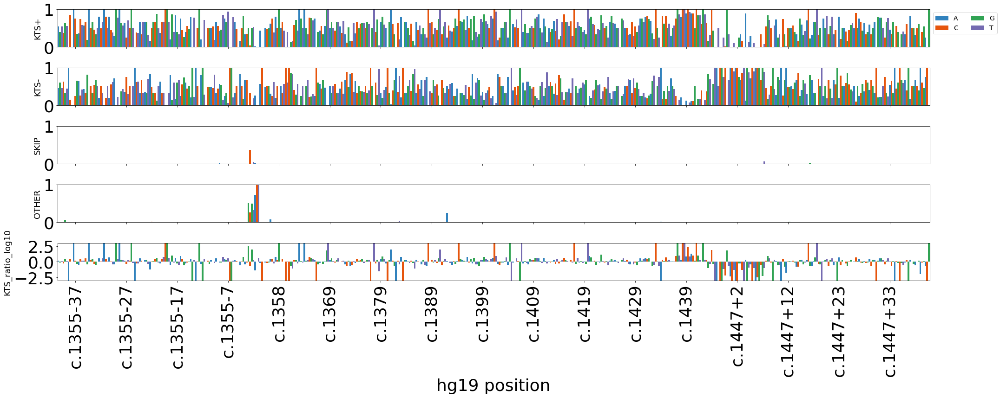

BB_RT_2_340_335_Hek1054


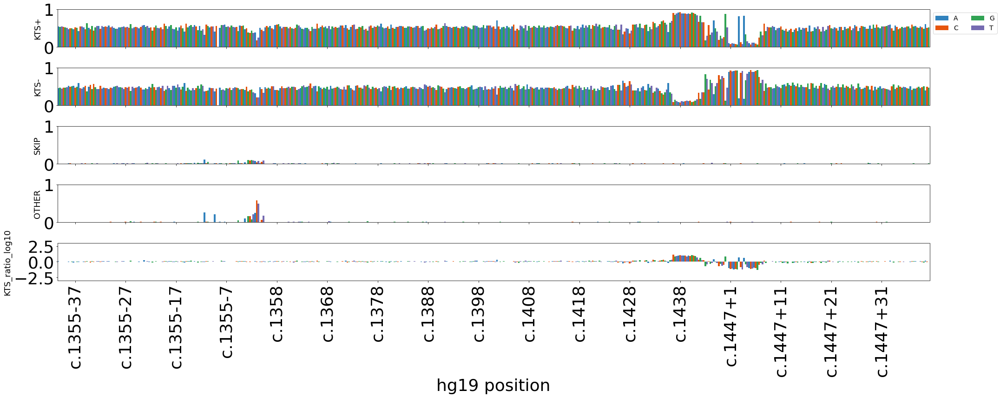

BB_RT_2_ODT_243_Cos1054


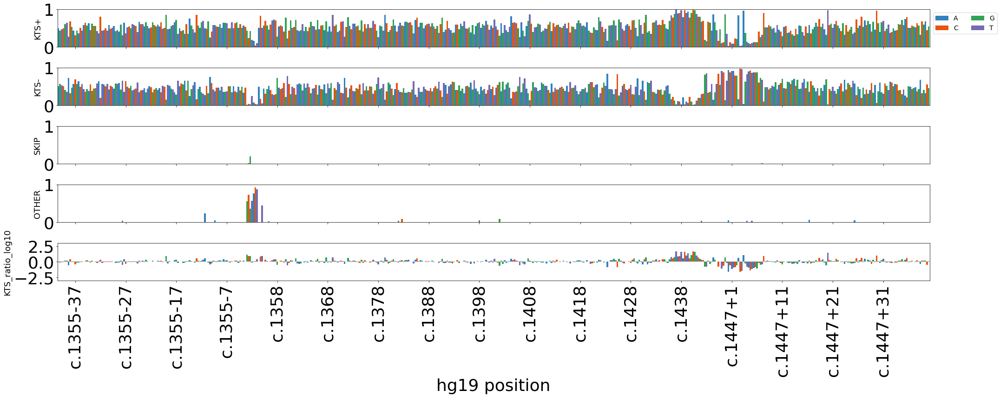

BB_RT_2_ODT_243_Hek1054


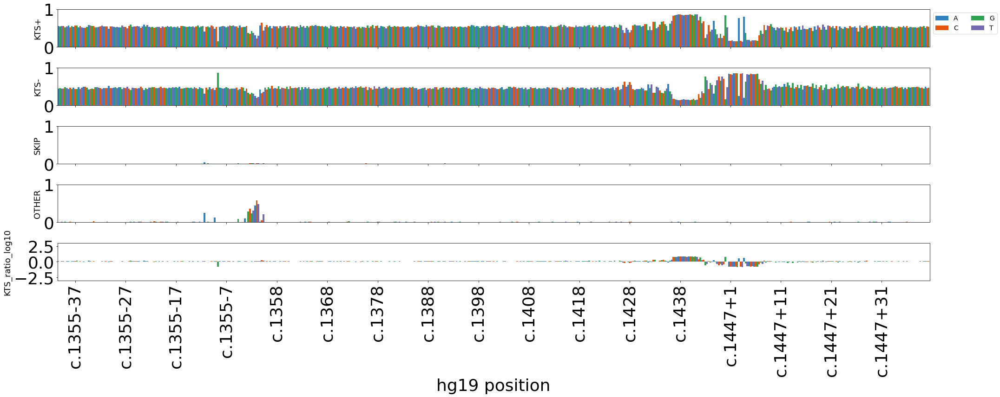

BB_RT_2_ODT_335_Hek1054


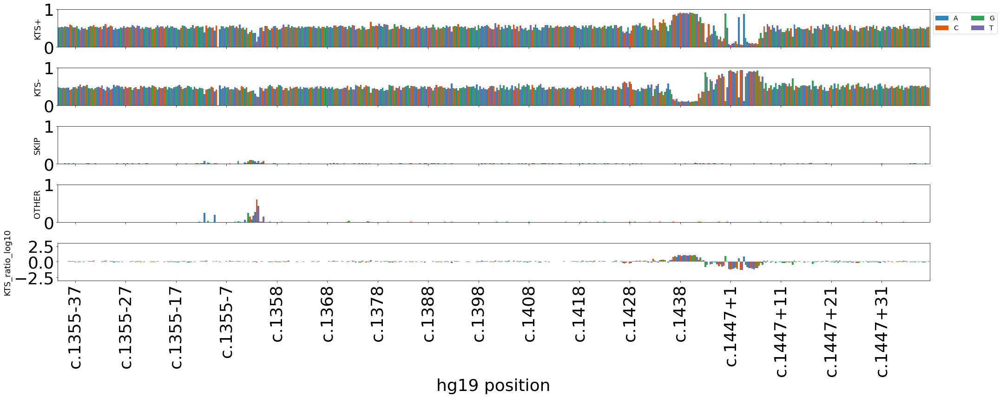

BB_RT_3_340_243_Cos1055


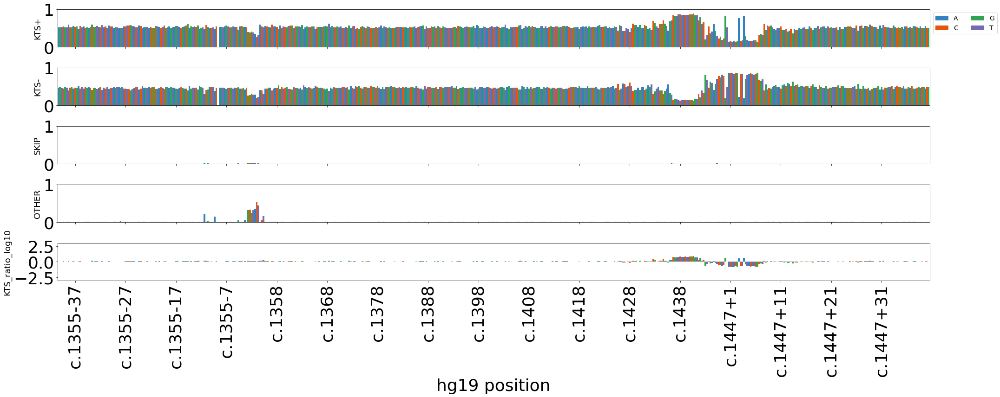

BB_RT_3_340_243_Hek1055


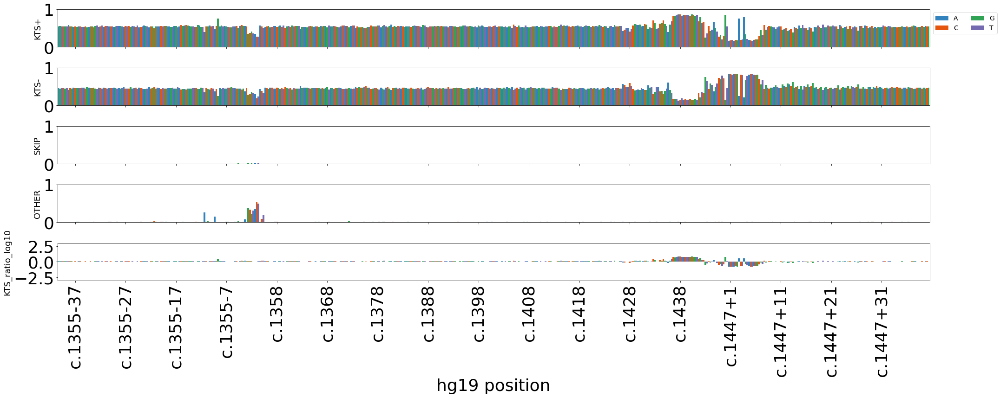

BB_RT_3_340_335_Cos1055


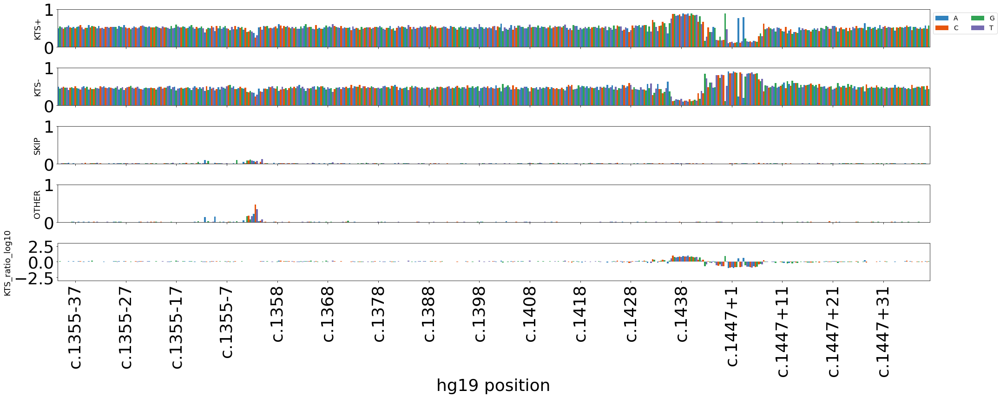

BB_RT_3_340_335_Hek1055


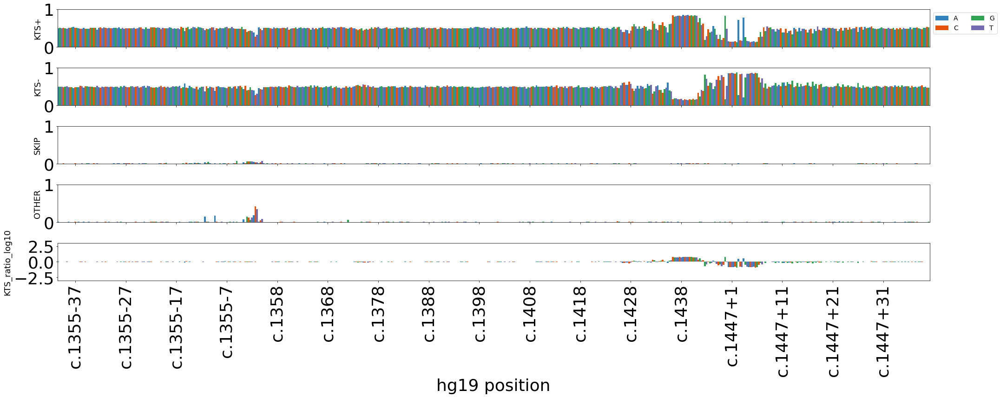

BB_RT_3_ODT_243_Cos1055


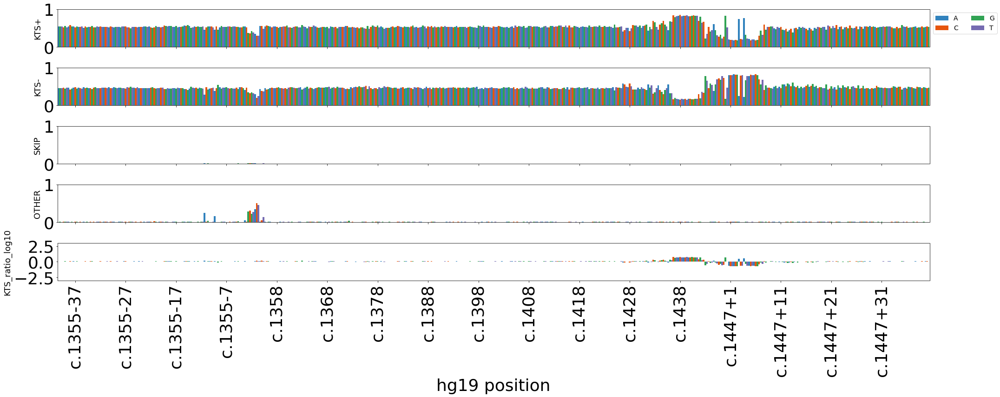

BB_RT_3_ODT_243_Hek1055


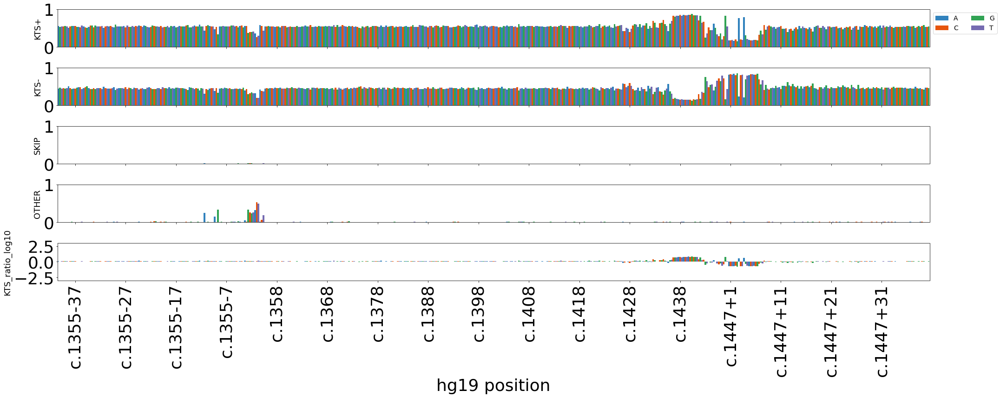

BB_RT_3_ODT_335_cos1055


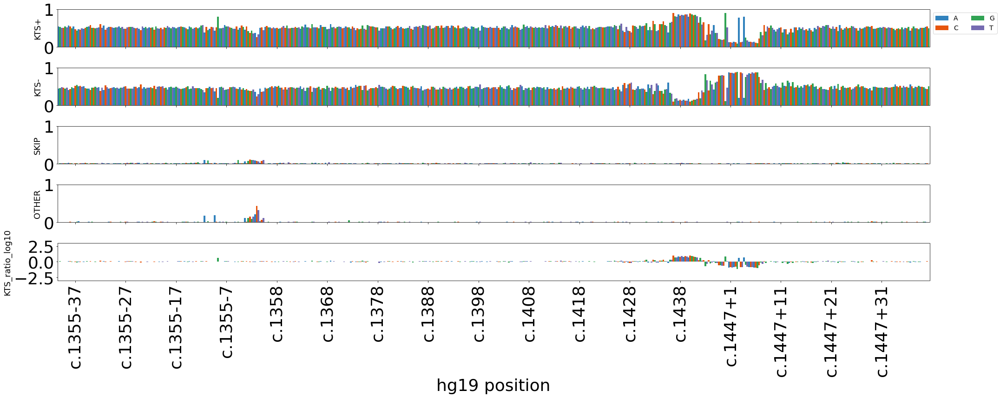

BB_RT_3_ODT_335_Hek1055


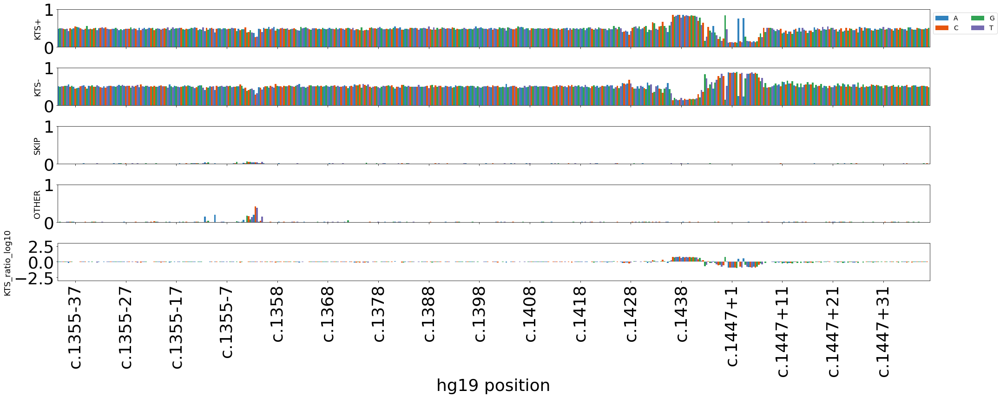

BB_RT_2_ODT_335_Cos1054


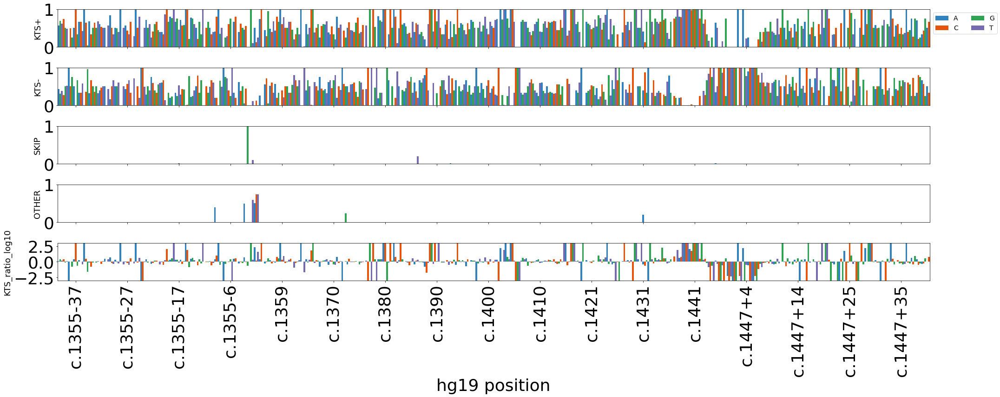

/home/smithcat/splfxseq/splanl/plots.py:2882: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  ax.set_xlim( ( -.5, len( tbv ) - .5 ) )
No handles with labels found to put in legend.


nan


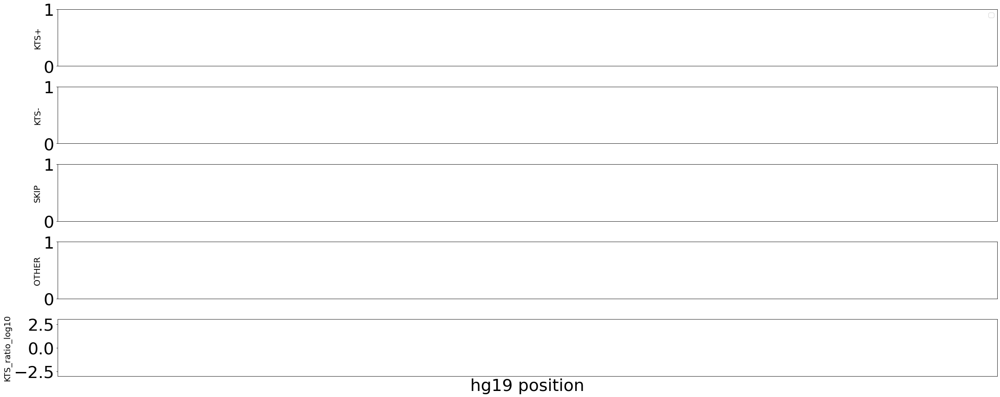

In [159]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.sat_subplots_wrapper( byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                         'ref': 'r',
                                                                                                                                          'alt_c': 'alt',
                                                                                                                                         'ref_c': 'ref' } ),
                         [ col for col in byvartbl_sat if col.startswith( 'mean_' ) ] + [ 'KTS_+_ratio_log10' ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 12 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -3, 3 ) ],
                          y_ax_title = [ col[ 5: ] for col in byvartbl_sat if col.startswith( 'mean_' ) ] + [ 'KTS_ratio_log10' ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [160]:
byvartbl_wide = mbcs.combine_rep_pervartbls_wide( [ byvartbl_long.loc[ byvartbl_long[ 'sample' ] == samp ][ [ col for col in byvartbl_long if col != 'sample' and col != 'rep' ] ]
                                                    for samp in byvartbl_long[ 'sample' ].unique() ],
                                                  [ samp for samp in byvartbl_long[ 'sample' ].unique() ],
                                                  indexcols=[ 'chrom','pos','ref','ref_c','alt','alt_c','varlist','hg19_pos','hgvs_pos','exon_num' ], 
                                                  group_cols_by_samp = True )

In [161]:
byvartbl_wide = byvartbl_wide.loc[ byvartbl_wide.pos >= 1227 ].copy()

In [162]:
byvartbl_wide

,chrom,pos,ref,ref_c,alt,alt_c,varlist,hg19_pos,hgvs_pos,exon_num,...,BB_RT_2_ODT_335_Cos1054_per_usable_reads,BB_RT_2_ODT_335_Hek1054_per_usable_reads,BB_RT_3_340_243_Cos1055_per_usable_reads,BB_RT_3_340_243_Hek1055_per_usable_reads,BB_RT_3_340_335_Cos1055_per_usable_reads,BB_RT_3_340_335_Hek1055_per_usable_reads,BB_RT_3_ODT_243_Cos1055_per_usable_reads,BB_RT_3_ODT_243_Hek1055_per_usable_reads,BB_RT_3_ODT_335_cos1055_per_usable_reads,BB_RT_3_ODT_335_Hek1055_per_usable_reads
146,jkp815,1227,G,C,A,T,jkp815:1227:C:T,32413650,c.1355-40,9,...,100.000000,99.787786,99.277978,99.464535,99.668874,99.555504,99.052632,99.458390,99.503229,99.195330
147,jkp815,1227,G,C,C,G,jkp815:1227:C:G,32413650,c.1355-40,9,...,99.915683,97.256011,99.578567,99.464899,99.648000,99.448674,99.210328,99.226482,99.173980,99.242674
148,jkp815,1227,G,C,T,A,jkp815:1227:C:A,32413650,c.1355-40,9,...,100.000000,99.528450,99.598841,99.489191,98.220245,99.423333,99.271103,99.456733,99.660389,99.673892
149,jkp815,1228,T,A,A,T,jkp815:1228:A:T,32413649,c.1355-39,9,...,100.000000,99.670511,99.490986,99.349467,99.737791,99.508151,99.103579,99.529120,99.633220,99.504950
150,jkp815,1228,T,A,C,G,jkp815:1228:A:G,32413649,c.1355-39,9,...,100.000000,99.496568,99.195024,99.427559,99.616368,99.301959,99.174897,99.413948,99.896907,99.103787
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660,jkp815,1398,A,T,G,C,jkp815:1398:T:C,32413479,c.1447+39,9,...,100.000000,99.744572,99.271592,99.217051,100.000000,99.641062,99.145934,99.419954,99.597855,99.458972
661,jkp815,1398,A,T,T,A,jkp815:1398:T:A,32413479,c.1447+39,9,...,100.000000,99.748428,99.866310,99.167438,99.781659,99.534523,99.421965,99.605782,100.000000,99.715370
662,jkp815,1399,A,T,C,G,jkp815:1399:T:G,32413478,c.1447+40,9,...,NaN,99.796748,99.647887,99.342105,99.697885,99.747475,99.380037,99.261603,95.023697,99.337748
663,jkp815,1399,A,T,G,C,jkp815:1399:T:C,32413478,c.1447+40,9,...,100.000000,99.736842,98.626374,99.347116,100.000000,99.818512,99.387130,99.381762,100.000000,100.000000


In [163]:
def create_variables_across_samples( wide_tbl,
                                     lsampnames,
                                     median_cols = [],
                                     mean_cols = [],
                                     sum_cols = [],
                                     max_cols = [] ):
    
    #NOW ADDED TO MBCS!!!!

    wide = wide_tbl.copy()

    if median_cols:

        for col in median_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_med' ] = wide[ samp_cols ].median( axis = 1 )

    if mean_cols:

        for col in mean_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_mean' ] = wide[ samp_cols ].mean( axis = 1 )

    if sum_cols:

        for col in sum_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_sum' ] = wide[ samp_cols ].sum( axis = 1 )

    if max_cols:

        for col in max_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_max' ] = wide[ samp_cols ].max( axis = 1 )

    return wide

In [164]:
byvartbl_wide = create_variables_across_samples( byvartbl_wide,
                                                 [ samp for samp in byvartbl_long[ 'sample' ].unique() ],
                                                 mean_cols = [ 'n_bc','n_bc_passfilt', 'sum_reads','sum_reads_passfilt', ],
                                                 median_cols = [ 'n_bc','n_bc_passfilt', 'sum_reads','sum_reads_passfilt', ],
                                                 sum_cols = [ 'sum_reads','sum_reads_passfilt', ],
                                                 max_cols = [ 'n_bc','n_bc_passfilt', 'sum_reads','sum_reads_passfilt', ] )

In [165]:
def compute_bc_weighted_psi( wide_tbl,
                             lsampnames,
                             isonames,
                             bccount,
                              ):
    
    #NOW ADDED TO MBCS!!!!

    wide = wide_tbl.copy()

    samp_bc_cols = [ '_'.join( [ samp, bccount ] ) for samp in lsampnames ]

    for col in isonames:
        
        #we tend to use the wmean more often so this is intentionally a mean of the wmeans
        wide[ 'mean_' + col ] = wide[ [ '_'.join( [ samp, 'wmean', col ] ) for samp in lsampnames ] ].mean( axis = 1 )
        
        wide[ 'wmean_' + col ] = pd.DataFrame( ( wide[ '_'.join( [ samp, 'wmean', col ] ) ] * wide[ '_'.join( [ samp, bccount ] ) ] 
                                                   for samp in lsampnames ) ).T.sum( axis = 1) \
                                             / wide[ samp_bc_cols ].sum( axis = 1 )

    return wide

In [166]:
byvartbl_wide = compute_bc_weighted_psi( byvartbl_wide,
                                         [ samp for samp in byvartbl_long[ 'sample' ].unique() ],
                                         [ 'KTS+','KTS-','SKIP','OTHER' ],
                                         'n_bc_passfilt',
                              )

In [167]:
byvartbl_wide[ 'KTS_+_ratio' ] = byvartbl_wide[ 'wmean_KTS+' ] / byvartbl_wide[ 'wmean_KTS-' ]

In [168]:
byvartbl_wide[ 'KTS_+_ratio' ].min()

0.13954635584191735

In [169]:
byvartbl_wide[ 'KTS_+_ratio' ].max()

6.998849391695265

In [170]:
byvartbl_wide[ 'KTS_+_ratio_log10' ] = np.log10( byvartbl_wide[ 'KTS_+_ratio' ] )

In [171]:
byvartbl_wide[ 'KTS_+_ratio_log10' ].min()

-0.855281500332004

In [172]:
byvartbl_wide[ 'KTS_+_ratio_log10' ].max()

0.8450266480269982

In [173]:
byvartbl_wide_sat = pp.saturate_variants( byvartbl_wide,
                                         chr11_seq,
                                         'hg19_pos',
                                          'exon_num',
                                          rev_strand = True )[ 9 ]

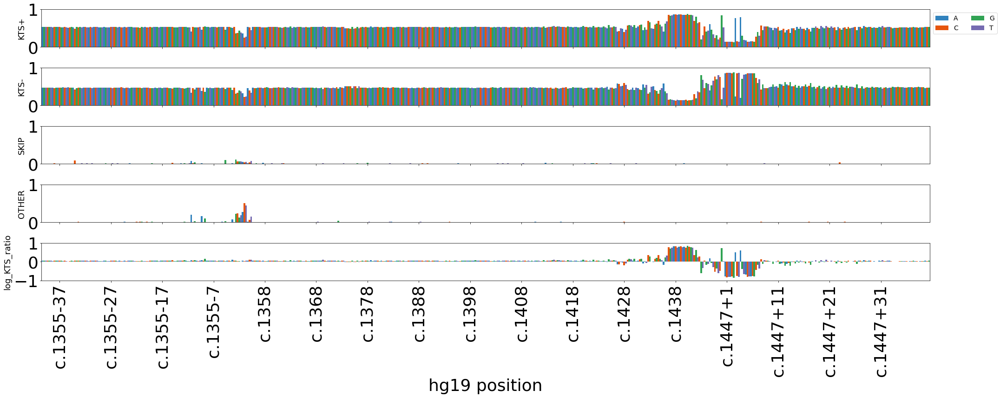

In [174]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                         [ col for col in byvartbl_wide_sat if col.startswith( 'wmean_' ) ] + [ 'KTS_+_ratio_log10' ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 12 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -1, 1 ) ],
                          y_ax_title = [ col[ 5: ] for col in byvartbl_wide_sat if col.startswith( 'mean_' ) ] + [ 'log_KTS_ratio' ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

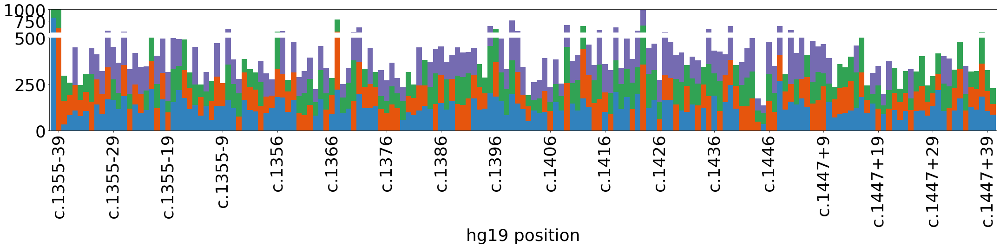

In [175]:
sp.split_ax_bcs(  byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                  [ 'n_bc_passfilt_mean' ],
                  'hgvs_pos',
                    [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                    [ ( 500.5, 1000 ), ( 0, 500 ) ],
                    fig_size = ( 30, 7.5 ),
                    legend = False,
                    hratios = [ 1, 4 ],
                    x_ax_title = 'hg19 position',
                    #tight = False,
                    #savefile = plot_out + 'bcs_filt_by_pos_split.pdf'
                           )

In [176]:
#this was computed in jkp1053_byiso.2022-0428
splai = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/splai_output/wt1_ex9.txt',
                       dtype = { 'chrom': object } )

In [177]:
byvartbl_wide[ 'chrom' ] = '11'

In [178]:
byvartbl_wide = sm.merge_splai( byvartbl_wide,
                                splai )

In [179]:
#this was computed in jkp1053_byiso.2022-0428
splai_wt = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/splai_output/wt1_ex9_wt_ss_probs.txt',
                       dtype = { 'chrom': object } ).rename( columns = { 'wt_acc_pr': 'splai_wt_acc', 'wt_don_pr': 'splai_wt_don', 'pos': 'hg19_pos' } )

In [180]:
byvartbl_wide = byvartbl_wide.set_index( [ 'hg19_pos', 'ref', 'chrom' ] ).merge( splai_wt.set_index( [ 'hg19_pos', 'ref', 'chrom' ] ),
                                                                        how = 'left', 
                                                                        left_index = True,
                                                                        right_index = True ).reset_index()

In [181]:
#this was computed in jkp1053_byiso.2022-0428
splai_ss_pr = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/splai_output/wt1_ex9_ss_probs.txt',
                             dtype = { 'chrom': object } )

In [182]:
byvartbl_wide = sm.merge_splai( byvartbl_wide,
                                splai_ss_pr )

In [183]:
maxent_wt = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/maxent_scores/wt1_ex9_wt_ss_probs.txt' ).rename( columns = { 'wt_acc_pr': 'maxent_wt_acc', 'wt_don_pr': 'maxent_wt_don' } )

In [184]:
byvartbl_wide = byvartbl_wide.set_index( [ 'pos', 'ref' ] ).merge( maxent_wt.set_index( [ 'pos', 'ref' ] ),
                                                                   how = 'left',
                                                                   left_index = True,
                                                                   right_index = True ).reset_index()

In [185]:
def maxent_score_donors( refseq,
                         tbl_by_var,
                         pos_col,
                         ref_col,
                         alt_col,
                         donor_pos_l,
                         rev_strand = False ):
    
    #NOW in score_motifs!
    
    tbv = tbl_by_var.copy()
    
    if not rev_strand:
        
        m_pos = { pos: ( pos - 1 - 2, pos - 1 + 7 ) for pos in donor_pos_l }
        
    else:
        
        m_pos = { pos: ( pos - 1 - 6, pos - 1 + 3 ) for pos in donor_pos_l }
    
    maxent_scores = { pos: [] for pos in donor_pos_l }
    
    for dpos in donor_pos_l:
    
        for p,ra in zip( tbv[ pos_col ], zip( tbv[ ref_col ], tbv[ alt_col ] ) ): 
                
            p = p - 1
            ref,alt = ra
            
            if p < m_pos[ dpos ][ 0 ] or p >= m_pos[ dpos ][ 1 ]:
                    
                maxent_scores[ dpos ].append( np.nan )
                    
            else:
                
                if not rev_strand:
                    
                    assert ref.upper() == refseq[ p ].upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )  
                    maxent_scores[ dpos ].append( maxent.score5( refseq[ m_pos[ dpos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ dpos ][ 1 ] ] ) )
                    
                else:
                    
                    assert ref.upper() == css.rev_complement( refseq[ p ] ).upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )
                    maxent_scores[ dpos ].append( maxent.score5( css.rev_complement( refseq[ m_pos[ dpos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ dpos ][ 1 ] ] ) ) )
                    
    return maxent_scores

In [186]:
donor_d = maxent_score_donors( refseq,
                                byvartbl_wide,
                                'pos',
                                'ref_c',
                                'alt_c',
                                [ 1350, 1359 ],
                               )

In [187]:
byvartbl_wide[ 'maxent_KTS+' ] = donor_d[ 1359 ]

In [188]:
byvartbl_wide[ 'maxent_KTS-' ] = donor_d[ 1350 ]

In [189]:
def maxent_score_acceptors( refseq,
                            tbl_by_var,
                            pos_col,
                            ref_col,
                            alt_col,
                            acceptor_pos_l,
                            rev_strand = False ):
    
    #NOW in score_motifs!
    
    tbv = tbl_by_var.copy()
    
    if not rev_strand:
        
        m_pos = { pos: ( pos - 1 - 20, pos - 1 + 3 ) for pos in acceptor_pos_l }
        
    else:
        
        m_pos = { pos: ( pos - 1 - 2, pos - 1 + 21 ) for pos in acceptor_pos_l }
    
    maxent_scores = { pos: [] for pos in acceptor_pos_l }
    
    for apos in acceptor_pos_l:
    
        for p,ra in zip( tbv[ pos_col ], zip( tbv[ ref_col ], tbv[ alt_col ] ) ): 
                
            p = p - 1
            ref,alt = ra
            
            if p < m_pos[ apos ][ 0 ] or p >= m_pos[ apos ][ 1 ]:
                    
                maxent_scores[ apos ].append( np.nan )
                    
            else:
                
                if not rev_strand:
                    
                    assert ref.upper() == refseq[ p ].upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )  
                    maxent_scores[ apos ].append( maxent.score3( refseq[ m_pos[ apos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ apos ][ 1 ] ] ) )
                    
                else:
                    
                    assert ref.upper() == css.rev_complement( refseq[ p ] ).upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )
                    maxent_scores[ apos ].append( maxent.score3( css.rev_complement( refseq[ m_pos[ apos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ apos ][ 1 ] ] ) ) )
                    
    return maxent_scores

In [190]:
accept_d = maxent_score_acceptors( refseq,
                                    byvartbl_wide,
                                    'pos',
                                    'ref_c',
                                    'alt_c',
                                    [ 1267, 1284 ],
                                   )

In [191]:
byvartbl_wide[ 'maxent_acc' ] = accept_d[ 1267 ]

In [192]:
byvartbl_wide[ 'maxent_alt_acc' ] = accept_d[ 1284 ]

In [193]:
byvartbl_wide[ 'splai_KTS+_ratio' ] = byvartbl_wide[ 'ss_don_prob_32413518' ] / byvartbl_wide[ 'ss_don_prob_32413527' ]

In [194]:
byvartbl_wide[ 'splai_KTS+_ratio' ].min()

2.1226874089724788e-05

In [195]:
byvartbl_wide[ 'splai_KTS+_ratio' ].max()

170232.52949963024

In [196]:
byvartbl_wide[ 'splai_KTS+_ratio_log10' ] = np.log10( byvartbl_wide[ 'splai_KTS+_ratio' ] )

In [197]:
byvartbl_wide[ 'splai_KTS+_ratio_log10' ].min()

-4.673113956165485

In [198]:
byvartbl_wide[ 'splai_KTS+_ratio_log10' ].max()

5.2310425524131485

In [199]:
byvartbl_wide_sat = pp.saturate_variants( byvartbl_wide,
                                         chr11_seq,
                                         'hg19_pos',
                                          'exon_num',
                                          rev_strand = True )[ 9 ]

In [200]:
plot_cols = [ col for col in byvartbl_wide if col.startswith( 'wmean_' ) or col.startswith( 'maxent_' )  ] + [ 'DS_maxm', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'ss_acc_prob_32413610', 'ss_acc_prob_32413593' ]

In [201]:
plot_cols = [ 'wmean_KTS+', 'wmean_KTS-', 'wmean_SKIP', 'wmean_OTHER', 'KTS_+_ratio_log10', 'maxent_KTS+', 'maxent_KTS-',
              'maxent_acc', 'maxent_alt_acc',  'DS_maxm', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'ss_acc_prob_32413610',
              'ss_acc_prob_32413593', 'splai_KTS+_ratio_log10' ]

In [202]:
plot_cols

['wmean_KTS+',
 'wmean_KTS-',
 'wmean_SKIP',
 'wmean_OTHER',
 'KTS_+_ratio_log10',
 'maxent_KTS+',
 'maxent_KTS-',
 'maxent_acc',
 'maxent_alt_acc',
 'DS_maxm',
 'ss_don_prob_32413518',
 'ss_don_prob_32413527',
 'ss_acc_prob_32413610',
 'ss_acc_prob_32413593',
 'splai_KTS+_ratio_log10']

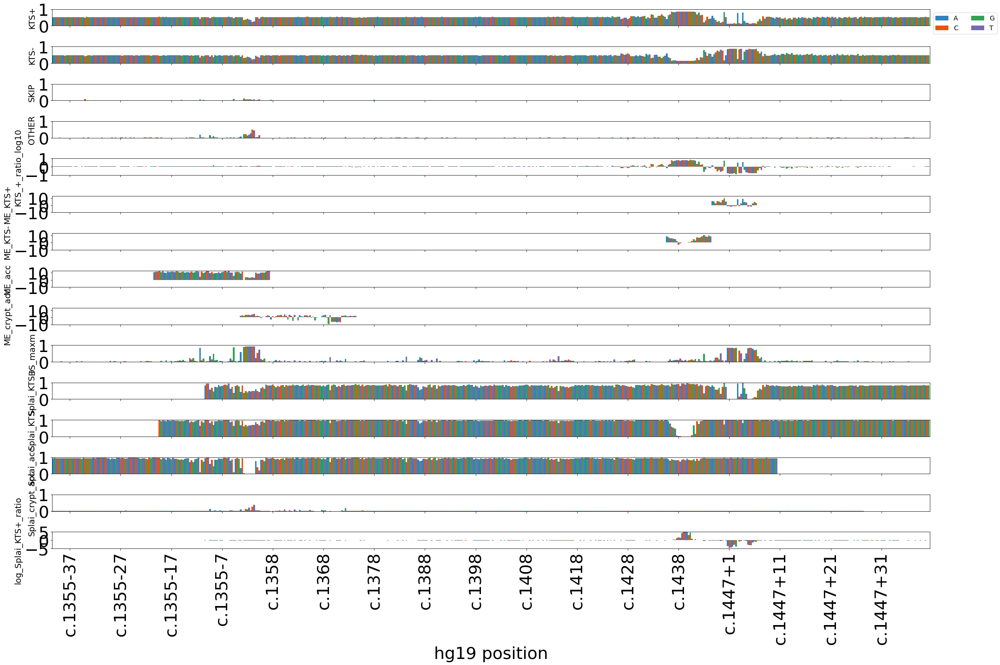

In [203]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ), ( -10, 13 ), ( -10, 13 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','SKIP','OTHER', 'KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','ME_acc','ME_crypt_acc','DS_maxm','Splai_KTS+','Splai_KTS-','Splai_acc', 'Splai_crypt_acc', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [204]:
plot_KTS_cols = [ 'wmean_KTS+', 'wmean_KTS-', 'KTS_+_ratio_log10', 'maxent_KTS+', 'maxent_KTS-', 
                  'DS_maxm', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'splai_KTS+_ratio_log10' ]

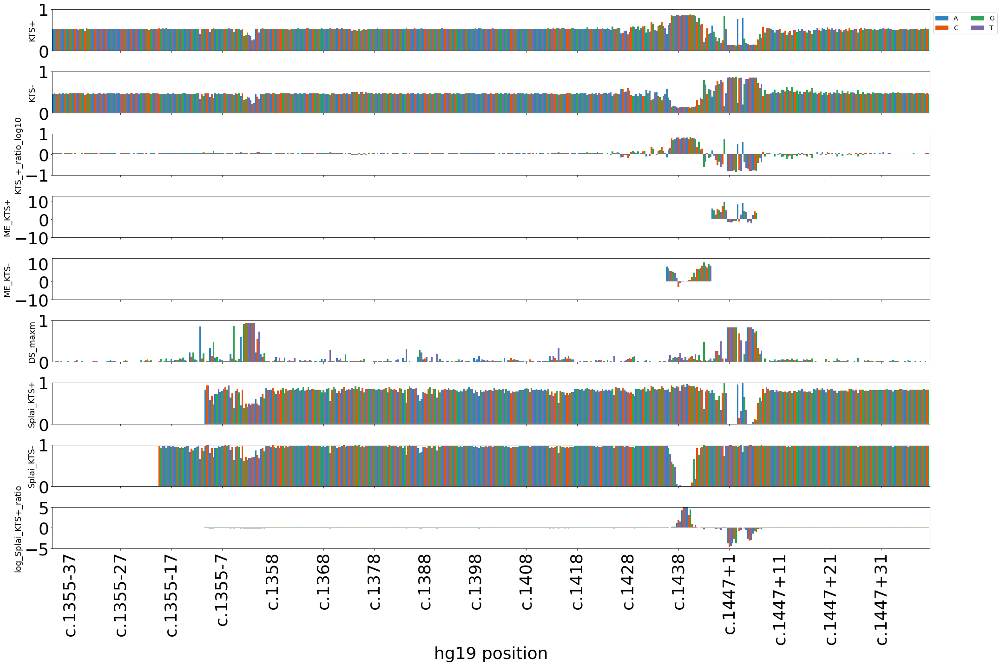

In [205]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_KTS_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ),  ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','DS_maxm','Splai_KTS+','Splai_KTS-', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [206]:
plot_acc_cols = [ 'wmean_KTS+', 'wmean_KTS-', 'wmean_SKIP', 'wmean_OTHER', 'KTS_+_ratio_log10', 
              'maxent_acc', 'maxent_alt_acc',  'DS_maxm','ss_acc_prob_32413610',
              'ss_acc_prob_32413593', 'splai_KTS+_ratio_log10' ]

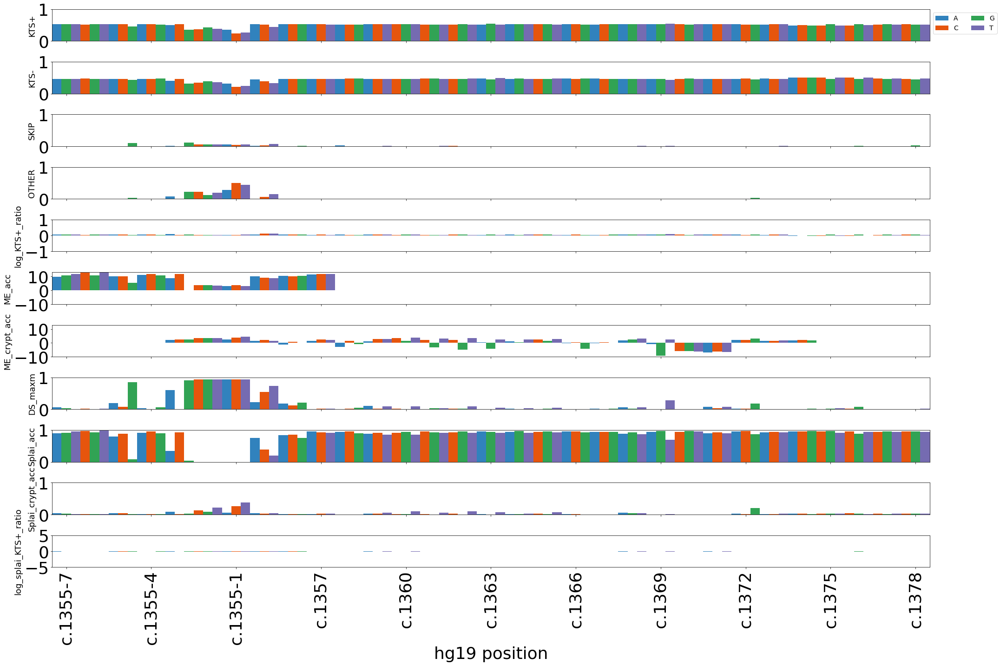

In [207]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_acc_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          zoom = ( 1260, 1290 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ),( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','SKIP','OTHER','log_KTS+_ratio','ME_acc','ME_crypt_acc','DS_maxm','Splai_acc', 'Splai_crypt_acc', 'log_splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 3,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [208]:
byvartbl_long.loc[ ( ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ) & ( byvartbl_long[ 'wmean_KTS+' ] > .6 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'n_bc_passfilt', 'wmean_KTS+' ] ]

,pos,ref,alt,sample,n_bc_passfilt,wmean_KTS+
714,1265,T,A,BB_test_Cos1053_JKLab0340_MM2B,5,0.610067
3607,1265,T,C,BB_RT_1_340_335_Cos1053,14,0.655000
9601,1265,T,C,BB_RT_2_340_243_Cos1054,5,0.613003
10744,1265,T,C,BB_RT_2_340_335_Cos1054,2,0.669014
13030,1265,T,C,BB_RT_2_ODT_335_Cos1054,1,1.000000


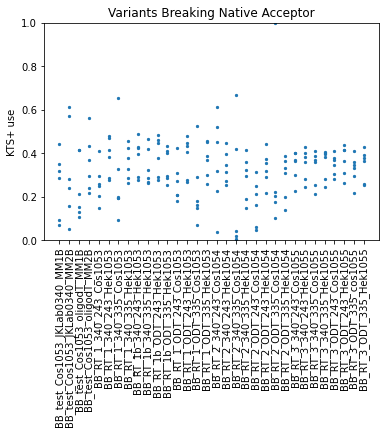

In [209]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'wmean_KTS+' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS+ use')

plt.title( 'Variants Breaking Native Acceptor')

plt.show()

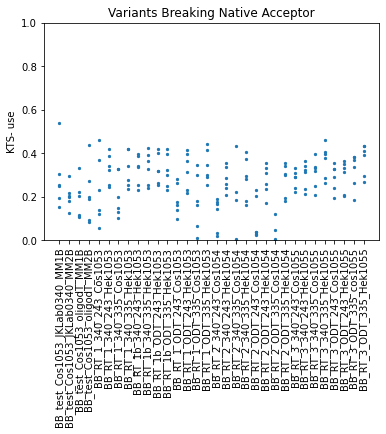

In [210]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'wmean_KTS-' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS- use')

plt.title( 'Variants Breaking Native Acceptor')

plt.show()

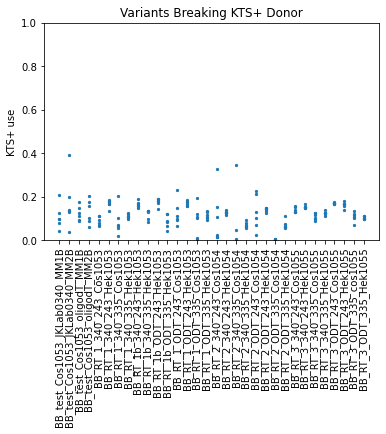

In [211]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1360 ) | ( byvartbl_long.pos == 1361 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1360 ) | ( byvartbl_long.pos == 1361 ) ][ 'wmean_KTS+' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS+ use')

plt.title( 'Variants Breaking KTS+ Donor')

plt.show()

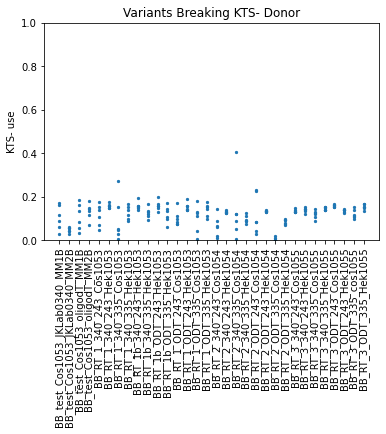

In [212]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1351 ) | ( byvartbl_long.pos == 1352 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1351 ) | ( byvartbl_long.pos == 1352 ) ][ 'wmean_KTS-' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS- use')

plt.title( 'Variants Breaking KTS- Donor')

plt.show()

In [213]:
coll_bc_samps2 = [ ( 'jkp815:1266:G:T', 'BB_RT_1_340_243_Hek1053' ),
                  ( 'jkp815:1265:A:C', 'BB_RT_1_ODT_243_Hek1053' ),
                  ( 'jkp815:1265:A:G', 'BB_RT_1_340_335_Cos1053' ),
                  ]

In [214]:
view_bc_fn2 = { lib: { samp: [] for var,samp in coll_bc_samps2 if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

In [215]:
view_bc_fn2

{'JKP1053': {'BB_RT_1_340_243_Hek1053': [],
  'BB_RT_1_ODT_243_Hek1053': [],
  'BB_RT_1_340_335_Cos1053': []},
 'JKP1054': {},
 'JKP1055': {}}

In [216]:
bybc_tbl_fn[ 'JKP1053' ]

,barcode,sample,passes,status,n_variants_passing,variant_list,num_reads,secondary_reads,unpaired_reads,unmapped_reads,...,other_isoform,usable_reads,KTS+,KTS-,SKIP,OTHER,KTS+_psi,KTS-_psi,SKIP_psi,OTHER_psi
14,AAAAATACTTTGATGCGGGATGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1236:G:C,214,0,0,0,...,0,214,205,6,0,3,0.957944,0.028037,0.0,0.014019
32,AAAACGCCTGTCTACCATAATGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1381:T:A,69,0,0,0,...,0,68,65,3,0,0,0.955882,0.044118,0.0,0.000000
44,AAAAGCGCAGTATTGGTCACTGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1312:G:A,131,0,0,0,...,0,131,1,130,0,0,0.007634,0.992366,0.0,0.000000
49,AAAAGGTGTTGGGCAGTTGATGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1267:GTG:GG,39,0,0,0,...,0,39,7,3,0,29,0.179487,0.076923,0.0,0.743590
56,AAAAGTATAAACGGGTTTGTTGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1305:T:G,60,0,0,0,...,1,60,54,5,0,0,0.900000,0.083333,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2930887,TTTTTTTTCTGCGTACAACGTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1328:G:A,6,0,0,0,...,0,6,3,3,0,0,0.500000,0.500000,0.0,0.000000
2930891,TTTTTTTTGATTTGCGGTCGTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1301:A:T,2,0,0,0,...,0,2,2,0,0,0,1.000000,0.000000,0.0,0.000000
2930892,TTTTTTTTGCGACTGGAACTTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1380:A:C,2,0,0,0,...,0,2,2,0,0,0,1.000000,0.000000,0.0,0.000000
2930897,TTTTTTTTGTTCATACTTGTTTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1228:A:G,3,0,0,0,...,0,3,3,0,0,0,1.000000,0.000000,0.0,0.000000


In [217]:
satbl_fn[ 'JKP1053' ]

,passes,status,n_variants_passing,variant_list
readgroupid,,,,
AAAAAAAATCACGACCCTCCTGG,False,possible_chimeric_no_major_variant,6,"jkp815:1225:CACAT:CC,jkp815:1231:GTTAG:GTAG,jk..."
AAAAAAAGGGCTTCCGGGTATGG,True,no_variants_input,0,NaN
AAAAAAAGGGTTCCAGACTGTGG,False,toomanymajorvar,2,"jkp815:1252:T:G,jkp815:1279:TCCAGTGTAAAACTTGTC..."
AAAAAAAGTAGTCTGGTGTGTGG,True,pass,1,jkp815:1387:T:C
AAAAAAATACCCCGGATGATTGG,False,possible_chimeric_no_major_variant,1,jkp815:1392:T:A
...,...,...,...,...
TTTTTTTTTTATAGTCCTACTGG,False,possible_chimeric_no_major_variant,3,"jkp815:1227:C:G,jkp815:1228:A:T,jkp815:1374:C:T"
TTTTTTTTTTGGTTGGCGTTTGG,False,possible_chimeric_no_major_variant,1,jkp815:1285:G:T
TTTTTTTTTTGTACTTTTCTGG,False,possible_chimeric_no_major_variant,1,jkp815:1397:T:G


In [218]:
for lib in view_bc_fn2:
    
    for samp in view_bc_fn2[ lib ]:
        
        if len( view_bc_fn2[ lib ][ samp ] ) > 1:
            
            view_bc_fn2[ lib ][ samp ] = pd.concat( view_bc_fn2[ lib ][ samp ] )
            view_bc_fn2[ lib ][ samp ] = view_bc_fn2[ lib ][ samp ].rename( columns = { 'barcode': 'readgroupid' } )
            
        else:
            
            view_bc_fn2[ lib ][ samp ] = view_bc_fn2[ lib ][ samp ][ 0 ].rename( columns = { 'barcode': 'readgroupid' } )            
       

IndexError: list index out of range

In [ ]:
view_bc_fn2

In [ ]:
! mkdir /nfs/kitzman2/smithcat/proj/wt1_2022/20220512_accept_vars/

In [ ]:
bc_out2 = '/nfs/kitzman2/smithcat/proj/wt1_2022/20220512_accept_vars/' 

In [ ]:
for lib in view_bc_fn2:
    
    for samp in view_bc_fn2[ lib ]:
    
        view_bc_fn2[ lib ][ samp ].to_csv( bc_out2 + '%s_%s_acceptor_vars.txt' % ( lib, samp ),
                                          sep = '\t',
                                          index = False )

In [ ]:
view_bc_fn2 = { lib: { samp: [] for var,samp in coll_bc_samps2 if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

for lib in bybc_tbl_fn:
    
    for var,samp in coll_bc_samps2:
        
        if lib.replace( 'JKP', '' ) not in samp:
            continue
        
        print( var,samp )
        
        if len( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ] ) == 0:
                
                print( 'No rows selected!' )
            
        view_bc_fn2[ lib ][ samp ].append( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ].copy() ) 

In [ ]:
read_count_files = ! ls /nfs/turbo/umms-kitzmanj/oldvol2/jacob/proj/jensplice/20220426_wt1_subasm_filter_stringent/sapipe/sa/*.per_group_raw_counts.txt

In [ ]:
read_count_fn = { file.split( '/' )[ -1 ].split( '.' )[ 0 ]: pd.read_table( file ).set_index( 'readgroupid' )
                  for file in read_count_files }

In [ ]:
for lib in bybc_tbl_fn:
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].loc[ bybc_tbl_fn[ lib ].n_variants_passing == 1 ].copy()
    
    bybc_tbl_fn[ lib ][ 'pos' ] = bybc_tbl_fn[ lib ].variant_list.apply( lambda x: int( x.split( ':' )[ 1 ] ) )
    bybc_tbl_fn[ lib ][ 'ref' ] = bybc_tbl_fn[ lib ].variant_list.apply( lambda x: x.split( ':' )[ 2 ] )
    bybc_tbl_fn[ lib ][ 'alt' ] = bybc_tbl_fn[ lib ].variant_list.apply( lambda x: x.split( ':' )[ 3 ] )
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].rename( columns = { 'barcode': 'readgroupid' } ).set_index( 'readgroupid' )
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].merge( read_count_fn[ lib ],
                                                   how = 'left',
                                                   left_index = True,
                                                   right_index = True )

In [ ]:
for lib in bybc_tbl_fn:
    
    print( lib )
    
    samps = bybc_tbl_fn[ lib ][ 'sample' ].unique()
    
    fig,ax = plt.subplots( 6, 
                           len( samps ),
                           sharex = True, 
                           sharey = True,
                           figsize = ( 60, 30 ) )
    
    for idx,samp in enumerate( samps ):
        
        var = 0
        
        for pos in [ 1265, 1266 ]:
            
            for alt in [ 'A', 'C', 'G', 'T' ]:
                
                plotdf = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].pos == pos ) & ( bybc_tbl_fn[ lib ].alt == alt ) ].copy()
                
                if len( plotdf ) == 0:
                    continue
                    
                ax[ var ][ idx ].scatter( plotdf[ 'KTS+_psi' ],
                                          plotdf[ 'total_reads' ],
                                          s = 10 )
                
                ax[ var ][ idx ].set_xlim( ( -0.05, 1.05 ) )
                
                if idx == 0:
                    
                    ax[ var ][ idx ].set_ylabel( str( pos ) + ':' + alt )
                
                var += 1
                
        ax[ 0 ][ idx ].set_title( samp )
        
    plt.show()

In [ ]:
for lib in bybc_tbl_fn:
    
    print( lib )
    
    nomiss = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'KTS+_psi' ].notnull() ) & ( bybc_tbl_fn[ lib ][ 'total_reads' ].notnull() ) ].copy()
    
    nomiss = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'KTS+_psi' ] <= 1 ) & ( bybc_tbl_fn[ lib ][ 'KTS+_psi' ] >= 0 ) ].copy()
    
    #print( nomiss.loc[ nomiss[ 'KTS+_psi' ] > 1 ] )
    
    print( ss.pearsonr( nomiss[ 'KTS+_psi' ],
                        nomiss[ 'total_reads' ] ) )
    
    print( ss.spearmanr( nomiss[ 'KTS+_psi' ],
                        nomiss[ 'total_reads' ] ) )

In [ ]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_KTS_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          zoom = ( 1340, 1370 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ),  ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','DS_maxm','Splai_KTS+','Splai_KTS-', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 3,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1357 ) & ( byvartbl_wide.pos <= 1365 ) ][ 'wmean_KTS+' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1357 ) & ( byvartbl_wide.pos <= 1365 ) ][ 'maxent_KTS+' ],
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'MaxEnt KTS+' )
plt.xlabel( 'Measured PSI KTS+' )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1348 ) & ( byvartbl_wide.pos <= 1356 ) ][ 'wmean_KTS-' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1348 ) & ( byvartbl_wide.pos <= 1356 ) ][ 'maxent_KTS-' ],
              )

plt.ylabel( 'MaxEnt KTS-' )
plt.xlabel( 'Measured PSI KTS-' )

plt.xlim( ( 0, 1 ) )
plt.show()

In [ ]:
maxent_wt

In [ ]:
byvartbl_wide.loc[ byvartbl_wide.pos == 1350 ]

In [ ]:
byvartbl_wide[ 'maxent_KTS+_nomiss' ] = [ me if not np.isnan( me ) else float( maxent_wt.loc[ maxent_wt.pos == 32413518 ].	maxent_wt_don )
                                          for me in byvartbl_wide[ 'maxent_KTS+' ] ]

In [ ]:
byvartbl_wide[ 'maxent_KTS-_nomiss' ] = [ me if not np.isnan( me ) else float( maxent_wt.loc[ maxent_wt.pos == 32413527 ].	maxent_wt_don )
                                          for me in byvartbl_wide[ 'maxent_KTS-' ] ]

In [ ]:
me_model_df = byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1348 ) & ( byvartbl_wide.pos <= 1365 ) ].copy()

In [ ]:
me_model = LinearRegression().fit( me_model_df[ [ 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss' ] ],
                                   me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
me_model.score( me_model_df[ [ 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss' ] ],
                me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
me_model.coef_

In [ ]:
me_model.intercept_

In [ ]:
me_model_df[ 'me_pred_KTS_+_ratio_log10' ] = me_model.predict( me_model_df[ [ 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss' ] ] )

In [ ]:
plt.plot( np.linspace( -1, 1.5 ), 
          np.linspace( -1, 1.5 ),
          c = 'black',
          ls = '--' )

plt.scatter( me_model_df[ 'KTS_+_ratio_log10' ],
             me_model_df[ 'me_pred_KTS_+_ratio_log10' ] )

plt.xlabel( 'Measured log KTS+ ratio' )
plt.xlim( ( -1, 1.5 ) )

plt.ylabel( 'Predicted log KTS+ ratio' )
plt.ylim( ( -1, 1.5 ) )

In [ ]:
me_model_df[ 'me_error' ] = me_model_df[ 'me_pred_KTS_+_ratio_log10' ] - me_model_df[ 'KTS_+_ratio_log10' ]

In [ ]:
me_model_df[ 'me_error_sq' ] = me_model_df[ 'me_error' ]**2

In [ ]:
plt.figure( figsize = ( 10, 10 ) )

plt.scatter( me_model_df.varlist,
             me_model_df.error )

plt.xticks( rotation = 90 )

plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1247 ) & ( byvartbl_wide.pos <= 1269 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1247 ) & ( byvartbl_wide.pos <= 1269 ) ][ 'maxent_acc' ],
              )

plt.ylabel( 'MaxEnt Acc' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )

plt.xlim( ( 0, 1 ) )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1264 ) & ( byvartbl_wide.pos <= 1286 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1264 ) & ( byvartbl_wide.pos <= 1286 ) ][ 'maxent_alt_acc' ],
              )

plt.ylabel( 'MaxEnt Cryptic Acc' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )

plt.xlim( ( 0, 1 ) )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1257 ) ][ 'wmean_KTS+' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1257 ) ][ 'ss_don_prob_32413518' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI KTS+' )
plt.xlabel( 'Measured PSI KTS+' )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1248 ) ][ 'wmean_KTS-' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1248 ) ][ 'ss_don_prob_32413527' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI KTS-' )
plt.xlabel( 'Measured PSI KTS-' )
plt.show()

In [ ]:
splai_model = LinearRegression().fit( me_model_df[ [ 'ss_don_prob_32413518', 'ss_don_prob_32413527' ] ],
                                      me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
splai_model.score( me_model_df[ [ 'ss_don_prob_32413518', 'ss_don_prob_32413527' ] ],
                   me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
splai_model.coef_

In [ ]:
splai_model.intercept_

In [ ]:
me_model_df[ 'splai_pred_KTS_+_ratio_log10' ] = splai_model.predict( me_model_df[ [ 'ss_don_prob_32413518', 'ss_don_prob_32413527' ] ] )

In [ ]:
plt.plot( np.linspace( -1, 1 ), 
          np.linspace( -1, 1 ),
          c = 'black',
          ls = '--' )

plt.scatter( me_model_df[ 'KTS_+_ratio_log10' ],
             me_model_df[ 'splai_pred_KTS_+_ratio_log10' ] )

plt.xlabel( 'Measured log KTS+ ratio' )
plt.xlim( ( -1, 1 ) )

plt.ylabel( 'Predicted log KTS+ ratio' )
plt.ylim( ( -1, 1 ) )

In [ ]:
me_model_df[ 'splai_error' ] = me_model_df[ 'splai_pred_KTS_+_ratio_log10' ] - me_model_df[ 'KTS_+_ratio_log10' ]

In [ ]:
me_model_df[ 'splai_error_sq' ] = me_model_df[ 'splai_error' ]**2

In [ ]:
plt.figure( figsize = ( 10, 10 ) )

plt.scatter( me_model_df.varlist,
             me_model_df.splai_error, )

plt.xticks( rotation = 90 )

plt.show()

In [ ]:
plt.scatter( me_model_df.me_error_sq,
             me_model_df.splai_error_sq,
             )

plt.xlabel( 'MaxEnt Model Sq Residual' )
plt.ylabel( 'SplAI Model Sq Residual' )

plt.show()

In [ ]:
view_cols = [ 'pos', 'hg19_pos', 'hgvs_pos', 'ref', 'alt', 'wmean_KTS+', 'wmean_KTS-', 'KTS_+_ratio_log10', 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss', 'me_error_sq', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'splai_error_sq', 'me_pred_KTS_+_ratio_log10', 'splai_pred_KTS_+_ratio_log10' ]

In [ ]:
me_model_df.loc[ ( me_model_df.me_error_sq >= .15 ) & ( me_model_df.splai_error_sq >= .1 ) ][ view_cols ]

In [ ]:
me_model_df.loc[ ( ( me_model_df.me_error_sq <= .025 ) | ( me_model_df.splai_error_sq <= .025 ) ) & ( me_model_df[ 'KTS_+_ratio_log10' ].abs() >= .8 ) ][ view_cols ]

In [ ]:
me_model_df.loc[ ( ( me_model_df.me_error_sq <= .025 ) | ( me_model_df.splai_error_sq <= .025 ) ) & ( me_model_df[ 'KTS_+_ratio_log10' ].abs() < .8 ) & ( me_model_df[ 'KTS_+_ratio_log10' ].abs() >= .6 ) ][ view_cols ]

In [ ]:
 me_model_df.loc[ ( ( me_model_df.pos == 1362 ) | ( me_model_df.pos == 1363 ) ) & ( me_model_df.alt == 'T' ) ][ view_cols ]

In [ ]:
me_model_df.loc[ ( me_model_df.pos == 1349 ) ][ view_cols ]

In [ ]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_KTS_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          zoom = ( 1348, 1365 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ),  ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','DS_maxm','Splai_KTS+','Splai_KTS-', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 3,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ 'ss_acc_prob_32413610' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI Acceptor' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ 'ss_acc_prob_32413593' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI Cryptic Acceptor' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )
plt.show()

In [ ]:
lit_vars = pd.read_table( bdout + 'wt1_ex9_variant_lit.txt',
                          dtype = { 'GRCh37Chromosome': object,
                                    'GRCh38Chromosome': object,
                                    'Clinical significance (Last reviewed)': object } )

In [ ]:
lit_vars = lit_vars[ [ col for col in lit_vars if not col.startswith( 'Unnamed' ) ] ]

In [ ]:
lit_vars[ 'hgvs_var' ] = lit_vars.Variant.apply( lambda x: 'c.' + x.split( 'c.' )[ 1 ].strip().split( ' ' )[ 0 ] )

In [ ]:
lit_vars[ 'hgvs_pos' ] = lit_vars.hgvs_var.apply( lambda x: x.split( '>' )[ 0 ][ : -1 ] )

In [ ]:
lit_vars[ 'ref_c' ] = lit_vars.hgvs_var.apply( lambda x: x.split( '>' )[ 0 ][ -1 ] )

In [ ]:
lit_vars[ 'alt_c' ] = lit_vars.hgvs_var.apply( lambda x: x.split( '>' )[ 1 ] )

In [ ]:
lit_vars[ 'ref' ] = [ css.rev_complement( r ) for r in lit_vars.ref_c ]

In [ ]:
lit_vars[ 'alt' ] = [ css.rev_complement( a ) for a in lit_vars.alt_c ]

In [ ]:
lit_vars

In [ ]:
lit_vars.loc[ lit_vars.Source == 'ClinVar or HGMD', 'Outcome' ] = lit_vars.loc[ lit_vars.Source == 'ClinVar or HGMD' ][ 'Clinical significance (Last reviewed)' ].apply( lambda x: x.split( '(' )[ 0 ] )

In [ ]:
lit_vars.loc[ lit_vars.Source == 'HGMD_exclusive', 'Outcome' ] = 'Likely pathogenic'

In [ ]:
byvartbl_wide = byvartbl_wide.set_index( [ 'hgvs_pos', 'ref', 'alt', 'ref_c', 'alt_c' ] ).merge( lit_vars.set_index( [ 'hgvs_pos', 'ref', 'alt', 'ref_c', 'alt_c' ] ),
                                                                                                 how = 'outer',
                                                                                                left_index = True,
                                                                                                right_index = True ).reset_index()

In [ ]:
byvartbl_wide[ 'lit_var' ] = byvartbl_wide.Variant.notnull()

In [ ]:
byvartbl_wide.lit_var.sum()

In [ ]:
sns.swarmplot( x = 'Outcome', y = 'KTS_+_ratio_log10', data = byvartbl_wide, s = 4 )
plt.xticks( rotation = 90 )
sns.despine()

In [ ]:
view_cols2 = [ 'pos', 'hg19_pos', 'hgvs_pos', 'ref', 'alt', 'wmean_KTS+', 'wmean_KTS-', 'KTS_+_ratio_log10', 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss', 'ss_don_prob_32413518', 'ss_don_prob_32413527', ]

In [ ]:
byvartbl_wide.loc[ ( byvartbl_wide.lit_var ) & ( byvartbl_wide[ 'KTS_+_ratio_log10' ].abs() >= .1 ) ][ view_cols2 + [ 'Source', 'Condition(s)', 'Clinical significance (Last reviewed)' ]  ]

In [ ]:
byvar

In [ ]:
byvartbl_long.to_csv( bdout + 'wt1_ex9_by_var_effects_snvs-2022-0503.txt',
                      sep = '\t',
                      index = False )

In [ ]:
byvartbl_wide.to_csv( bdout + 'wt1_ex9_by_var_effects_snvs_wide-2022-0506.txt',
                      sep = '\t',
                      index = False )

In [ ]:
byvartbl_wide[ [ 'hg19_pos', 'ref', 'alt', 'pos', 'ref_c', 'alt_c', 'varlist', 'hgvs_pos', 'n_bc_med', 'n_bc_passfilt_med',
                 'sum_reads_med', 'sum_reads_passfilt_med', 'sum_reads_sum', 'sum_reads_passfilt_sum', 'n_bc_max',
                 'n_bc_passfilt_max', 'sum_reads_max', 'sum_reads_passfilt_max', 'wmean_KTS+', 'wmean_KTS-', 'wmean_SKIP',
                 'wmean_OTHER', 'KTS_+_ratio', 'KTS_+_ratio_log10', 'DS_maxm', 'DS_maxm_type', 'POS_maxm', 'lit_var', 'Clinical significance (Last reviewed)' ] ].to_csv( bdout + 'wt1_ex9_by_var_effects_snvs_wide_keyvars-2022-0510.txt',
                      sep = '\t',
                      index = False )